# COMPONENT TWO: Sales Performance of Video Games

__Required Dataset: Video games sales dataset. [Dataset Link](https://www.kaggle.com/datasets/ibriiee/video-games-sales-dataset-2022-updated-extra-feat)__


### The task is to predict the sales performance of several video games worldwide; to classify and cluster the video games based on some categorical variables.
__Attempt the following questions:__
 1. Which of the variables in the video game dataset or a combination of them best predicts “global sales” of video games and why? Provide quantitative justifications for your answers.
 2. What effect will the number of critics and users as well as their review scores have on the sales of Video games in North America, EU and Japan?
 3. What propelled the choice of your regressor for this task? Aptly discuss with quantitative reasons!
 4. Use all the relevant categorical variables in the Video Game Dataset as the target variable at each instance and determine which of the variables performed best in classifying the dataset. Explain your findings.
 5. How did you check whether your models did not overfit?
 6. Can your classification models be deployed in practice based on their performances? Explain.
 7. In the video game dataset, use a relevant categorical variable and other relevant noncategorical variables to form groups at each instance. By employing internal and external evaluation metrics, determine which categorical variable best describes the groups formed. 

__Importing libraries__

In [1]:
import csv
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
import plotly.figure_factory as ff
import plotly.graph_objs as go
from plotly.offline import init_notebook_mode, iplot, plot
from IPython.display import Image, display
import plotly.offline as pyo
pyo.init_notebook_mode(connected=True)
import os
import re
import warnings
warnings.filterwarnings('ignore')
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

In [2]:
#reading in the csv file
games = pd.read_csv('Video_Games.csv')
games.head(10)

,Name,Platform,Year_of_Release,Genre,Publisher,NA_Sales,EU_Sales,JP_Sales,Other_Sales,Global_Sales,Critic_Score,Critic_Count,User_Score,User_Count,Developer,Rating
0,Wii Sports,Wii,2006.0,Sports,Nintendo,41.36,28.96,3.77,8.45,82.53,76.0,51.0,8,322.0,Nintendo,E
1,Super Mario Bros.,NES,1985.0,Platform,Nintendo,29.08,3.58,6.81,0.77,40.24,NaN,NaN,NaN,NaN,NaN,NaN
2,Mario Kart Wii,Wii,2008.0,Racing,Nintendo,15.68,12.76,3.79,3.29,35.52,82.0,73.0,8.3,709.0,Nintendo,E
3,Wii Sports Resort,Wii,2009.0,Sports,Nintendo,15.61,10.93,3.28,2.95,32.77,80.0,73.0,8,192.0,Nintendo,E
4,Pokemon Red/Pokemon Blue,GB,1996.0,Role-Playing,Nintendo,11.27,8.89,10.22,1.00,31.37,NaN,NaN,NaN,NaN,NaN,NaN
5,Tetris,GB,1989.0,Puzzle,Nintendo,23.20,2.26,4.22,0.58,30.26,NaN,NaN,NaN,NaN,NaN,NaN
6,New Super Mario Bros.,DS,2006.0,Platform,Nintendo,11.28,9.14,6.50,2.88,29.80,89.0,65.0,8.5,431.0,Nintendo,E
7,Wii Play,Wii,2006.0,Misc,Nintendo,13.96,9.18,2.93,2.84,28.92,58.0,41.0,6.6,129.0,Nintendo,E
8,New Super Mario Bros. Wii,Wii,2009.0,Platform,Nintendo,14.44,6.94,4.70,2.24,28.32,87.0,80.0,8.4,594.0,Nintendo,E
9,Duck Hunt,NES,1984.0,Shooter,Nintendo,26.93,0.63,0.28,0.47,28.31,NaN,NaN,NaN,NaN,NaN,NaN


In [3]:
#looking through tail of the dataset
games.tail()

,Name,Platform,Year_of_Release,Genre,Publisher,NA_Sales,EU_Sales,JP_Sales,Other_Sales,Global_Sales,Critic_Score,Critic_Count,User_Score,User_Count,Developer,Rating
16714,Samurai Warriors: Sanada Maru,PS3,2016.0,Action,Tecmo Koei,0.00,0.00,0.01,0.0,0.01,NaN,NaN,NaN,NaN,NaN,NaN
16715,LMA Manager 2007,X360,2006.0,Sports,Codemasters,0.00,0.01,0.00,0.0,0.01,NaN,NaN,NaN,NaN,NaN,NaN
16716,Haitaka no Psychedelica,PSV,2016.0,Adventure,Idea Factory,0.00,0.00,0.01,0.0,0.01,NaN,NaN,NaN,NaN,NaN,NaN
16717,Spirits & Spells,GBA,2003.0,Platform,Wanadoo,0.01,0.00,0.00,0.0,0.01,NaN,NaN,NaN,NaN,NaN,NaN
16718,Winning Post 8 2016,PSV,2016.0,Simulation,Tecmo Koei,0.00,0.00,0.01,0.0,0.01,NaN,NaN,NaN,NaN,NaN,NaN


# DATA CLEANING AND Exploration

In [4]:
"""
The info method
"""
games.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16719 entries, 0 to 16718
Data columns (total 16 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Name             16717 non-null  object 
 1   Platform         16719 non-null  object 
 2   Year_of_Release  16450 non-null  float64
 3   Genre            16717 non-null  object 
 4   Publisher        16665 non-null  object 
 5   NA_Sales         16719 non-null  float64
 6   EU_Sales         16719 non-null  float64
 7   JP_Sales         16719 non-null  float64
 8   Other_Sales      16719 non-null  float64
 9   Global_Sales     16719 non-null  float64
 10  Critic_Score     8137 non-null   float64
 11  Critic_Count     8137 non-null   float64
 12  User_Score       10015 non-null  object 
 13  User_Count       7590 non-null   float64
 14  Developer        10096 non-null  object 
 15  Rating           9950 non-null   object 
dtypes: float64(9), object(7)
memory usage: 2.0+ MB


__Column Description__
 - Name: The name of the video game.
 - Platform: The platform on which the game was released, such as PlayStation, Xbox, Nintendo, etc.
 - Year of Release: The year in which the game was released.
 - Genre: The genre of the video game, such as action, adventure, sports, etc.
 - Publisher: The company responsible for publishing the game.
 - NA Sales: The sales of the game in North America.
 - EU Sales: The sales of the game in Europe.
 - JP Sale: The sales of the game in Japan.
 - Other Sales: The sales of the game in other regions.
 - Global Sales: The total sales of the game across the world.
 - Critic Score: The average score given to the game by professional critics.
 - Critic Count: The number of critics who reviewed the game.
 - User Score: The average score given to the game by users.
 - User Count: The number of users who reviewed the game.
 - Develope: The company responsible for developing the game.
 - Rating: The rating assigned to the game by organizations such as the ESRB or PEGI.

__Checking the null values__

In [5]:
games.isnull().sum()

Name                  2
Platform              0
Year_of_Release     269
Genre                 2
Publisher            54
NA_Sales              0
EU_Sales              0
JP_Sales              0
Other_Sales           0
Global_Sales          0
Critic_Score       8582
Critic_Count       8582
User_Score         6704
User_Count         9129
Developer          6623
Rating             6769
dtype: int64

__Checking for duplicates__

In [6]:
games.duplicated().sum()

0

__There are no duplicate columns in the dataset. However, there are several Null values in the data. This has to be corrected due to the fact that ML models need clean data to work efficiently.__
 - Some of the columns with numerical data can be filled using basic statistics of mean, median or mode
 - Before deciding on an action to be taken for categorical columns with Nan values, checks of these columns and the data will be conducted.

__<u>Checking the number of unique values in each column__

In [7]:
games.nunique().to_frame('Number of unique value')

,Number of unique value
Name,11562
Platform,31
Year_of_Release,39
Genre,12
Publisher,581
NA_Sales,402
EU_Sales,307
JP_Sales,244
Other_Sales,155
Global_Sales,629


## NAME COLUMN: Data Cleaning

In [8]:
"""
Checking unique values in the name column
"""
games.Name.value_counts()

Need for Speed: Most Wanted                                                                                                             12
FIFA 14                                                                                                                                  9
Ratatouille                                                                                                                              9
LEGO Marvel Super Heroes                                                                                                                 9
Madden NFL 07                                                                                                                            9
FIFA 15                                                                                                                                  8
LEGO Harry Potter: Years 5-7                                                                                                             8
Lego Batman 3: Beyond Gotha

In [9]:
null_names = games[games['Name'].isnull()]
null_names

,Name,Platform,Year_of_Release,Genre,Publisher,NA_Sales,EU_Sales,JP_Sales,Other_Sales,Global_Sales,Critic_Score,Critic_Count,User_Score,User_Count,Developer,Rating
659,NaN,GEN,1993.0,NaN,Acclaim Entertainment,1.78,0.53,0.00,0.08,2.39,NaN,NaN,NaN,NaN,NaN,NaN
14246,NaN,GEN,1993.0,NaN,Acclaim Entertainment,0.00,0.00,0.03,0.00,0.03,NaN,NaN,NaN,NaN,NaN,NaN


__The name column had 2 null values and they are for games by the same publisher and platform which has several other columns with null values. Logical imputation for this column will be difficult and the decision at this stage is to drop it. Before that, I will do a quick check of rows where the publisher is Acclaim Entertainment.__

In [10]:
acclaim_entertainment = games[games['Publisher'] == 'Acclaim Entertainment']
print (len(acclaim_entertainment))
acclaim_entertainment

186


,Name,Platform,Year_of_Release,Genre,Publisher,NA_Sales,EU_Sales,JP_Sales,Other_Sales,Global_Sales,Critic_Score,Critic_Count,User_Score,User_Count,Developer,Rating
399,WWF War Zone,PS,1998.0,Fighting,Acclaim Entertainment,2.47,0.76,0.00,0.13,3.36,NaN,NaN,NaN,NaN,NaN,NaN
610,Crazy Taxi,PS2,2001.0,Racing,Acclaim Entertainment,1.13,1.12,0.06,0.22,2.52,80.0,15.0,7.9,46.0,Acclaim Studios Cheltenham,T
659,NaN,GEN,1993.0,NaN,Acclaim Entertainment,1.78,0.53,0.00,0.08,2.39,NaN,NaN,NaN,NaN,NaN,NaN
892,Mortal Kombat II,SNES,1993.0,Fighting,Acclaim Entertainment,1.48,0.39,0.00,0.06,1.93,NaN,NaN,NaN,NaN,NaN,NaN
933,Turok 2: Seeds of Evil,N64,1997.0,Platform,Acclaim Entertainment,1.37,0.41,0.04,0.04,1.86,NaN,NaN,NaN,NaN,NaN,NaN
992,WWF Attitude,PS,1998.0,Fighting,Acclaim Entertainment,1.27,0.42,0.00,0.07,1.76,NaN,NaN,NaN,NaN,NaN,NaN
1222,Mortal Kombat 3,SNES,1994.0,Fighting,Acclaim Entertainment,1.19,0.29,0.00,0.05,1.53,NaN,NaN,NaN,NaN,NaN,NaN
1389,NBA Jam,SNES,1994.0,Sports,Acclaim Entertainment,1.19,0.16,0.00,0.03,1.39,NaN,NaN,NaN,NaN,NaN,NaN
1406,Dave Mirra Freestyle BMX 2,PS2,2001.0,Sports,Acclaim Entertainment,0.67,0.53,0.00,0.18,1.38,81.0,21.0,8.1,18.0,"Z-Axis, Ltd.",T
1453,Mortal Kombat 3,GEN,1994.0,Fighting,Acclaim Entertainment,1.03,0.27,0.00,0.04,1.34,NaN,NaN,NaN,NaN,NaN,NaN


In [11]:
acclaim_entertainment.Name.value_counts()

All-Star Baseball 2003                                4
Legends of Wrestling II                               4
All-Star Baseball 2004                                4
Dave Mirra Freestyle BMX 2                            4
Turok: Evolution                                      4
BMX XXX                                               3
Vexx                                                  3
Burnout                                               3
Legends of Wrestling                                  3
ATV Quad Power Racing 2                               3
Burnout 2: Point of Impact                            3
Aggressive Inline                                     3
NBA Jam Tournament Edition                            3
Speed Kings                                           3
NBA Jam                                               3
XGRA: Extreme G Racing Association                    3
Gladiator: Sword of Vengeance                         2
Armorines: Project S.W.A.R.M.                   

In [12]:
acclaim_entertainment.Name.nunique()

119

__There are 119 values for the Names of games by Acclaim Entertainment. This means that the names of games could be anyhting. In addition, the nan values occurs for just 2 rows (out of 16k+ data). In this case, this can be considered insignificant for the analysis. Therefore, the decision is to drop the rows in the Name column where the value is null.__

In [13]:
#droppping the rows with Null values in the Name column
print ('The length of the dataframe before dropping nans in Name column', len(games))
games = games.dropna(subset=['Name'])
print ('The length of the dataframe after dropping nans in Name column', len(games))

The length of the dataframe before dropping nans in Name column 16719
The length of the dataframe after dropping nans in Name column 16717


In [14]:
#checking that null values have been dropped
games.isnull().sum()

Name                  0
Platform              0
Year_of_Release     269
Genre                 0
Publisher            54
NA_Sales              0
EU_Sales              0
JP_Sales              0
Other_Sales           0
Global_Sales          0
Critic_Score       8580
Critic_Count       8580
User_Score         6702
User_Count         9127
Developer          6621
Rating             6767
dtype: int64

In [15]:
len(games.Name.unique())

11562

## YEAR OF RELEASE: Data Cleaning

In [16]:
null_year_of_release = games[games['Year_of_Release'].isnull()]
null_year_of_release

,Name,Platform,Year_of_Release,Genre,Publisher,NA_Sales,EU_Sales,JP_Sales,Other_Sales,Global_Sales,Critic_Score,Critic_Count,User_Score,User_Count,Developer,Rating
183,Madden NFL 2004,PS2,NaN,Sports,Electronic Arts,4.26,0.26,0.01,0.71,5.23,94.0,29.0,8.5,140.0,EA Tiburon,E
377,FIFA Soccer 2004,PS2,NaN,Sports,Electronic Arts,0.59,2.36,0.04,0.51,3.49,84.0,20.0,6.4,76.0,EA Canada,E
456,LEGO Batman: The Videogame,Wii,NaN,Action,Warner Bros. Interactive Entertainment,1.80,0.97,0.00,0.29,3.06,74.0,17.0,7.9,22.0,Traveller's Tales,E10+
475,wwe Smackdown vs. Raw 2006,PS2,NaN,Fighting,NaN,1.57,1.02,0.00,0.41,3.00,NaN,NaN,NaN,NaN,NaN,NaN
609,Space Invaders,2600,NaN,Shooter,Atari,2.36,0.14,0.00,0.03,2.53,NaN,NaN,NaN,NaN,NaN,NaN
627,Rock Band,X360,NaN,Misc,Electronic Arts,1.93,0.33,0.00,0.21,2.47,92.0,72.0,8.2,178.0,Harmonix Music Systems,T
657,Frogger's Adventures: Temple of the Frog,GBA,NaN,Adventure,Konami Digital Entertainment,2.15,0.18,0.00,0.07,2.39,73.0,4.0,tbd,NaN,Konami Computer Entertainment Hawaii,E
678,LEGO Indiana Jones: The Original Adventures,Wii,NaN,Action,LucasArts,1.51,0.61,0.00,0.21,2.34,78.0,22.0,6.6,28.0,Traveller's Tales,E10+
719,Call of Duty 3,Wii,NaN,Shooter,Activision,1.17,0.84,0.00,0.23,2.24,69.0,42.0,6.7,61.0,Exakt,T
805,Rock Band,Wii,NaN,Misc,MTV Games,1.33,0.56,0.00,0.20,2.08,80.0,21.0,6.3,37.0,Harmonix Music Systems,T


In [17]:
null_year_of_release.Name.value_counts()

LEGO Harry Potter: Years 5-7                                          7
Happy Feet Two                                                        4
Rock Band                                                             4
Test Drive Unlimited 2                                                3
Bejeweled 3                                                           3
WRC: FIA World Rally Championship                                     3
Singularity                                                           2
NBA Live 2003                                                         2
Silent Hill: Homecoming                                               2
Rock Revolution                                                       2
Robert Ludlum's The Bourne Conspiracy                                 2
The Chronicles of Narnia: The Lion, The Witch and The Wardrobe        2
Backbreaker                                                           2
The Lord of the Rings: War in the North                         

__STEP 1: Some of the Names have a year data in them as the last four characters based on an assessment of the names above. Therefore, the first step is to extract these year characters and use them as the value for year of release__

In [18]:
len(null_year_of_release)

269

In [19]:
# extract the last four characters as a separate column
null_year_of_release['Year_of_Release'] = null_year_of_release['Name'].str.extract(r'(\d{4})', expand=False)
null_year_of_release

,Name,Platform,Year_of_Release,Genre,Publisher,NA_Sales,EU_Sales,JP_Sales,Other_Sales,Global_Sales,Critic_Score,Critic_Count,User_Score,User_Count,Developer,Rating
183,Madden NFL 2004,PS2,2004,Sports,Electronic Arts,4.26,0.26,0.01,0.71,5.23,94.0,29.0,8.5,140.0,EA Tiburon,E
377,FIFA Soccer 2004,PS2,2004,Sports,Electronic Arts,0.59,2.36,0.04,0.51,3.49,84.0,20.0,6.4,76.0,EA Canada,E
456,LEGO Batman: The Videogame,Wii,NaN,Action,Warner Bros. Interactive Entertainment,1.80,0.97,0.00,0.29,3.06,74.0,17.0,7.9,22.0,Traveller's Tales,E10+
475,wwe Smackdown vs. Raw 2006,PS2,2006,Fighting,NaN,1.57,1.02,0.00,0.41,3.00,NaN,NaN,NaN,NaN,NaN,NaN
609,Space Invaders,2600,NaN,Shooter,Atari,2.36,0.14,0.00,0.03,2.53,NaN,NaN,NaN,NaN,NaN,NaN
627,Rock Band,X360,NaN,Misc,Electronic Arts,1.93,0.33,0.00,0.21,2.47,92.0,72.0,8.2,178.0,Harmonix Music Systems,T
657,Frogger's Adventures: Temple of the Frog,GBA,NaN,Adventure,Konami Digital Entertainment,2.15,0.18,0.00,0.07,2.39,73.0,4.0,tbd,NaN,Konami Computer Entertainment Hawaii,E
678,LEGO Indiana Jones: The Original Adventures,Wii,NaN,Action,LucasArts,1.51,0.61,0.00,0.21,2.34,78.0,22.0,6.6,28.0,Traveller's Tales,E10+
719,Call of Duty 3,Wii,NaN,Shooter,Activision,1.17,0.84,0.00,0.23,2.24,69.0,42.0,6.7,61.0,Exakt,T
805,Rock Band,Wii,NaN,Misc,MTV Games,1.33,0.56,0.00,0.20,2.08,80.0,21.0,6.3,37.0,Harmonix Music Systems,T


In [20]:
#counting the number of null values left in the column
print ('The number of null values in the Year of Release column before year extraction',games['Year_of_Release'].isna().sum())

The number of null values in the Year of Release column before year extraction 269


In [21]:
games.loc[games['Year_of_Release'].isnull(), 'Year_of_Release'] = games.loc[games['Year_of_Release'].isnull(), 'Name'].str.extract(r'(\d{4})', expand=False)
games.head(30)

,Name,Platform,Year_of_Release,Genre,Publisher,NA_Sales,EU_Sales,JP_Sales,Other_Sales,Global_Sales,Critic_Score,Critic_Count,User_Score,User_Count,Developer,Rating
0,Wii Sports,Wii,2006.0,Sports,Nintendo,41.36,28.96,3.77,8.45,82.53,76.0,51.0,8,322.0,Nintendo,E
1,Super Mario Bros.,NES,1985.0,Platform,Nintendo,29.08,3.58,6.81,0.77,40.24,NaN,NaN,NaN,NaN,NaN,NaN
2,Mario Kart Wii,Wii,2008.0,Racing,Nintendo,15.68,12.76,3.79,3.29,35.52,82.0,73.0,8.3,709.0,Nintendo,E
3,Wii Sports Resort,Wii,2009.0,Sports,Nintendo,15.61,10.93,3.28,2.95,32.77,80.0,73.0,8,192.0,Nintendo,E
4,Pokemon Red/Pokemon Blue,GB,1996.0,Role-Playing,Nintendo,11.27,8.89,10.22,1.00,31.37,NaN,NaN,NaN,NaN,NaN,NaN
5,Tetris,GB,1989.0,Puzzle,Nintendo,23.20,2.26,4.22,0.58,30.26,NaN,NaN,NaN,NaN,NaN,NaN
6,New Super Mario Bros.,DS,2006.0,Platform,Nintendo,11.28,9.14,6.50,2.88,29.80,89.0,65.0,8.5,431.0,Nintendo,E
7,Wii Play,Wii,2006.0,Misc,Nintendo,13.96,9.18,2.93,2.84,28.92,58.0,41.0,6.6,129.0,Nintendo,E
8,New Super Mario Bros. Wii,Wii,2009.0,Platform,Nintendo,14.44,6.94,4.70,2.24,28.32,87.0,80.0,8.4,594.0,Nintendo,E
9,Duck Hunt,NES,1984.0,Shooter,Nintendo,26.93,0.63,0.28,0.47,28.31,NaN,NaN,NaN,NaN,NaN,NaN


In [22]:
print ('The number of null values in the Year of Release column before year extraction',games['Year_of_Release'].isna().sum())

The number of null values in the Year of Release column before year extraction 252


__Taking one game from the above and checking if there are other instances where the year of release is available__

In [23]:
lego = games[games['Name'] == 'LEGO Batman: The Videogame']
lego

,Name,Platform,Year_of_Release,Genre,Publisher,NA_Sales,EU_Sales,JP_Sales,Other_Sales,Global_Sales,Critic_Score,Critic_Count,User_Score,User_Count,Developer,Rating
397,LEGO Batman: The Videogame,X360,2008.0,Action,Warner Bros. Interactive Entertainment,2.04,1.02,0.0,0.32,3.38,76.0,49.0,7.9,75.0,Traveller's Tales,E10+
456,LEGO Batman: The Videogame,Wii,NaN,Action,Warner Bros. Interactive Entertainment,1.80,0.97,0.0,0.29,3.06,74.0,17.0,7.9,22.0,Traveller's Tales,E10+
460,LEGO Batman: The Videogame,DS,2008.0,Action,Warner Bros. Interactive Entertainment,1.75,1.01,0.0,0.29,3.05,72.0,16.0,8,16.0,TT Fusion,E10+
1519,LEGO Batman: The Videogame,PS3,2008.0,Action,Warner Bros. Interactive Entertainment,0.72,0.39,0.0,0.19,1.29,75.0,24.0,7.7,33.0,Traveller's Tales,E10+
1538,LEGO Batman: The Videogame,PSP,NaN,Action,Warner Bros. Interactive Entertainment,0.57,0.44,0.0,0.27,1.28,73.0,5.0,7.4,10.0,Traveller's Tales,E10+
1553,LEGO Batman: The Videogame,PS2,2008.0,Action,Warner Bros. Interactive Entertainment,0.72,0.03,0.0,0.52,1.27,77.0,8.0,8.9,17.0,Traveller's Tales,E10+
12466,LEGO Batman: The Videogame,PC,2008.0,Action,Warner Bros. Interactive Entertainment,0.02,0.03,0.0,0.01,0.06,80.0,15.0,7.8,61.0,Traveller's Tales,E10+


In [24]:
space_invaders = games[games['Name'] == 'Space Invaders']
space_invaders

,Name,Platform,Year_of_Release,Genre,Publisher,NA_Sales,EU_Sales,JP_Sales,Other_Sales,Global_Sales,Critic_Score,Critic_Count,User_Score,User_Count,Developer,Rating
609,Space Invaders,2600,NaN,Shooter,Atari,2.36,0.14,0.00,0.03,2.53,NaN,NaN,NaN,NaN,NaN,NaN
4264,Space Invaders,SNES,1994.0,Shooter,Taito,0.00,0.00,0.46,0.00,0.46,NaN,NaN,NaN,NaN,NaN,NaN
8581,Space Invaders,N64,1999.0,Shooter,Activision,0.13,0.03,0.00,0.00,0.16,NaN,NaN,NaN,NaN,NaN,NaN
10384,Space Invaders,GBA,2002.0,Shooter,Activision,0.08,0.03,0.00,0.00,0.11,NaN,NaN,NaN,NaN,NaN,NaN


__Based on the check for the LEGO Batman: The Videogame, it shows that the year is available on other platforms. This can be used as the basis to filling the nans. The same is not applicable to games such as Space Invaders which has different years for the video game with the same name.__

__I will try the first approach of games with the same name and there is year value present from other platforms__

In [25]:
# create a dictionary of game names and their corresponding year of release
game_year_dict = dict(zip(games[games['Year_of_Release'].notnull()]['Name'], games[games['Year_of_Release'].notnull()]['Year_of_Release']))

# loop through the rows of the games dataframe
for index, row in games.iterrows():
    # check if the year of release is null and the name of the game is in the game_year_dict
    if pd.isnull(row['Year_of_Release']) and row['Name'] in game_year_dict:
        # fill the year of release with the value from the game_year_dict
        games.loc[index, 'Year_of_Release'] = game_year_dict[row['Name']]

In [26]:
lego_after = games[games['Name'] == 'LEGO Batman: The Videogame']
lego_after

,Name,Platform,Year_of_Release,Genre,Publisher,NA_Sales,EU_Sales,JP_Sales,Other_Sales,Global_Sales,Critic_Score,Critic_Count,User_Score,User_Count,Developer,Rating
397,LEGO Batman: The Videogame,X360,2008.0,Action,Warner Bros. Interactive Entertainment,2.04,1.02,0.0,0.32,3.38,76.0,49.0,7.9,75.0,Traveller's Tales,E10+
456,LEGO Batman: The Videogame,Wii,2008.0,Action,Warner Bros. Interactive Entertainment,1.80,0.97,0.0,0.29,3.06,74.0,17.0,7.9,22.0,Traveller's Tales,E10+
460,LEGO Batman: The Videogame,DS,2008.0,Action,Warner Bros. Interactive Entertainment,1.75,1.01,0.0,0.29,3.05,72.0,16.0,8,16.0,TT Fusion,E10+
1519,LEGO Batman: The Videogame,PS3,2008.0,Action,Warner Bros. Interactive Entertainment,0.72,0.39,0.0,0.19,1.29,75.0,24.0,7.7,33.0,Traveller's Tales,E10+
1538,LEGO Batman: The Videogame,PSP,2008.0,Action,Warner Bros. Interactive Entertainment,0.57,0.44,0.0,0.27,1.28,73.0,5.0,7.4,10.0,Traveller's Tales,E10+
1553,LEGO Batman: The Videogame,PS2,2008.0,Action,Warner Bros. Interactive Entertainment,0.72,0.03,0.0,0.52,1.27,77.0,8.0,8.9,17.0,Traveller's Tales,E10+
12466,LEGO Batman: The Videogame,PC,2008.0,Action,Warner Bros. Interactive Entertainment,0.02,0.03,0.0,0.01,0.06,80.0,15.0,7.8,61.0,Traveller's Tales,E10+


__From the LEGO data above, I can see that this first approach worked. The next step is checking how many rows were affected__

In [27]:
games.Year_of_Release.isnull().sum()

139

__This step corrected 113 rows. However, there are still 139 rows with nan values in year of release.__

In [28]:
# extract the last four characters as a separate column
null_year_of_release_2 = games[games['Year_of_Release'].isnull()]
null_year_of_release_2

,Name,Platform,Year_of_Release,Genre,Publisher,NA_Sales,EU_Sales,JP_Sales,Other_Sales,Global_Sales,Critic_Score,Critic_Count,User_Score,User_Count,Developer,Rating
627,Rock Band,X360,NaN,Misc,Electronic Arts,1.93,0.33,0.00,0.21,2.47,92.0,72.0,8.2,178.0,Harmonix Music Systems,T
657,Frogger's Adventures: Temple of the Frog,GBA,NaN,Adventure,Konami Digital Entertainment,2.15,0.18,0.00,0.07,2.39,73.0,4.0,tbd,NaN,Konami Computer Entertainment Hawaii,E
805,Rock Band,Wii,NaN,Misc,MTV Games,1.33,0.56,0.00,0.20,2.08,80.0,21.0,6.3,37.0,Harmonix Music Systems,T
1142,Rock Band,PS3,NaN,Misc,Electronic Arts,0.99,0.41,0.00,0.22,1.62,92.0,35.0,8.4,107.0,Harmonix Music Systems,T
1301,Triple Play 99,PS,NaN,Sports,NaN,0.81,0.55,0.00,0.10,1.46,NaN,NaN,NaN,NaN,NaN,NaN
1506,Adventure,2600,NaN,Adventure,Atari,1.21,0.08,0.00,0.01,1.30,NaN,NaN,NaN,NaN,NaN,NaN
1585,Combat,2600,NaN,Action,Atari,1.17,0.07,0.00,0.01,1.25,NaN,NaN,NaN,NaN,NaN,NaN
1840,Rock Band,PS2,NaN,Misc,Electronic Arts,0.71,0.06,0.00,0.35,1.11,82.0,8.0,6.8,13.0,Harmonix Music Systems,T
1984,Legacy of Kain: Soul Reaver,PS,NaN,Action,Eidos Interactive,0.58,0.40,0.00,0.07,1.04,91.0,17.0,9,132.0,Crystal Dynamics,T
2010,Donkey Kong Land III,GB,NaN,Platform,Nintendo,0.68,0.31,0.00,0.04,1.03,NaN,NaN,NaN,NaN,NaN,NaN


In [29]:
len(null_year_of_release_2)

139

In [30]:
#checking the game Virtua Quest
virtua_quest = games[games['Name'] == 'Virtua Quest']
virtua_quest

,Name,Platform,Year_of_Release,Genre,Publisher,NA_Sales,EU_Sales,JP_Sales,Other_Sales,Global_Sales,Critic_Score,Critic_Count,User_Score,User_Count,Developer,Rating
15756,Virtua Quest,PS2,NaN,Role-Playing,Unknown,0.01,0.01,0.0,0.0,0.02,53.0,17.0,7.6,5.0,Artificial Mind and Movement,T
16526,Virtua Quest,GC,NaN,Role-Playing,Unknown,0.01,0.00,0.0,0.0,0.01,55.0,19.0,5.5,12.0,Artificial Mind and Movement,T


#### One work around involves using the most common year for the publisher of a game. Based on the analysis done earlier, the approach to try for now is based on the following:
 - If a year has nan value and the publisher and developer are missing, drop these rows

In [31]:
print('The length of the dataframe before removing rows without year of release, publisher and developer values', len(games))

The length of the dataframe before removing rows without year of release, publisher and developer values 16717


In [32]:
games.head()

,Name,Platform,Year_of_Release,Genre,Publisher,NA_Sales,EU_Sales,JP_Sales,Other_Sales,Global_Sales,Critic_Score,Critic_Count,User_Score,User_Count,Developer,Rating
0,Wii Sports,Wii,2006.0,Sports,Nintendo,41.36,28.96,3.77,8.45,82.53,76.0,51.0,8,322.0,Nintendo,E
1,Super Mario Bros.,NES,1985.0,Platform,Nintendo,29.08,3.58,6.81,0.77,40.24,NaN,NaN,NaN,NaN,NaN,NaN
2,Mario Kart Wii,Wii,2008.0,Racing,Nintendo,15.68,12.76,3.79,3.29,35.52,82.0,73.0,8.3,709.0,Nintendo,E
3,Wii Sports Resort,Wii,2009.0,Sports,Nintendo,15.61,10.93,3.28,2.95,32.77,80.0,73.0,8,192.0,Nintendo,E
4,Pokemon Red/Pokemon Blue,GB,1996.0,Role-Playing,Nintendo,11.27,8.89,10.22,1.00,31.37,NaN,NaN,NaN,NaN,NaN,NaN


In [33]:
games.dropna(subset=['Year_of_Release', 'Publisher', 'Developer'], how='all', inplace=True)

In [34]:
print('The length of the dataframe after removing rows without year of release, publisher and developer values', len(games))

The length of the dataframe after removing rows without year of release, publisher and developer values 16705


__12 rows were removed. Now the next step is trying the approach for filling the nans with the most common year for the publisher and developer__

In [35]:
# extract the last four characters as a separate column
null_year_of_release_3 = games[games['Year_of_Release'].isnull()]
null_year_of_release_3

,Name,Platform,Year_of_Release,Genre,Publisher,NA_Sales,EU_Sales,JP_Sales,Other_Sales,Global_Sales,Critic_Score,Critic_Count,User_Score,User_Count,Developer,Rating
627,Rock Band,X360,NaN,Misc,Electronic Arts,1.93,0.33,0.00,0.21,2.47,92.0,72.0,8.2,178.0,Harmonix Music Systems,T
657,Frogger's Adventures: Temple of the Frog,GBA,NaN,Adventure,Konami Digital Entertainment,2.15,0.18,0.00,0.07,2.39,73.0,4.0,tbd,NaN,Konami Computer Entertainment Hawaii,E
805,Rock Band,Wii,NaN,Misc,MTV Games,1.33,0.56,0.00,0.20,2.08,80.0,21.0,6.3,37.0,Harmonix Music Systems,T
1142,Rock Band,PS3,NaN,Misc,Electronic Arts,0.99,0.41,0.00,0.22,1.62,92.0,35.0,8.4,107.0,Harmonix Music Systems,T
1506,Adventure,2600,NaN,Adventure,Atari,1.21,0.08,0.00,0.01,1.30,NaN,NaN,NaN,NaN,NaN,NaN
1585,Combat,2600,NaN,Action,Atari,1.17,0.07,0.00,0.01,1.25,NaN,NaN,NaN,NaN,NaN,NaN
1840,Rock Band,PS2,NaN,Misc,Electronic Arts,0.71,0.06,0.00,0.35,1.11,82.0,8.0,6.8,13.0,Harmonix Music Systems,T
1984,Legacy of Kain: Soul Reaver,PS,NaN,Action,Eidos Interactive,0.58,0.40,0.00,0.07,1.04,91.0,17.0,9,132.0,Crystal Dynamics,T
2010,Donkey Kong Land III,GB,NaN,Platform,Nintendo,0.68,0.31,0.00,0.04,1.03,NaN,NaN,NaN,NaN,NaN,NaN
2106,Air-Sea Battle,2600,NaN,Shooter,Atari,0.91,0.06,0.00,0.01,0.98,NaN,NaN,NaN,NaN,NaN,NaN


In [36]:
len(null_year_of_release_3)

127

__Multiple checks of video games names__

In [37]:
#checking the game Virtua Quest
rock_band = games[games['Name'] == 'Rock Band']
rock_band

,Name,Platform,Year_of_Release,Genre,Publisher,NA_Sales,EU_Sales,JP_Sales,Other_Sales,Global_Sales,Critic_Score,Critic_Count,User_Score,User_Count,Developer,Rating
627,Rock Band,X360,NaN,Misc,Electronic Arts,1.93,0.33,0.0,0.21,2.47,92.0,72.0,8.2,178.0,Harmonix Music Systems,T
805,Rock Band,Wii,NaN,Misc,MTV Games,1.33,0.56,0.0,0.20,2.08,80.0,21.0,6.3,37.0,Harmonix Music Systems,T
1142,Rock Band,PS3,NaN,Misc,Electronic Arts,0.99,0.41,0.0,0.22,1.62,92.0,35.0,8.4,107.0,Harmonix Music Systems,T
1840,Rock Band,PS2,NaN,Misc,Electronic Arts,0.71,0.06,0.0,0.35,1.11,82.0,8.0,6.8,13.0,Harmonix Music Systems,T


In [38]:
#checking the game Virtua Quest
legend_kain = games[games['Name'] == 'Legacy of Kain: Soul Reaver']
legend_kain

,Name,Platform,Year_of_Release,Genre,Publisher,NA_Sales,EU_Sales,JP_Sales,Other_Sales,Global_Sales,Critic_Score,Critic_Count,User_Score,User_Count,Developer,Rating
1984,Legacy of Kain: Soul Reaver,PS,NaN,Action,Eidos Interactive,0.58,0.4,0.0,0.07,1.04,91.0,17.0,9,132.0,Crystal Dynamics,T


__FOR THE GAMES LFET WITHOUT YEAR OF RELEASE, IMPUTING THE VALUES BASED ON A LOGICAL PROCESS HAS SERIOUS LIMITATIONS. The choice then is in between dropping the rows and using a mean, median or mode.__


___Example check for Eiods games___

In [39]:
# checking year for the developer Edios Interactive
eidos_games = games[games['Publisher'] == 'Eidos Interactive']
eidos_games['Year_of_Release'].value_counts()

2006.0    29
2008.0    25
2007.0    22
2009.0    20
2003.0    18
2002.0    15
2005.0    12
1998.0    10
2004.0    10
2001.0    10
2000.0     9
1999.0     8
1997.0     5
1996.0     4
Name: Year_of_Release, dtype: int64

In [40]:
eidos_games

,Name,Platform,Year_of_Release,Genre,Publisher,NA_Sales,EU_Sales,JP_Sales,Other_Sales,Global_Sales,Critic_Score,Critic_Count,User_Score,User_Count,Developer,Rating
182,Tomb Raider II,PS,1997.0,Action,Eidos Interactive,2.30,2.46,0.20,0.28,5.24,85.0,13.0,NaN,NaN,Core Design Ltd.,T
206,Warzone 2100,PS,1999.0,Strategy,Eidos Interactive,2.79,1.89,0.00,0.33,5.01,NaN,NaN,NaN,NaN,NaN,NaN
229,Tomb Raider,PS,1996.0,Action,Eidos Interactive,2.29,1.97,0.13,0.24,4.63,91.0,13.0,8.6,147.0,Core Design Ltd.,T
267,Batman: Arkham Asylum,PS3,2009.0,Action,Eidos Interactive,2.24,1.31,0.07,0.61,4.23,91.0,70.0,8.9,1122.0,Rocksteady Studios,T
334,Resident Evil 3: Nemesis,PS,1999.0,Action,Eidos Interactive,1.30,0.77,1.54,0.11,3.72,NaN,NaN,NaN,NaN,NaN,NaN
365,Tomb Raider III: Adventures of Lara Croft,PS,1997.0,Action,Eidos Interactive,1.66,1.58,0.12,0.18,3.54,NaN,NaN,NaN,NaN,NaN,NaN
367,LEGO Star Wars: The Video Game,PS2,2005.0,Action,Eidos Interactive,1.98,1.14,0.01,0.41,3.53,NaN,NaN,NaN,NaN,NaN,NaN
379,Batman: Arkham Asylum,X360,2009.0,Action,Eidos Interactive,2.20,0.95,0.02,0.31,3.48,92.0,78.0,8.7,1080.0,Rocksteady Studios,T
483,Hitman 2: Silent Assassin,PS2,2002.0,Action,Eidos Interactive,1.36,1.15,0.04,0.41,2.96,85.0,19.0,7.8,78.0,Io Interactive,M
624,Tomb Raider: The Last Revelation,PS,1998.0,Action,Eidos Interactive,1.15,1.14,0.06,0.13,2.48,NaN,NaN,NaN,NaN,NaN,NaN


In [41]:
eidos_games.isnull().sum()

Name                0
Platform            0
Year_of_Release     1
Genre               0
Publisher           0
NA_Sales            0
EU_Sales            0
JP_Sales            0
Other_Sales         0
Global_Sales        0
Critic_Score       59
Critic_Count       59
User_Score         46
User_Count         67
Developer          45
Rating             46
dtype: int64

__<u>Overall, as this is time period data, I am not comfortable using either mean, median or mode to fill the nan values, especially as there is a clear insight from the other variables such as developer, publisher and genre. Therefore, these rows will be dropped.__

In [42]:
#droppping the rows with Null values in the Name column
print ('The length of the dataframe before dropping nans in Year of Release Column column', len(games))
games = games.dropna(subset=['Year_of_Release'])
print ('The length of the dataframe after dropping nans in Year of Release Column column', len(games))

The length of the dataframe before dropping nans in Year of Release Column column 16705
The length of the dataframe after dropping nans in Year of Release Column column 16578


In [44]:
#converting the year data from float to numerical
games['Year_of_Release'] = games['Year_of_Release'].astype(int)

In [45]:
games['Year_of_Release'].dtype

dtype('int32')

In [46]:
games.head(2)

,Name,Platform,Year_of_Release,Genre,Publisher,NA_Sales,EU_Sales,JP_Sales,Other_Sales,Global_Sales,Critic_Score,Critic_Count,User_Score,User_Count,Developer,Rating
0,Wii Sports,Wii,2006,Sports,Nintendo,41.36,28.96,3.77,8.45,82.53,76.0,51.0,8,322.0,Nintendo,E
1,Super Mario Bros.,NES,1985,Platform,Nintendo,29.08,3.58,6.81,0.77,40.24,NaN,NaN,NaN,NaN,NaN,NaN


In [47]:
games.isnull().sum()

Name                  0
Platform              0
Year_of_Release       0
Genre                 0
Publisher            39
NA_Sales              0
EU_Sales              0
JP_Sales              0
Other_Sales           0
Global_Sales          0
Critic_Score       8499
Critic_Count       8499
User_Score         6639
User_Count         9035
Developer          6564
Rating             6706
dtype: int64

## PUBLISHER: Data Cleaning

In [48]:
#create a dataframe of null publishers
null_publishers = games[games['Publisher'].isnull()]
null_publishers

,Name,Platform,Year_of_Release,Genre,Publisher,NA_Sales,EU_Sales,JP_Sales,Other_Sales,Global_Sales,Critic_Score,Critic_Count,User_Score,User_Count,Developer,Rating
475,wwe Smackdown vs. Raw 2006,PS2,2006,Fighting,NaN,1.57,1.02,0.00,0.41,3.00,NaN,NaN,NaN,NaN,NaN,NaN
1667,Shrek / Shrek 2 2-in-1 Gameboy Advance Video,GBA,2007,Misc,NaN,0.87,0.32,0.00,0.02,1.21,NaN,NaN,NaN,NaN,NaN,NaN
2212,Bentley's Hackpack,GBA,2005,Misc,NaN,0.67,0.25,0.00,0.02,0.93,NaN,NaN,NaN,NaN,NaN,NaN
3148,Nicktoons Collection: Game Boy Advance Video V...,GBA,2004,Misc,NaN,0.46,0.17,0.00,0.01,0.64,NaN,NaN,NaN,NaN,NaN,NaN
3159,SpongeBob SquarePants: Game Boy Advance Video ...,GBA,2004,Misc,NaN,0.46,0.17,0.00,0.01,0.64,NaN,NaN,NaN,NaN,NaN,NaN
3755,SpongeBob SquarePants: Game Boy Advance Video ...,GBA,2004,Misc,NaN,0.38,0.14,0.00,0.01,0.53,NaN,NaN,NaN,NaN,NaN,NaN
4127,Sonic the Hedgehog,PS3,2006,Platform,NaN,0.00,0.48,0.00,0.00,0.48,43.0,17.0,4.1,176.0,Sonic Team,E10+
4508,The Fairly Odd Parents: Game Boy Advance Video...,GBA,2004,Misc,NaN,0.31,0.11,0.00,0.01,0.43,NaN,NaN,NaN,NaN,NaN,NaN
4615,The Fairly Odd Parents: Game Boy Advance Video...,GBA,2004,Misc,NaN,0.30,0.11,0.00,0.01,0.42,NaN,NaN,NaN,NaN,NaN,NaN
5633,Cartoon Network Collection: Game Boy Advance V...,GBA,2005,Misc,NaN,0.23,0.08,0.00,0.01,0.32,NaN,NaN,NaN,NaN,NaN,NaN


__Checking some games to see if the missing data is present in other rows.__

In [49]:
#checking the game wwe
wwe_smack_2006 = games[games['Name'] == 'wwe Smackdown vs. Raw 2006']
wwe_smack_2006

,Name,Platform,Year_of_Release,Genre,Publisher,NA_Sales,EU_Sales,JP_Sales,Other_Sales,Global_Sales,Critic_Score,Critic_Count,User_Score,User_Count,Developer,Rating
475,wwe Smackdown vs. Raw 2006,PS2,2006,Fighting,NaN,1.57,1.02,0.0,0.41,3.0,NaN,NaN,NaN,NaN,NaN,NaN


In [50]:
#checking the game sonic
sonic = games[games['Name'] == 'Sonic the Hedgehog']
sonic

,Name,Platform,Year_of_Release,Genre,Publisher,NA_Sales,EU_Sales,JP_Sales,Other_Sales,Global_Sales,Critic_Score,Critic_Count,User_Score,User_Count,Developer,Rating
257,Sonic the Hedgehog,GEN,1991,Platform,Sega,3.03,0.91,0.26,0.13,4.34,NaN,NaN,NaN,NaN,NaN,NaN
1745,Sonic the Hedgehog,PS3,2006,Platform,Sega,0.41,0.06,0.04,0.66,1.16,43.0,17.0,4.1,176.0,Sonic Team,E10+
1996,Sonic the Hedgehog,X360,2006,Platform,Sega,0.44,0.48,0.00,0.11,1.04,46.0,38.0,4.4,455.0,Sega,E10+
4127,Sonic the Hedgehog,PS3,2006,Platform,NaN,0.00,0.48,0.00,0.00,0.48,43.0,17.0,4.1,176.0,Sonic Team,E10+


__As seen above, in the case of sonic the hedgehog, other rows have the data and this will be used to fill the nans. the approach tried earlier for years will be adopted.__

In [51]:
# create a dictionary of game names and their corresponding year of release
publisher_dict = dict(zip(games[games['Publisher'].notnull()]['Name'], games[games['Publisher'].notnull()]['Publisher']))

# loop through the rows of the games dataframe
for index, row in games.iterrows():
    # check if the publisher is null and the name of the game is in the publisher_dict
    if pd.isnull(row['Publisher']) and row['Name'] in publisher_dict:
        # fill the publisher with the value from the publisher_dict
        games.loc[index, 'Publisher'] = publisher_dict[row['Name']]

In [52]:
#checking the game sonic
sonic_after = games[games['Name'] == 'Sonic the Hedgehog']
sonic_after

,Name,Platform,Year_of_Release,Genre,Publisher,NA_Sales,EU_Sales,JP_Sales,Other_Sales,Global_Sales,Critic_Score,Critic_Count,User_Score,User_Count,Developer,Rating
257,Sonic the Hedgehog,GEN,1991,Platform,Sega,3.03,0.91,0.26,0.13,4.34,NaN,NaN,NaN,NaN,NaN,NaN
1745,Sonic the Hedgehog,PS3,2006,Platform,Sega,0.41,0.06,0.04,0.66,1.16,43.0,17.0,4.1,176.0,Sonic Team,E10+
1996,Sonic the Hedgehog,X360,2006,Platform,Sega,0.44,0.48,0.00,0.11,1.04,46.0,38.0,4.4,455.0,Sega,E10+
4127,Sonic the Hedgehog,PS3,2006,Platform,Sega,0.00,0.48,0.00,0.00,0.48,43.0,17.0,4.1,176.0,Sonic Team,E10+


In [53]:
games.Publisher.isnull().sum()

33

__6 changes were effected based on the above approach.__

In [54]:
#create a dataframe of null publishers
null_publishers_2 = games[games['Publisher'].isnull()]
null_publishers_2

,Name,Platform,Year_of_Release,Genre,Publisher,NA_Sales,EU_Sales,JP_Sales,Other_Sales,Global_Sales,Critic_Score,Critic_Count,User_Score,User_Count,Developer,Rating
475,wwe Smackdown vs. Raw 2006,PS2,2006,Fighting,NaN,1.57,1.02,0.00,0.41,3.00,NaN,NaN,NaN,NaN,NaN,NaN
1667,Shrek / Shrek 2 2-in-1 Gameboy Advance Video,GBA,2007,Misc,NaN,0.87,0.32,0.00,0.02,1.21,NaN,NaN,NaN,NaN,NaN,NaN
2212,Bentley's Hackpack,GBA,2005,Misc,NaN,0.67,0.25,0.00,0.02,0.93,NaN,NaN,NaN,NaN,NaN,NaN
3148,Nicktoons Collection: Game Boy Advance Video V...,GBA,2004,Misc,NaN,0.46,0.17,0.00,0.01,0.64,NaN,NaN,NaN,NaN,NaN,NaN
3159,SpongeBob SquarePants: Game Boy Advance Video ...,GBA,2004,Misc,NaN,0.46,0.17,0.00,0.01,0.64,NaN,NaN,NaN,NaN,NaN,NaN
3755,SpongeBob SquarePants: Game Boy Advance Video ...,GBA,2004,Misc,NaN,0.38,0.14,0.00,0.01,0.53,NaN,NaN,NaN,NaN,NaN,NaN
4508,The Fairly Odd Parents: Game Boy Advance Video...,GBA,2004,Misc,NaN,0.31,0.11,0.00,0.01,0.43,NaN,NaN,NaN,NaN,NaN,NaN
4615,The Fairly Odd Parents: Game Boy Advance Video...,GBA,2004,Misc,NaN,0.30,0.11,0.00,0.01,0.42,NaN,NaN,NaN,NaN,NaN,NaN
5633,Cartoon Network Collection: Game Boy Advance V...,GBA,2005,Misc,NaN,0.23,0.08,0.00,0.01,0.32,NaN,NaN,NaN,NaN,NaN,NaN
6415,Sonic X: Game Boy Advance Video Volume 1,GBA,2004,Misc,NaN,0.19,0.07,0.00,0.00,0.27,NaN,NaN,NaN,NaN,NaN,NaN


__Checking through the dataframe again, for the missing publishers, most of them have missing developers and ratings and other score. For these publishers, the rows will be dropped. Also, because of the relatively small number of rows involved.__

In [55]:
#droppping the rows with Null values in the Name column
print ('The length of the dataframe before dropping nans in Publisher Column', len(games))
games = games.dropna(subset=['Publisher'])
print ('The length of the dataframe after dropping nans in Publisher column', len(games))

The length of the dataframe before dropping nans in Publisher Column 16578
The length of the dataframe after dropping nans in Publisher column 16545


In [56]:
games.isnull().sum()

Name                  0
Platform              0
Year_of_Release       0
Genre                 0
Publisher             0
NA_Sales              0
EU_Sales              0
JP_Sales              0
Other_Sales           0
Global_Sales          0
Critic_Score       8467
Critic_Count       8467
User_Score         6609
User_Count         9004
Developer          6534
Rating             6675
dtype: int64

## NUMERIC DATA: Data Cleaning (Critic Score, Critic Count, User Score, User Count)

__The logic applied here is that, although there might be exceptional performances for some games, typically games from the same publisher, year, genre will have relatively similar scores. Therefore, to fill these missing data, the following will be carried out:__
 - For the numerical columns with nan values, groupby year, publisher and genre and fillna with the average of the values
 - The idea here is not to broaden the average data across multiple years or publishers and genres so there is no significant effect on the data distribution

In [57]:
games.head(1000)

,Name,Platform,Year_of_Release,Genre,Publisher,NA_Sales,EU_Sales,JP_Sales,Other_Sales,Global_Sales,Critic_Score,Critic_Count,User_Score,User_Count,Developer,Rating
0,Wii Sports,Wii,2006,Sports,Nintendo,41.36,28.96,3.77,8.45,82.53,76.0,51.0,8,322.0,Nintendo,E
1,Super Mario Bros.,NES,1985,Platform,Nintendo,29.08,3.58,6.81,0.77,40.24,NaN,NaN,NaN,NaN,NaN,NaN
2,Mario Kart Wii,Wii,2008,Racing,Nintendo,15.68,12.76,3.79,3.29,35.52,82.0,73.0,8.3,709.0,Nintendo,E
3,Wii Sports Resort,Wii,2009,Sports,Nintendo,15.61,10.93,3.28,2.95,32.77,80.0,73.0,8,192.0,Nintendo,E
4,Pokemon Red/Pokemon Blue,GB,1996,Role-Playing,Nintendo,11.27,8.89,10.22,1.00,31.37,NaN,NaN,NaN,NaN,NaN,NaN
5,Tetris,GB,1989,Puzzle,Nintendo,23.20,2.26,4.22,0.58,30.26,NaN,NaN,NaN,NaN,NaN,NaN
6,New Super Mario Bros.,DS,2006,Platform,Nintendo,11.28,9.14,6.50,2.88,29.80,89.0,65.0,8.5,431.0,Nintendo,E
7,Wii Play,Wii,2006,Misc,Nintendo,13.96,9.18,2.93,2.84,28.92,58.0,41.0,6.6,129.0,Nintendo,E
8,New Super Mario Bros. Wii,Wii,2009,Platform,Nintendo,14.44,6.94,4.70,2.24,28.32,87.0,80.0,8.4,594.0,Nintendo,E
9,Duck Hunt,NES,1984,Shooter,Nintendo,26.93,0.63,0.28,0.47,28.31,NaN,NaN,NaN,NaN,NaN,NaN


### Critic Score

In [58]:
#checking unique values for Critic Score
np.sort(games.Critic_Score.unique())

array([13., 17., 19., 20., 21., 23., 24., 25., 26., 27., 28., 29., 30.,
       31., 32., 33., 34., 35., 36., 37., 38., 39., 40., 41., 42., 43.,
       44., 45., 46., 47., 48., 49., 50., 51., 52., 53., 54., 55., 56.,
       57., 58., 59., 60., 61., 62., 63., 64., 65., 66., 67., 68., 69.,
       70., 71., 72., 73., 74., 75., 76., 77., 78., 79., 80., 81., 82.,
       83., 84., 85., 86., 87., 88., 89., 90., 91., 92., 93., 94., 95.,
       96., 97., 98., nan])

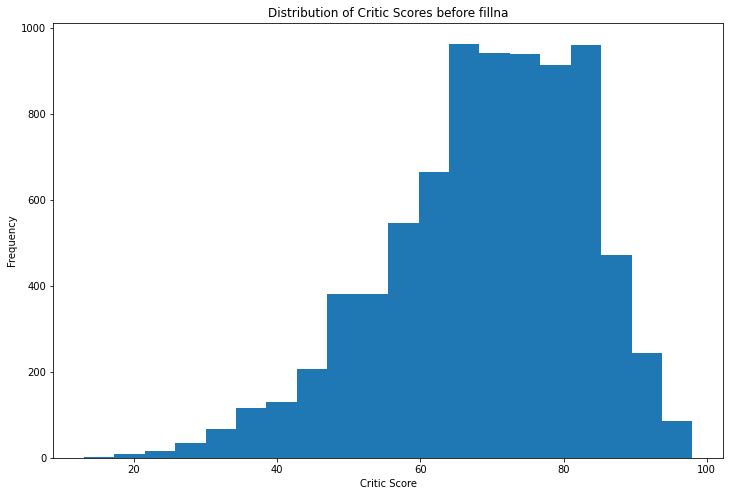

In [59]:
# Filter out rows where critic score is NaN
critic_scores = games['Critic_Score'].dropna()

# Create a histogram of critic score values
plt.figure(figsize=(12, 8))
plt.hist(critic_scores, bins=20)

# Set the title and axis labels
plt.title('Distribution of Critic Scores before fillna')
plt.xlabel('Critic Score')
plt.ylabel('Frequency')

# Show the plot
plt.show()

### Critic Count

In [60]:
#checking unique values for Critic Count
np.sort(games.Critic_Count.unique())

array([  3.,   4.,   5.,   6.,   7.,   8.,   9.,  10.,  11.,  12.,  13.,
        14.,  15.,  16.,  17.,  18.,  19.,  20.,  21.,  22.,  23.,  24.,
        25.,  26.,  27.,  28.,  29.,  30.,  31.,  32.,  33.,  34.,  35.,
        36.,  37.,  38.,  39.,  40.,  41.,  42.,  43.,  44.,  45.,  46.,
        47.,  48.,  49.,  50.,  51.,  52.,  53.,  54.,  55.,  56.,  57.,
        58.,  59.,  60.,  61.,  62.,  63.,  64.,  65.,  66.,  67.,  68.,
        69.,  70.,  71.,  72.,  73.,  74.,  75.,  76.,  77.,  78.,  79.,
        80.,  81.,  82.,  83.,  84.,  85.,  86.,  87.,  88.,  89.,  90.,
        91.,  92.,  93.,  94.,  95.,  96.,  97.,  98.,  99., 100., 101.,
       102., 103., 104., 105., 106., 107., 113.,  nan])

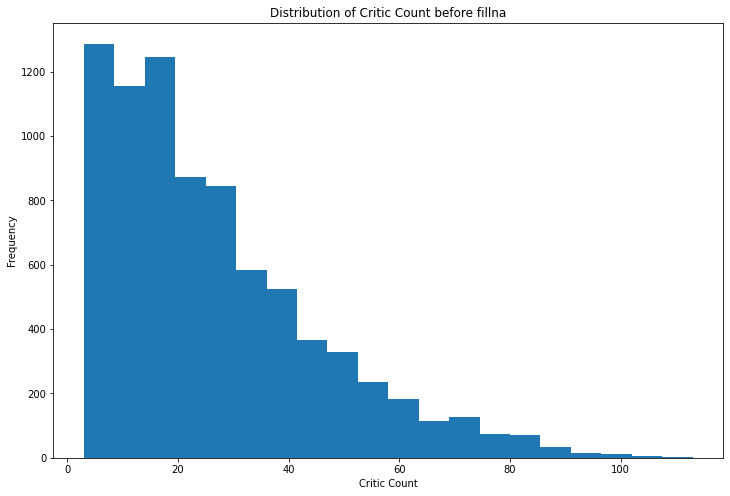

In [61]:
# Filter out rows where critic score is NaN
critic_count = games['Critic_Count'].dropna()

# Create a histogram of critic score values
plt.figure(figsize=(12, 8))
plt.hist(critic_count, bins=20)

# Set the title and axis labels
plt.title('Distribution of Critic Count before fillna')
plt.xlabel('Critic Count')
plt.ylabel('Frequency')

# Show the plot
plt.show()

### User Count

In [62]:
#checking unique values for User Count
np.sort(games.User_Count.unique())

array([4.0000e+00, 5.0000e+00, 6.0000e+00, 7.0000e+00, 8.0000e+00,
       9.0000e+00, 1.0000e+01, 1.1000e+01, 1.2000e+01, 1.3000e+01,
       1.4000e+01, 1.5000e+01, 1.6000e+01, 1.7000e+01, 1.8000e+01,
       1.9000e+01, 2.0000e+01, 2.1000e+01, 2.2000e+01, 2.3000e+01,
       2.4000e+01, 2.5000e+01, 2.6000e+01, 2.7000e+01, 2.8000e+01,
       2.9000e+01, 3.0000e+01, 3.1000e+01, 3.2000e+01, 3.3000e+01,
       3.4000e+01, 3.5000e+01, 3.6000e+01, 3.7000e+01, 3.8000e+01,
       3.9000e+01, 4.0000e+01, 4.1000e+01, 4.2000e+01, 4.3000e+01,
       4.4000e+01, 4.5000e+01, 4.6000e+01, 4.7000e+01, 4.8000e+01,
       4.9000e+01, 5.0000e+01, 5.1000e+01, 5.2000e+01, 5.3000e+01,
       5.4000e+01, 5.5000e+01, 5.6000e+01, 5.7000e+01, 5.8000e+01,
       5.9000e+01, 6.0000e+01, 6.1000e+01, 6.2000e+01, 6.3000e+01,
       6.4000e+01, 6.5000e+01, 6.6000e+01, 6.7000e+01, 6.8000e+01,
       6.9000e+01, 7.0000e+01, 7.1000e+01, 7.2000e+01, 7.3000e+01,
       7.4000e+01, 7.5000e+01, 7.6000e+01, 7.7000e+01, 7.8000e

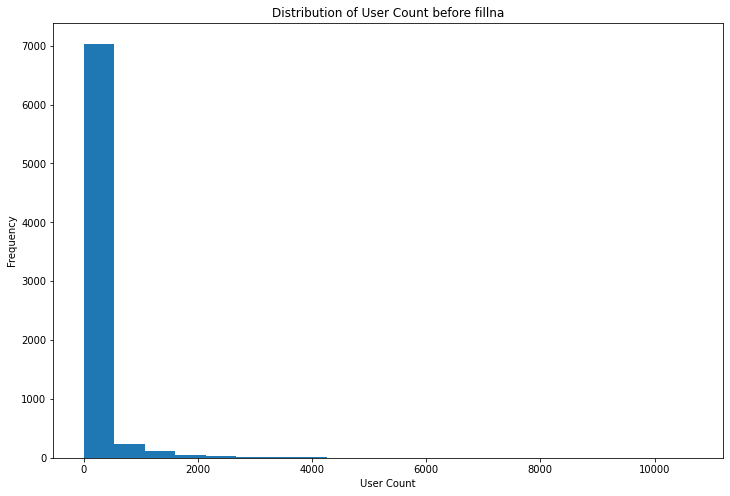

In [63]:
# Filter out rows where critic score is NaN
user_count = games['User_Count'].dropna()

# Create a histogram of critic score values
plt.figure(figsize=(12, 8))
plt.hist(user_count, bins=20)

# Set the title and axis labels
plt.title('Distribution of User Count before fillna')
plt.xlabel('User Count')
plt.ylabel('Frequency')

# Show the plot
plt.show()

### User Score

In [64]:
#unique values did not work here because there's text i
games.User_Score.unique()

array(['8', nan, '8.3', '8.5', '6.6', '8.4', '8.6', '7.7', '6.3', '7.4',
       '8.2', '9', '7.9', '8.1', '8.7', '7.1', '3.4', '5.3', '4.8', '3.2',
       '8.9', '6.4', '7.8', '7.5', '2.6', '7.2', '9.2', '7', '7.3', '4.3',
       '7.6', '5.7', '5', '9.1', '6.5', 'tbd', '8.8', '6.9', '9.4', '6.8',
       '6.1', '6.7', '5.4', '4', '4.9', '4.5', '9.3', '6.2', '4.2', '6',
       '3.7', '4.1', '5.8', '5.6', '5.5', '4.4', '4.6', '5.9', '3.9',
       '3.1', '2.9', '5.2', '3.3', '4.7', '5.1', '3.5', '2.5', '1.9', '3',
       '2.7', '2.2', '2', '9.5', '2.1', '3.6', '2.8', '1.8', '3.8', '0',
       '1.6', '9.6', '2.4', '1.7', '1.1', '0.3', '1.5', '0.7', '1.2',
       '2.3', '0.5', '1.3', '0.2', '0.6', '1.4', '0.9', '1', '9.7'],
      dtype=object)

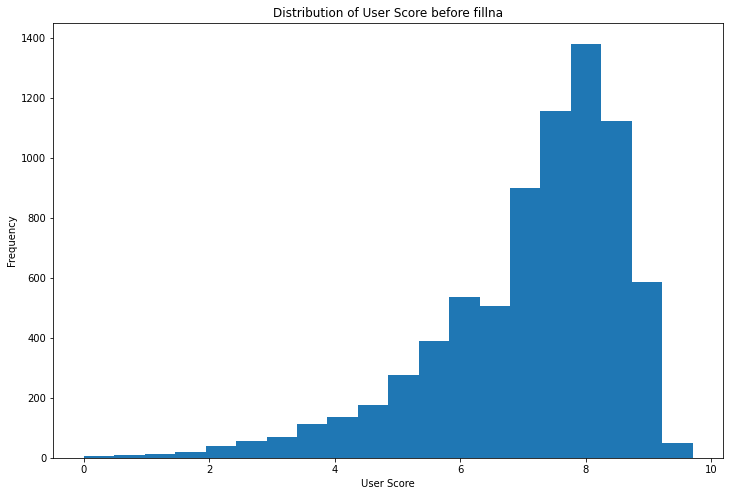

In [65]:
# Filter out rows where critic score is NaN or TBD
user_score = games[games['User_Score'].notna() & (games['User_Score'] != 'tbd')]['User_Score'].astype(float)

# Create a histogram of critic score values
plt.figure(figsize=(12, 8))
plt.hist(user_score, bins=20)

# Set the title and axis labels
plt.title('Distribution of User Score before fillna')
plt.xlabel('User Score')
plt.ylabel('Frequency')

# Show the plot
plt.show()

__Replace user score where values are tbd with nan__

In [66]:
games['User_Score'] = games['User_Score'].replace('tbd', np.nan)

In [67]:
games.User_Score.unique()

array(['8', nan, '8.3', '8.5', '6.6', '8.4', '8.6', '7.7', '6.3', '7.4',
       '8.2', '9', '7.9', '8.1', '8.7', '7.1', '3.4', '5.3', '4.8', '3.2',
       '8.9', '6.4', '7.8', '7.5', '2.6', '7.2', '9.2', '7', '7.3', '4.3',
       '7.6', '5.7', '5', '9.1', '6.5', '8.8', '6.9', '9.4', '6.8', '6.1',
       '6.7', '5.4', '4', '4.9', '4.5', '9.3', '6.2', '4.2', '6', '3.7',
       '4.1', '5.8', '5.6', '5.5', '4.4', '4.6', '5.9', '3.9', '3.1',
       '2.9', '5.2', '3.3', '4.7', '5.1', '3.5', '2.5', '1.9', '3', '2.7',
       '2.2', '2', '9.5', '2.1', '3.6', '2.8', '1.8', '3.8', '0', '1.6',
       '9.6', '2.4', '1.7', '1.1', '0.3', '1.5', '0.7', '1.2', '2.3',
       '0.5', '1.3', '0.2', '0.6', '1.4', '0.9', '1', '9.7'], dtype=object)

In [68]:
games['User_Score'] = games['User_Score'].astype(float)

In [69]:
np.sort(games.User_Score.unique())

array([0. , 0.2, 0.3, 0.5, 0.6, 0.7, 0.9, 1. , 1.1, 1.2, 1.3, 1.4, 1.5,
       1.6, 1.7, 1.8, 1.9, 2. , 2.1, 2.2, 2.3, 2.4, 2.5, 2.6, 2.7, 2.8,
       2.9, 3. , 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4. , 4.1,
       4.2, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5. , 5.1, 5.2, 5.3, 5.4,
       5.5, 5.6, 5.7, 5.8, 5.9, 6. , 6.1, 6.2, 6.3, 6.4, 6.5, 6.6, 6.7,
       6.8, 6.9, 7. , 7.1, 7.2, 7.3, 7.4, 7.5, 7.6, 7.7, 7.8, 7.9, 8. ,
       8.1, 8.2, 8.3, 8.4, 8.5, 8.6, 8.7, 8.8, 8.9, 9. , 9.1, 9.2, 9.3,
       9.4, 9.5, 9.6, 9.7, nan])

__Checking correlation of the variables__

In [70]:
games.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 16545 entries, 0 to 16718
Data columns (total 16 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Name             16545 non-null  object 
 1   Platform         16545 non-null  object 
 2   Year_of_Release  16545 non-null  int32  
 3   Genre            16545 non-null  object 
 4   Publisher        16545 non-null  object 
 5   NA_Sales         16545 non-null  float64
 6   EU_Sales         16545 non-null  float64
 7   JP_Sales         16545 non-null  float64
 8   Other_Sales      16545 non-null  float64
 9   Global_Sales     16545 non-null  float64
 10  Critic_Score     8078 non-null   float64
 11  Critic_Count     8078 non-null   float64
 12  User_Score       7541 non-null   float64
 13  User_Count       7541 non-null   float64
 14  Developer        10011 non-null  object 
 15  Rating           9870 non-null   object 
dtypes: float64(9), int32(1), object(6)
memory usage: 2.1+ MB


In [71]:
# Check correlation
games[['Critic_Score', 'Critic_Count', 'User_Score', 'User_Count']].corr()

,Critic_Score,Critic_Count,User_Score,User_Count
Critic_Score,1.000000,0.424878,0.579627,0.265120
Critic_Count,0.424878,1.000000,0.193497,0.363252
User_Score,0.579627,0.193497,1.000000,0.027162
User_Count,0.265120,0.363252,0.027162,1.000000


__Adding a column to impute binary values and understand which rows have null values before imputation__

In [72]:
#https://datacolumn.iaa.ncsu.edu/blog/2016/02/29/whats-missing-solving-the-missing-values-dilemma/#:~:text=If%20a%20variable%20has%20more,information%20to%20ascertain%20anything%20useful.
#https://datascience.stackexchange.com/questions/67512/what-do-i-do-when-my-column-has-50-data-missing
#https://discuss.analyticsvidhya.com/t/what-should-be-the-allowed-percentage-of-missing-values/2456/2
games['has_critic_score'] = np.where(games['Critic_Score'].notnull(), 0, 1)
games['has_critic_count'] = np.where(games['Critic_Count'].notnull(), 0, 1)
games['has_user_score'] = np.where(games['User_Score'].notnull(), 0, 1)
games['has_user_count'] = np.where(games['User_Count'].notnull(), 0, 1)

In [73]:
games.head()

,Name,Platform,Year_of_Release,Genre,Publisher,NA_Sales,EU_Sales,JP_Sales,Other_Sales,Global_Sales,Critic_Score,Critic_Count,User_Score,User_Count,Developer,Rating,has_critic_score,has_critic_count,has_user_score,has_user_count
0,Wii Sports,Wii,2006,Sports,Nintendo,41.36,28.96,3.77,8.45,82.53,76.0,51.0,8.0,322.0,Nintendo,E,0,0,0,0
1,Super Mario Bros.,NES,1985,Platform,Nintendo,29.08,3.58,6.81,0.77,40.24,NaN,NaN,NaN,NaN,NaN,NaN,1,1,1,1
2,Mario Kart Wii,Wii,2008,Racing,Nintendo,15.68,12.76,3.79,3.29,35.52,82.0,73.0,8.3,709.0,Nintendo,E,0,0,0,0
3,Wii Sports Resort,Wii,2009,Sports,Nintendo,15.61,10.93,3.28,2.95,32.77,80.0,73.0,8.0,192.0,Nintendo,E,0,0,0,0
4,Pokemon Red/Pokemon Blue,GB,1996,Role-Playing,Nintendo,11.27,8.89,10.22,1.00,31.37,NaN,NaN,NaN,NaN,NaN,NaN,1,1,1,1


In [74]:
mean_values = games.mean()
median_values = games.median()

print("Mean Values:")
print(mean_values)
print ('\n')
print("Median Values:")
print(median_values)

Mean Values:
Year_of_Release     2006.494832
NA_Sales               0.264023
EU_Sales               0.145885
JP_Sales               0.078128
Other_Sales            0.047633
Global_Sales           0.535921
Critic_Score          68.991830
Critic_Count          26.367541
User_Score             7.126071
User_Count           162.748442
has_critic_score       0.511756
has_critic_count       0.511756
has_user_score         0.544213
has_user_count         0.544213
dtype: float64


Median Values:
Year_of_Release     2007.00
NA_Sales               0.08
EU_Sales               0.02
JP_Sales               0.00
Other_Sales            0.01
Global_Sales           0.17
Critic_Score          71.00
Critic_Count          21.00
User_Score             7.50
User_Count            24.00
has_critic_score       1.00
has_critic_count       1.00
has_user_score         1.00
has_user_count         1.00
dtype: float64


__Fill the missing scores based on the average of scores by publisher, year and genre__

In [75]:
games.head(50)

,Name,Platform,Year_of_Release,Genre,Publisher,NA_Sales,EU_Sales,JP_Sales,Other_Sales,Global_Sales,Critic_Score,Critic_Count,User_Score,User_Count,Developer,Rating,has_critic_score,has_critic_count,has_user_score,has_user_count
0,Wii Sports,Wii,2006,Sports,Nintendo,41.36,28.96,3.77,8.45,82.53,76.0,51.0,8.0,322.0,Nintendo,E,0,0,0,0
1,Super Mario Bros.,NES,1985,Platform,Nintendo,29.08,3.58,6.81,0.77,40.24,NaN,NaN,NaN,NaN,NaN,NaN,1,1,1,1
2,Mario Kart Wii,Wii,2008,Racing,Nintendo,15.68,12.76,3.79,3.29,35.52,82.0,73.0,8.3,709.0,Nintendo,E,0,0,0,0
3,Wii Sports Resort,Wii,2009,Sports,Nintendo,15.61,10.93,3.28,2.95,32.77,80.0,73.0,8.0,192.0,Nintendo,E,0,0,0,0
4,Pokemon Red/Pokemon Blue,GB,1996,Role-Playing,Nintendo,11.27,8.89,10.22,1.00,31.37,NaN,NaN,NaN,NaN,NaN,NaN,1,1,1,1
5,Tetris,GB,1989,Puzzle,Nintendo,23.20,2.26,4.22,0.58,30.26,NaN,NaN,NaN,NaN,NaN,NaN,1,1,1,1
6,New Super Mario Bros.,DS,2006,Platform,Nintendo,11.28,9.14,6.50,2.88,29.80,89.0,65.0,8.5,431.0,Nintendo,E,0,0,0,0
7,Wii Play,Wii,2006,Misc,Nintendo,13.96,9.18,2.93,2.84,28.92,58.0,41.0,6.6,129.0,Nintendo,E,0,0,0,0
8,New Super Mario Bros. Wii,Wii,2009,Platform,Nintendo,14.44,6.94,4.70,2.24,28.32,87.0,80.0,8.4,594.0,Nintendo,E,0,0,0,0
9,Duck Hunt,NES,1984,Shooter,Nintendo,26.93,0.63,0.28,0.47,28.31,NaN,NaN,NaN,NaN,NaN,NaN,1,1,1,1


In [76]:
games = games.sort_values('Name', ascending=True)
games.head(200)

,Name,Platform,Year_of_Release,Genre,Publisher,NA_Sales,EU_Sales,JP_Sales,Other_Sales,Global_Sales,Critic_Score,Critic_Count,User_Score,User_Count,Developer,Rating,has_critic_score,has_critic_count,has_user_score,has_user_count
14985,Beyblade Burst,3DS,2016,Role-Playing,FuRyu,0.00,0.00,0.03,0.00,0.03,NaN,NaN,NaN,NaN,NaN,NaN,1,1,1,1
1079,Fire Emblem Fates,3DS,2015,Role-Playing,Nintendo,0.81,0.23,0.52,0.11,1.68,NaN,NaN,NaN,NaN,NaN,NaN,1,1,1,1
3862,Frozen: Olaf's Quest,DS,2013,Platform,Disney Interactive Studios,0.21,0.26,0.00,0.04,0.52,NaN,NaN,NaN,NaN,NaN,NaN,1,1,1,1
3358,Frozen: Olaf's Quest,3DS,2013,Platform,Disney Interactive Studios,0.27,0.27,0.00,0.05,0.60,NaN,NaN,NaN,NaN,NaN,NaN,1,1,1,1
13795,Haikyu!! Cross Team Match!,3DS,2016,Adventure,Namco Bandai Games,0.00,0.00,0.04,0.00,0.04,NaN,NaN,NaN,NaN,NaN,NaN,1,1,1,1
2454,Tales of Xillia 2,PS3,2012,Role-Playing,Namco Bandai Games,0.20,0.12,0.45,0.07,0.84,71.0,59.0,7.9,216.0,Bandai Namco Games,T,0,0,0,0
4728,'98 Koshien,PS,1998,Sports,Magical Company,0.15,0.10,0.12,0.03,0.41,NaN,NaN,NaN,NaN,NaN,NaN,1,1,1,1
8343,.hack//G.U. Vol.1//Rebirth,PS2,2006,Role-Playing,Namco Bandai Games,0.00,0.00,0.17,0.00,0.17,NaN,NaN,NaN,NaN,NaN,NaN,1,1,1,1
7088,.hack//G.U. Vol.2//Reminisce,PS2,2006,Role-Playing,Namco Bandai Games,0.11,0.09,0.00,0.03,0.23,NaN,NaN,NaN,NaN,NaN,NaN,1,1,1,1
8598,.hack//G.U. Vol.2//Reminisce (jp sales),PS2,2006,Role-Playing,Namco Bandai Games,0.00,0.00,0.16,0.00,0.16,NaN,NaN,NaN,NaN,NaN,NaN,1,1,1,1


In [77]:
games.isnull().sum()

Name                   0
Platform               0
Year_of_Release        0
Genre                  0
Publisher              0
NA_Sales               0
EU_Sales               0
JP_Sales               0
Other_Sales            0
Global_Sales           0
Critic_Score        8467
Critic_Count        8467
User_Score          9004
User_Count          9004
Developer           6534
Rating              6675
has_critic_score       0
has_critic_count       0
has_user_score         0
has_user_count         0
dtype: int64

### Earlier we saw that Critic_Score and User_score have a relatively strong positive correlation of about 60% (also shown below). Therefore, the approach to fill the nans for this columns will involve taking the average of these 2 columns and using it to fill the nans.
 - Points to note are that user score ranges between 0 and 10
 - Critic score ranges between 0 and 100
 
 What this means is that one of them will either be multiplied or divided by 10.

In [79]:
# Check correlation
games[['Critic_Score', 'Critic_Count', 'User_Score', 'User_Count']].corr()

,Critic_Score,Critic_Count,User_Score,User_Count
Critic_Score,1.000000,0.424878,0.579627,0.265120
Critic_Count,0.424878,1.000000,0.193497,0.363252
User_Score,0.579627,0.193497,1.000000,0.027162
User_Count,0.265120,0.363252,0.027162,1.000000


__Creating a new column with these average scores__

In [80]:
games['Average_Score'] = (games['User_Score'] + games['Critic_Score']/10)/2
games.head(20)

,Name,Platform,Year_of_Release,Genre,Publisher,NA_Sales,EU_Sales,JP_Sales,Other_Sales,Global_Sales,Critic_Score,Critic_Count,User_Score,User_Count,Developer,Rating,has_critic_score,has_critic_count,has_user_score,has_user_count,Average_Score
14985,Beyblade Burst,3DS,2016,Role-Playing,FuRyu,0.00,0.00,0.03,0.00,0.03,NaN,NaN,NaN,NaN,NaN,NaN,1,1,1,1,NaN
1079,Fire Emblem Fates,3DS,2015,Role-Playing,Nintendo,0.81,0.23,0.52,0.11,1.68,NaN,NaN,NaN,NaN,NaN,NaN,1,1,1,1,NaN
3862,Frozen: Olaf's Quest,DS,2013,Platform,Disney Interactive Studios,0.21,0.26,0.00,0.04,0.52,NaN,NaN,NaN,NaN,NaN,NaN,1,1,1,1,NaN
3358,Frozen: Olaf's Quest,3DS,2013,Platform,Disney Interactive Studios,0.27,0.27,0.00,0.05,0.60,NaN,NaN,NaN,NaN,NaN,NaN,1,1,1,1,NaN
13795,Haikyu!! Cross Team Match!,3DS,2016,Adventure,Namco Bandai Games,0.00,0.00,0.04,0.00,0.04,NaN,NaN,NaN,NaN,NaN,NaN,1,1,1,1,NaN
2454,Tales of Xillia 2,PS3,2012,Role-Playing,Namco Bandai Games,0.20,0.12,0.45,0.07,0.84,71.0,59.0,7.9,216.0,Bandai Namco Games,T,0,0,0,0,7.50
4728,'98 Koshien,PS,1998,Sports,Magical Company,0.15,0.10,0.12,0.03,0.41,NaN,NaN,NaN,NaN,NaN,NaN,1,1,1,1,NaN
8343,.hack//G.U. Vol.1//Rebirth,PS2,2006,Role-Playing,Namco Bandai Games,0.00,0.00,0.17,0.00,0.17,NaN,NaN,NaN,NaN,NaN,NaN,1,1,1,1,NaN
7088,.hack//G.U. Vol.2//Reminisce,PS2,2006,Role-Playing,Namco Bandai Games,0.11,0.09,0.00,0.03,0.23,NaN,NaN,NaN,NaN,NaN,NaN,1,1,1,1,NaN
8598,.hack//G.U. Vol.2//Reminisce (jp sales),PS2,2006,Role-Playing,Namco Bandai Games,0.00,0.00,0.16,0.00,0.16,NaN,NaN,NaN,NaN,NaN,NaN,1,1,1,1,NaN


### For the Critic Score, fill with the average of average_scores for the Publisher, genre and year_Step 1

In [81]:
# Calculate the average score for each group of games
grouped_scores = games.groupby(['Publisher', 'Genre', 'Year_of_Release'])['Average_Score'].transform(lambda x: x.mean())

# Fill the NaN values in critic_score with the corresponding group average multiplied by 10
games['Critic_Score'] = games['Critic_Score'].fillna(grouped_scores * 10)

In [82]:
games.isnull().sum()

Name                   0
Platform               0
Year_of_Release        0
Genre                  0
Publisher              0
NA_Sales               0
EU_Sales               0
JP_Sales               0
Other_Sales            0
Global_Sales           0
Critic_Score        5080
Critic_Count        8467
User_Score          9004
User_Count          9004
Developer           6534
Rating              6675
has_critic_score       0
has_critic_count       0
has_user_score         0
has_user_count         0
Average_Score       9574
dtype: int64

In [83]:
games.head(20)

,Name,Platform,Year_of_Release,Genre,Publisher,NA_Sales,EU_Sales,JP_Sales,Other_Sales,Global_Sales,Critic_Score,Critic_Count,User_Score,User_Count,Developer,Rating,has_critic_score,has_critic_count,has_user_score,has_user_count,Average_Score
14985,Beyblade Burst,3DS,2016,Role-Playing,FuRyu,0.00,0.00,0.03,0.00,0.03,NaN,NaN,NaN,NaN,NaN,NaN,1,1,1,1,NaN
1079,Fire Emblem Fates,3DS,2015,Role-Playing,Nintendo,0.81,0.23,0.52,0.11,1.68,80.833333,NaN,NaN,NaN,NaN,NaN,1,1,1,1,NaN
3862,Frozen: Olaf's Quest,DS,2013,Platform,Disney Interactive Studios,0.21,0.26,0.00,0.04,0.52,NaN,NaN,NaN,NaN,NaN,NaN,1,1,1,1,NaN
3358,Frozen: Olaf's Quest,3DS,2013,Platform,Disney Interactive Studios,0.27,0.27,0.00,0.05,0.60,NaN,NaN,NaN,NaN,NaN,NaN,1,1,1,1,NaN
13795,Haikyu!! Cross Team Match!,3DS,2016,Adventure,Namco Bandai Games,0.00,0.00,0.04,0.00,0.04,NaN,NaN,NaN,NaN,NaN,NaN,1,1,1,1,NaN
2454,Tales of Xillia 2,PS3,2012,Role-Playing,Namco Bandai Games,0.20,0.12,0.45,0.07,0.84,71.000000,59.0,7.9,216.0,Bandai Namco Games,T,0,0,0,0,7.50
4728,'98 Koshien,PS,1998,Sports,Magical Company,0.15,0.10,0.12,0.03,0.41,NaN,NaN,NaN,NaN,NaN,NaN,1,1,1,1,NaN
8343,.hack//G.U. Vol.1//Rebirth,PS2,2006,Role-Playing,Namco Bandai Games,0.00,0.00,0.17,0.00,0.17,72.200000,NaN,NaN,NaN,NaN,NaN,1,1,1,1,NaN
7088,.hack//G.U. Vol.2//Reminisce,PS2,2006,Role-Playing,Namco Bandai Games,0.11,0.09,0.00,0.03,0.23,72.200000,NaN,NaN,NaN,NaN,NaN,1,1,1,1,NaN
8598,.hack//G.U. Vol.2//Reminisce (jp sales),PS2,2006,Role-Playing,Namco Bandai Games,0.00,0.00,0.16,0.00,0.16,72.200000,NaN,NaN,NaN,NaN,NaN,1,1,1,1,NaN


### For the Critic Score, fill with the average of average_scores for the genre and year_Step 2

In [84]:
# Calculate the average score for each group of games
grouped_scores_2 = games.groupby(['Genre', 'Year_of_Release'])['Average_Score'].transform(lambda x: x.mean())

# Fill the NaN values in critic_score with the corresponding group average multiplied by 10
games['Critic_Score'] = games['Critic_Score'].fillna(grouped_scores_2 * 10)

In [85]:
games.isnull().sum()

Name                   0
Platform               0
Year_of_Release        0
Genre                  0
Publisher              0
NA_Sales               0
EU_Sales               0
JP_Sales               0
Other_Sales            0
Global_Sales           0
Critic_Score         971
Critic_Count        8467
User_Score          9004
User_Count          9004
Developer           6534
Rating              6675
has_critic_score       0
has_critic_count       0
has_user_score         0
has_user_count         0
Average_Score       9574
dtype: int64

In [86]:
games.head(20)

,Name,Platform,Year_of_Release,Genre,Publisher,NA_Sales,EU_Sales,JP_Sales,Other_Sales,Global_Sales,Critic_Score,Critic_Count,User_Score,User_Count,Developer,Rating,has_critic_score,has_critic_count,has_user_score,has_user_count,Average_Score
14985,Beyblade Burst,3DS,2016,Role-Playing,FuRyu,0.00,0.00,0.03,0.00,0.03,76.761905,NaN,NaN,NaN,NaN,NaN,1,1,1,1,NaN
1079,Fire Emblem Fates,3DS,2015,Role-Playing,Nintendo,0.81,0.23,0.52,0.11,1.68,80.833333,NaN,NaN,NaN,NaN,NaN,1,1,1,1,NaN
3862,Frozen: Olaf's Quest,DS,2013,Platform,Disney Interactive Studios,0.21,0.26,0.00,0.04,0.52,69.520833,NaN,NaN,NaN,NaN,NaN,1,1,1,1,NaN
3358,Frozen: Olaf's Quest,3DS,2013,Platform,Disney Interactive Studios,0.27,0.27,0.00,0.05,0.60,69.520833,NaN,NaN,NaN,NaN,NaN,1,1,1,1,NaN
13795,Haikyu!! Cross Team Match!,3DS,2016,Adventure,Namco Bandai Games,0.00,0.00,0.04,0.00,0.04,75.750000,NaN,NaN,NaN,NaN,NaN,1,1,1,1,NaN
2454,Tales of Xillia 2,PS3,2012,Role-Playing,Namco Bandai Games,0.20,0.12,0.45,0.07,0.84,71.000000,59.0,7.9,216.0,Bandai Namco Games,T,0,0,0,0,7.50
4728,'98 Koshien,PS,1998,Sports,Magical Company,0.15,0.10,0.12,0.03,0.41,90.500000,NaN,NaN,NaN,NaN,NaN,1,1,1,1,NaN
8343,.hack//G.U. Vol.1//Rebirth,PS2,2006,Role-Playing,Namco Bandai Games,0.00,0.00,0.17,0.00,0.17,72.200000,NaN,NaN,NaN,NaN,NaN,1,1,1,1,NaN
7088,.hack//G.U. Vol.2//Reminisce,PS2,2006,Role-Playing,Namco Bandai Games,0.11,0.09,0.00,0.03,0.23,72.200000,NaN,NaN,NaN,NaN,NaN,1,1,1,1,NaN
8598,.hack//G.U. Vol.2//Reminisce (jp sales),PS2,2006,Role-Playing,Namco Bandai Games,0.00,0.00,0.16,0.00,0.16,72.200000,NaN,NaN,NaN,NaN,NaN,1,1,1,1,NaN


### For the Critic Score, fill with the average of average_scores for the Publisher and year_Step 3

In [87]:
# Calculate the average score for each group of games
grouped_scores_3 = games.groupby(['Publisher', 'Year_of_Release'])['Average_Score'].transform(lambda x: x.mean())

# Fill the NaN values in critic_score with the corresponding group average multiplied by 10
games['Critic_Score'] = games['Critic_Score'].fillna(grouped_scores_3 * 10)

In [88]:
games.isnull().sum()

Name                   0
Platform               0
Year_of_Release        0
Genre                  0
Publisher              0
NA_Sales               0
EU_Sales               0
JP_Sales               0
Other_Sales            0
Global_Sales           0
Critic_Score         888
Critic_Count        8467
User_Score          9004
User_Count          9004
Developer           6534
Rating              6675
has_critic_score       0
has_critic_count       0
has_user_score         0
has_user_count         0
Average_Score       9574
dtype: int64

### For the Critic Score, fill with the average of average_scores for the genre_Step 4

In [89]:
# Calculate the average score for each group of games
grouped_scores_4 = games.groupby(['Genre'])['Average_Score'].transform(lambda x: x.mean())

# Fill the NaN values in critic_score with the corresponding group average multiplied by 10
games['Critic_Score'] = games['Critic_Score'].fillna(grouped_scores_4 * 10)

In [90]:
games.isnull().sum()

Name                   0
Platform               0
Year_of_Release        0
Genre                  0
Publisher              0
NA_Sales               0
EU_Sales               0
JP_Sales               0
Other_Sales            0
Global_Sales           0
Critic_Score           0
Critic_Count        8467
User_Score          9004
User_Count          9004
Developer           6534
Rating              6675
has_critic_score       0
has_critic_count       0
has_user_score         0
has_user_count         0
Average_Score       9574
dtype: int64

### The same approach will be taken for User_score

### For the User Score, fill with the average of average_scores for the Publisher, genre and year_Step 1

In [91]:
# Calculate the average score for each group of games
grouped_scores_user = games.groupby(['Publisher', 'Genre', 'Year_of_Release'])['Average_Score'].transform(lambda x: x.mean())

# Fill the NaN values in user_score with the corresponding group average
games['User_Score'] = games['User_Score'].fillna(grouped_scores_user)

In [92]:
games.isnull().sum()

Name                   0
Platform               0
Year_of_Release        0
Genre                  0
Publisher              0
NA_Sales               0
EU_Sales               0
JP_Sales               0
Other_Sales            0
Global_Sales           0
Critic_Score           0
Critic_Count        8467
User_Score          5343
User_Count          9004
Developer           6534
Rating              6675
has_critic_score       0
has_critic_count       0
has_user_score         0
has_user_count         0
Average_Score       9574
dtype: int64

### For the User Score, fill with the average of average_scores for the genre and year_Step 2

In [93]:
# Calculate the average score for each group of games
grouped_scores_user_2 = games.groupby(['Genre', 'Year_of_Release'])['Average_Score'].transform(lambda x: x.mean())

# Fill the NaN values in critic_score with the corresponding group average multiplied by 10
games['User_Score'] = games['User_Score'].fillna(grouped_scores_user_2)

In [94]:
games.isnull().sum()

Name                   0
Platform               0
Year_of_Release        0
Genre                  0
Publisher              0
NA_Sales               0
EU_Sales               0
JP_Sales               0
Other_Sales            0
Global_Sales           0
Critic_Score           0
Critic_Count        8467
User_Score           972
User_Count          9004
Developer           6534
Rating              6675
has_critic_score       0
has_critic_count       0
has_user_score         0
has_user_count         0
Average_Score       9574
dtype: int64

### For the User Score, fill with the average of average_scores for the Publisher and year_Step 3

In [95]:
# Calculate the average score for each group of games
grouped_scores_user_3 = games.groupby(['Publisher', 'Year_of_Release'])['Average_Score'].transform(lambda x: x.mean())

# Fill the NaN values in critic_score with the corresponding group average multiplied by 10
games['User_Score'] = games['User_Score'].fillna(grouped_scores_user_3)

In [96]:
games.isnull().sum()

Name                   0
Platform               0
Year_of_Release        0
Genre                  0
Publisher              0
NA_Sales               0
EU_Sales               0
JP_Sales               0
Other_Sales            0
Global_Sales           0
Critic_Score           0
Critic_Count        8467
User_Score           888
User_Count          9004
Developer           6534
Rating              6675
has_critic_score       0
has_critic_count       0
has_user_score         0
has_user_count         0
Average_Score       9574
dtype: int64

### For the User Score, fill with the average of average_scores for the genre_Step 4

In [97]:
# Calculate the average score for each group of games
grouped_scores_user_4 = games.groupby(['Genre'])['Average_Score'].transform(lambda x: x.mean())

# Fill the NaN values in critic_score with the corresponding group average multiplied by 10
games['User_Score'] = games['User_Score'].fillna(grouped_scores_user_4)

In [98]:
games.isnull().sum()

Name                   0
Platform               0
Year_of_Release        0
Genre                  0
Publisher              0
NA_Sales               0
EU_Sales               0
JP_Sales               0
Other_Sales            0
Global_Sales           0
Critic_Score           0
Critic_Count        8467
User_Score             0
User_Count          9004
Developer           6534
Rating              6675
has_critic_score       0
has_critic_count       0
has_user_score         0
has_user_count         0
Average_Score       9574
dtype: int64

In [99]:
mean_values = games.mean()
median_values = games.median()

print("Mean Values:")
print(mean_values)
print ('\n')
print("Median Values:")
print(median_values)

Mean Values:
Year_of_Release     2006.494832
NA_Sales               0.264023
EU_Sales               0.145885
JP_Sales               0.078128
Other_Sales            0.047633
Global_Sales           0.535921
Critic_Score          70.233339
Critic_Count          26.367541
User_Score             7.131039
User_Count           162.748442
has_critic_score       0.511756
has_critic_count       0.511756
has_user_score         0.544213
has_user_count         0.544213
Average_Score          7.104849
dtype: float64


Median Values:
Year_of_Release     2007.00
NA_Sales               0.08
EU_Sales               0.02
JP_Sales               0.00
Other_Sales            0.01
Global_Sales           0.17
Critic_Score          71.00
Critic_Count          21.00
User_Score             7.20
User_Count            24.00
has_critic_score       1.00
has_critic_count       1.00
has_user_score         1.00
has_user_count         1.00
Average_Score          7.35
dtype: float64


In [100]:
games.head()

,Name,Platform,Year_of_Release,Genre,Publisher,NA_Sales,EU_Sales,JP_Sales,Other_Sales,Global_Sales,Critic_Score,Critic_Count,User_Score,User_Count,Developer,Rating,has_critic_score,has_critic_count,has_user_score,has_user_count,Average_Score
14985,Beyblade Burst,3DS,2016,Role-Playing,FuRyu,0.00,0.00,0.03,0.00,0.03,76.761905,NaN,7.676190,NaN,NaN,NaN,1,1,1,1,NaN
1079,Fire Emblem Fates,3DS,2015,Role-Playing,Nintendo,0.81,0.23,0.52,0.11,1.68,80.833333,NaN,8.083333,NaN,NaN,NaN,1,1,1,1,NaN
3862,Frozen: Olaf's Quest,DS,2013,Platform,Disney Interactive Studios,0.21,0.26,0.00,0.04,0.52,69.520833,NaN,6.952083,NaN,NaN,NaN,1,1,1,1,NaN
3358,Frozen: Olaf's Quest,3DS,2013,Platform,Disney Interactive Studios,0.27,0.27,0.00,0.05,0.60,69.520833,NaN,6.952083,NaN,NaN,NaN,1,1,1,1,NaN
13795,Haikyu!! Cross Team Match!,3DS,2016,Adventure,Namco Bandai Games,0.00,0.00,0.04,0.00,0.04,75.750000,NaN,7.575000,NaN,NaN,NaN,1,1,1,1,NaN


In [101]:
# Check correlation
games[['Critic_Score', 'Critic_Count', 'User_Score', 'User_Count']].corr()

,Critic_Score,Critic_Count,User_Score,User_Count
Critic_Score,1.000000,0.424878,0.654841,0.261564
Critic_Count,0.424878,1.000000,0.200785,0.363252
User_Score,0.654841,0.200785,1.000000,0.027162
User_Count,0.261564,0.363252,0.027162,1.000000


__There is no clear correlation between scores and count, falling below 0.5 for across the critic and use groups__

### For the user and critic counts, fillna will be done with averages of the count for the year and genre

Filling based on year and genre

In [102]:
games['Critic_Count'] = games.groupby(['Genre', 'Year_of_Release'])['Critic_Count'].transform(lambda x: x.fillna(x.mean()))
games.isnull().sum()

Name                   0
Platform               0
Year_of_Release        0
Genre                  0
Publisher              0
NA_Sales               0
EU_Sales               0
JP_Sales               0
Other_Sales            0
Global_Sales           0
Critic_Score           0
Critic_Count         936
User_Score             0
User_Count          9004
Developer           6534
Rating              6675
has_critic_score       0
has_critic_count       0
has_user_score         0
has_user_count         0
Average_Score       9574
dtype: int64

In [103]:
games['User_Count'] = games.groupby(['Genre', 'Year_of_Release'])['User_Count'].transform(lambda x: x.fillna(x.mean()))
games.isnull().sum()

Name                   0
Platform               0
Year_of_Release        0
Genre                  0
Publisher              0
NA_Sales               0
EU_Sales               0
JP_Sales               0
Other_Sales            0
Global_Sales           0
Critic_Score           0
Critic_Count         936
User_Score             0
User_Count           953
Developer           6534
Rating              6675
has_critic_score       0
has_critic_count       0
has_user_score         0
has_user_count         0
Average_Score       9574
dtype: int64

Filling based on genre

In [104]:
games['Critic_Count'] = games.groupby(['Genre'])['Critic_Count'].transform(lambda x: x.fillna(x.mean()))
games.isnull().sum()

Name                   0
Platform               0
Year_of_Release        0
Genre                  0
Publisher              0
NA_Sales               0
EU_Sales               0
JP_Sales               0
Other_Sales            0
Global_Sales           0
Critic_Score           0
Critic_Count           0
User_Score             0
User_Count           953
Developer           6534
Rating              6675
has_critic_score       0
has_critic_count       0
has_user_score         0
has_user_count         0
Average_Score       9574
dtype: int64

In [105]:
games['User_Count'] = games.groupby(['Genre'])['User_Count'].transform(lambda x: x.fillna(x.mean()))
games.isnull().sum()

Name                   0
Platform               0
Year_of_Release        0
Genre                  0
Publisher              0
NA_Sales               0
EU_Sales               0
JP_Sales               0
Other_Sales            0
Global_Sales           0
Critic_Score           0
Critic_Count           0
User_Score             0
User_Count             0
Developer           6534
Rating              6675
has_critic_score       0
has_critic_count       0
has_user_score         0
has_user_count         0
Average_Score       9574
dtype: int64

## DEVELOPER: Data Cleaning
__The developer should have a relationship with the publisher column as it's been seen with Nintendo__

In [106]:
games.head(500)

,Name,Platform,Year_of_Release,Genre,Publisher,NA_Sales,EU_Sales,JP_Sales,Other_Sales,Global_Sales,Critic_Score,Critic_Count,User_Score,User_Count,Developer,Rating,has_critic_score,has_critic_count,has_user_score,has_user_count,Average_Score
14985,Beyblade Burst,3DS,2016,Role-Playing,FuRyu,0.00,0.00,0.03,0.00,0.03,76.761905,35.285714,7.676190,349.272727,NaN,NaN,1,1,1,1,NaN
1079,Fire Emblem Fates,3DS,2015,Role-Playing,Nintendo,0.81,0.23,0.52,0.11,1.68,80.833333,34.862069,8.083333,1311.575758,NaN,NaN,1,1,1,1,NaN
3862,Frozen: Olaf's Quest,DS,2013,Platform,Disney Interactive Studios,0.21,0.26,0.00,0.04,0.52,69.520833,33.625000,6.952083,213.241379,NaN,NaN,1,1,1,1,NaN
3358,Frozen: Olaf's Quest,3DS,2013,Platform,Disney Interactive Studios,0.27,0.27,0.00,0.05,0.60,69.520833,33.625000,6.952083,213.241379,NaN,NaN,1,1,1,1,NaN
13795,Haikyu!! Cross Team Match!,3DS,2016,Adventure,Namco Bandai Games,0.00,0.00,0.04,0.00,0.04,75.750000,21.500000,7.575000,210.368421,NaN,NaN,1,1,1,1,NaN
2454,Tales of Xillia 2,PS3,2012,Role-Playing,Namco Bandai Games,0.20,0.12,0.45,0.07,0.84,71.000000,59.000000,7.900000,216.000000,Bandai Namco Games,T,0,0,0,0,7.50
4728,'98 Koshien,PS,1998,Sports,Magical Company,0.15,0.10,0.12,0.03,0.41,90.500000,4.000000,9.050000,40.000000,NaN,NaN,1,1,1,1,NaN
8343,.hack//G.U. Vol.1//Rebirth,PS2,2006,Role-Playing,Namco Bandai Games,0.00,0.00,0.17,0.00,0.17,72.200000,32.939394,7.220000,132.575758,NaN,NaN,1,1,1,1,NaN
7088,.hack//G.U. Vol.2//Reminisce,PS2,2006,Role-Playing,Namco Bandai Games,0.11,0.09,0.00,0.03,0.23,72.200000,32.939394,7.220000,132.575758,NaN,NaN,1,1,1,1,NaN
8598,.hack//G.U. Vol.2//Reminisce (jp sales),PS2,2006,Role-Playing,Namco Bandai Games,0.00,0.00,0.16,0.00,0.16,72.200000,32.939394,7.220000,132.575758,NaN,NaN,1,1,1,1,NaN


In [107]:
games.Developer.value_counts()

Ubisoft                                                                             203
EA Sports                                                                           171
EA Canada                                                                           167
Konami                                                                              159
Capcom                                                                              139
EA Tiburon                                                                          108
Electronic Arts                                                                     102
Ubisoft Montreal                                                                    101
Visual Concepts                                                                      99
Omega Force                                                                          80
Vicarious Visions                                                                    76
Traveller's Tales               

In [108]:
len(games.Developer.unique())

1683

In [109]:
nintendo_df = games[games['Publisher'] == 'Nintendo']
nintendo_df

,Name,Platform,Year_of_Release,Genre,Publisher,NA_Sales,EU_Sales,JP_Sales,Other_Sales,Global_Sales,Critic_Score,Critic_Count,User_Score,User_Count,Developer,Rating,has_critic_score,has_critic_count,has_user_score,has_user_count,Average_Score
1079,Fire Emblem Fates,3DS,2015,Role-Playing,Nintendo,0.81,0.23,0.52,0.11,1.68,80.833333,34.862069,8.083333,1311.575758,NaN,NaN,1,1,1,1,NaN
3054,100 Classic Books,DS,2008,Misc,Nintendo,0.12,0.52,0.00,0.02,0.66,70.000000,7.000000,6.000000,12.000000,Genius Sonority Inc.,NaN,0,0,0,0,6.50
14808,1000 Cooking Recipes from ELLE à table,DS,2010,Misc,Nintendo,0.00,0.02,0.00,0.00,0.03,74.250000,24.222222,7.425000,23.348837,NaN,NaN,1,1,1,1,NaN
839,1080°: TenEighty Snowboarding,N64,1998,Sports,Nintendo,1.25,0.61,0.13,0.05,2.03,90.500000,4.000000,9.050000,40.000000,NaN,NaN,1,1,1,1,NaN
1318,4 Nin uchi Mahjong,NES,1984,Misc,Nintendo,0.00,0.00,1.45,0.00,1.45,67.901535,21.466105,6.790153,30.146225,NaN,NaN,1,1,1,1,NaN
9979,ASH: Archaic Sealed Heat,DS,2007,Role-Playing,Nintendo,0.00,0.00,0.12,0.00,0.12,80.000000,31.722222,8.000000,150.277778,Mistwalker,E10+,1,1,1,1,NaN
8004,Active Health with Carol Vorderman,DS,2009,Sports,Nintendo,0.00,0.18,0.00,0.01,0.18,78.500000,24.897436,7.850000,31.588235,NaN,NaN,1,1,1,1,NaN
2919,Advance Wars,GBA,2001,Strategy,Nintendo,0.50,0.19,0.00,0.01,0.70,92.000000,28.000000,9.000000,95.000000,Intelligent Systems,E,0,0,0,0,9.10
3105,Advance Wars 2: Black Hole Rising,GBA,2003,Strategy,Nintendo,0.47,0.17,0.00,0.01,0.65,89.000000,34.000000,9.400000,97.000000,Intelligent Systems,E,0,0,0,0,9.15
4937,Advance Wars: Dual Strike,DS,2005,Strategy,Nintendo,0.30,0.02,0.04,0.03,0.39,90.000000,49.000000,9.000000,163.000000,Intelligent Systems,E,0,0,0,0,9.00


In [110]:
nintendo_df.Developer.value_counts()

Nintendo                                                        72
Intelligent Systems                                             18
HAL Labs                                                        13
Camelot Software Planning                                       10
Namco                                                            8
Hudson                                                           7
Level 5                                                          7
Retro Studios                                                    6
TOSE                                                             5
Rare Ltd.                                                        5
Nd Cube                                                          4
Arika                                                            4
Capcom                                                           4
Genius Sonority Inc.                                             4
Headstrong Games                                              

In [111]:
len(nintendo_df.Developer.unique())

111

__Testing the effect of the Developer column on Global Sales to see if it is relevant__

In [112]:
from scipy.stats import f_oneway

In [113]:
correlation_test_developer = games.groupby('Developer')['Global_Sales']
f_statistic, p_value = f_oneway(*[group[1] for group in correlation_test_developer])

print("F-statistic:", f_statistic)
print("P-value:", p_value)

F-statistic: 2.3916033866450093
P-value: 8.29686588248313e-141


__The results above suggests the column should not be dropped. In the meantime, the publisher will be filled as developer__

In [114]:
# fill missing Developer values with Publisher values
games["Developer"].fillna(games["Publisher"], inplace=True)

In [115]:
games.isnull().sum()

Name                   0
Platform               0
Year_of_Release        0
Genre                  0
Publisher              0
NA_Sales               0
EU_Sales               0
JP_Sales               0
Other_Sales            0
Global_Sales           0
Critic_Score           0
Critic_Count           0
User_Score             0
User_Count             0
Developer              0
Rating              6675
has_critic_score       0
has_critic_count       0
has_user_score         0
has_user_count         0
Average_Score       9574
dtype: int64

In [116]:
games.head(50)

,Name,Platform,Year_of_Release,Genre,Publisher,NA_Sales,EU_Sales,JP_Sales,Other_Sales,Global_Sales,Critic_Score,Critic_Count,User_Score,User_Count,Developer,Rating,has_critic_score,has_critic_count,has_user_score,has_user_count,Average_Score
14985,Beyblade Burst,3DS,2016,Role-Playing,FuRyu,0.00,0.00,0.03,0.00,0.03,76.761905,35.285714,7.676190,349.272727,FuRyu,NaN,1,1,1,1,NaN
1079,Fire Emblem Fates,3DS,2015,Role-Playing,Nintendo,0.81,0.23,0.52,0.11,1.68,80.833333,34.862069,8.083333,1311.575758,Nintendo,NaN,1,1,1,1,NaN
3862,Frozen: Olaf's Quest,DS,2013,Platform,Disney Interactive Studios,0.21,0.26,0.00,0.04,0.52,69.520833,33.625000,6.952083,213.241379,Disney Interactive Studios,NaN,1,1,1,1,NaN
3358,Frozen: Olaf's Quest,3DS,2013,Platform,Disney Interactive Studios,0.27,0.27,0.00,0.05,0.60,69.520833,33.625000,6.952083,213.241379,Disney Interactive Studios,NaN,1,1,1,1,NaN
13795,Haikyu!! Cross Team Match!,3DS,2016,Adventure,Namco Bandai Games,0.00,0.00,0.04,0.00,0.04,75.750000,21.500000,7.575000,210.368421,Namco Bandai Games,NaN,1,1,1,1,NaN
2454,Tales of Xillia 2,PS3,2012,Role-Playing,Namco Bandai Games,0.20,0.12,0.45,0.07,0.84,71.000000,59.000000,7.900000,216.000000,Bandai Namco Games,T,0,0,0,0,7.50
4728,'98 Koshien,PS,1998,Sports,Magical Company,0.15,0.10,0.12,0.03,0.41,90.500000,4.000000,9.050000,40.000000,Magical Company,NaN,1,1,1,1,NaN
8343,.hack//G.U. Vol.1//Rebirth,PS2,2006,Role-Playing,Namco Bandai Games,0.00,0.00,0.17,0.00,0.17,72.200000,32.939394,7.220000,132.575758,Namco Bandai Games,NaN,1,1,1,1,NaN
7088,.hack//G.U. Vol.2//Reminisce,PS2,2006,Role-Playing,Namco Bandai Games,0.11,0.09,0.00,0.03,0.23,72.200000,32.939394,7.220000,132.575758,Namco Bandai Games,NaN,1,1,1,1,NaN
8598,.hack//G.U. Vol.2//Reminisce (jp sales),PS2,2006,Role-Playing,Namco Bandai Games,0.00,0.00,0.16,0.00,0.16,72.200000,32.939394,7.220000,132.575758,Namco Bandai Games,NaN,1,1,1,1,NaN


## RATING: Data Cleaning

In [117]:
games.isnull().sum()

Name                   0
Platform               0
Year_of_Release        0
Genre                  0
Publisher              0
NA_Sales               0
EU_Sales               0
JP_Sales               0
Other_Sales            0
Global_Sales           0
Critic_Score           0
Critic_Count           0
User_Score             0
User_Count             0
Developer              0
Rating              6675
has_critic_score       0
has_critic_count       0
has_user_score         0
has_user_count         0
Average_Score       9574
dtype: int64

In [118]:
cross_tab = pd.crosstab(games["Genre"], games["Rating"])

In [119]:
cross_tab

Rating,AO,E,E10+,EC,K-A,M,RP,T
Genre,,,,,,,,
Action,1,414,481,1,0,604,0,675
Adventure,0,159,67,2,0,98,0,115
Fighting,0,8,19,0,0,49,0,360
Misc,0,453,166,5,1,13,0,233
Platform,0,354,142,0,0,3,0,63
Puzzle,0,288,42,0,0,0,0,10
Racing,0,581,96,0,0,18,1,169
Role-Playing,0,83,111,0,0,161,0,416
Shooter,0,47,57,0,0,562,0,343


__Fillna in Ratings column based on the most common rating for a Genre, in a year and the platform__

In [120]:
# Fill NaNs in Developer and Rating columns
games['Rating'] = games.groupby(['Genre', 'Year_of_Release', 'Platform'])['Rating'].apply(lambda x: x.fillna(x.mode()[0] if not x.mode().empty else np.nan))
games.isnull().sum()

Name                   0
Platform               0
Year_of_Release        0
Genre                  0
Publisher              0
NA_Sales               0
EU_Sales               0
JP_Sales               0
Other_Sales            0
Global_Sales           0
Critic_Score           0
Critic_Count           0
User_Score             0
User_Count             0
Developer              0
Rating              1732
has_critic_score       0
has_critic_count       0
has_user_score         0
has_user_count         0
Average_Score       9574
dtype: int64

__Fillna in Ratings column based on the most common rating for a Genre and the platform__

In [121]:
# Fill NaNs in Developer and Rating columns
games['Rating'] = games.groupby(['Genre', 'Platform'])['Rating'].apply(lambda x: x.fillna(x.mode()[0] if not x.mode().empty else np.nan))
games.isnull().sum()

Name                   0
Platform               0
Year_of_Release        0
Genre                  0
Publisher              0
NA_Sales               0
EU_Sales               0
JP_Sales               0
Other_Sales            0
Global_Sales           0
Critic_Score           0
Critic_Count           0
User_Score             0
User_Count             0
Developer              0
Rating              1107
has_critic_score       0
has_critic_count       0
has_user_score         0
has_user_count         0
Average_Score       9574
dtype: int64

__Fillna in Ratings column based on the most common rating for a Genre and the year__

In [122]:
# Fill NaNs in Developer and Rating columns
games['Rating'] = games.groupby(['Genre', 'Year_of_Release'])['Rating'].apply(lambda x: x.fillna(x.mode()[0] if not x.mode().empty else np.nan))
games.isnull().sum()

Name                   0
Platform               0
Year_of_Release        0
Genre                  0
Publisher              0
NA_Sales               0
EU_Sales               0
JP_Sales               0
Other_Sales            0
Global_Sales           0
Critic_Score           0
Critic_Count           0
User_Score             0
User_Count             0
Developer              0
Rating               368
has_critic_score       0
has_critic_count       0
has_user_score         0
has_user_count         0
Average_Score       9574
dtype: int64

__Fillna in Ratings column based on the most common rating for a Genre__

In [123]:
# Fill NaNs in Developer and Rating columns
games['Rating'] = games.groupby(['Genre'])['Rating'].apply(lambda x: x.fillna(x.mode()[0] if not x.mode().empty else np.nan))
games.isnull().sum()

Name                   0
Platform               0
Year_of_Release        0
Genre                  0
Publisher              0
NA_Sales               0
EU_Sales               0
JP_Sales               0
Other_Sales            0
Global_Sales           0
Critic_Score           0
Critic_Count           0
User_Score             0
User_Count             0
Developer              0
Rating                 0
has_critic_score       0
has_critic_count       0
has_user_score         0
has_user_count         0
Average_Score       9574
dtype: int64

#### Aftet the core data cleaning process. The only column with null values is the one that was created to help analyse the score and counts nan values and this column can be dropped

In [124]:
games.drop(columns=['Average_Score'], inplace=True)
games.isnull().sum()

Name                0
Platform            0
Year_of_Release     0
Genre               0
Publisher           0
NA_Sales            0
EU_Sales            0
JP_Sales            0
Other_Sales         0
Global_Sales        0
Critic_Score        0
Critic_Count        0
User_Score          0
User_Count          0
Developer           0
Rating              0
has_critic_score    0
has_critic_count    0
has_user_score      0
has_user_count      0
dtype: int64

In [125]:
games.head(10)

,Name,Platform,Year_of_Release,Genre,Publisher,NA_Sales,EU_Sales,JP_Sales,Other_Sales,Global_Sales,Critic_Score,Critic_Count,User_Score,User_Count,Developer,Rating,has_critic_score,has_critic_count,has_user_score,has_user_count
14985,Beyblade Burst,3DS,2016,Role-Playing,FuRyu,0.00,0.00,0.03,0.00,0.03,76.761905,35.285714,7.676190,349.272727,FuRyu,T,1,1,1,1
1079,Fire Emblem Fates,3DS,2015,Role-Playing,Nintendo,0.81,0.23,0.52,0.11,1.68,80.833333,34.862069,8.083333,1311.575758,Nintendo,T,1,1,1,1
3862,Frozen: Olaf's Quest,DS,2013,Platform,Disney Interactive Studios,0.21,0.26,0.00,0.04,0.52,69.520833,33.625000,6.952083,213.241379,Disney Interactive Studios,E,1,1,1,1
3358,Frozen: Olaf's Quest,3DS,2013,Platform,Disney Interactive Studios,0.27,0.27,0.00,0.05,0.60,69.520833,33.625000,6.952083,213.241379,Disney Interactive Studios,E10+,1,1,1,1
13795,Haikyu!! Cross Team Match!,3DS,2016,Adventure,Namco Bandai Games,0.00,0.00,0.04,0.00,0.04,75.750000,21.500000,7.575000,210.368421,Namco Bandai Games,M,1,1,1,1
2454,Tales of Xillia 2,PS3,2012,Role-Playing,Namco Bandai Games,0.20,0.12,0.45,0.07,0.84,71.000000,59.000000,7.900000,216.000000,Bandai Namco Games,T,0,0,0,0
4728,'98 Koshien,PS,1998,Sports,Magical Company,0.15,0.10,0.12,0.03,0.41,90.500000,4.000000,9.050000,40.000000,Magical Company,E,1,1,1,1
8343,.hack//G.U. Vol.1//Rebirth,PS2,2006,Role-Playing,Namco Bandai Games,0.00,0.00,0.17,0.00,0.17,72.200000,32.939394,7.220000,132.575758,Namco Bandai Games,T,1,1,1,1
7088,.hack//G.U. Vol.2//Reminisce,PS2,2006,Role-Playing,Namco Bandai Games,0.11,0.09,0.00,0.03,0.23,72.200000,32.939394,7.220000,132.575758,Namco Bandai Games,T,1,1,1,1
8598,.hack//G.U. Vol.2//Reminisce (jp sales),PS2,2006,Role-Playing,Namco Bandai Games,0.00,0.00,0.16,0.00,0.16,72.200000,32.939394,7.220000,132.575758,Namco Bandai Games,T,1,1,1,1


In [126]:
games_copy = games.copy()

In [127]:
games = games.drop(['has_critic_score', 'has_critic_count', 'has_user_score', 'has_user_count'], axis=1)
games.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 16545 entries, 14985 to 9135
Data columns (total 16 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Name             16545 non-null  object 
 1   Platform         16545 non-null  object 
 2   Year_of_Release  16545 non-null  int32  
 3   Genre            16545 non-null  object 
 4   Publisher        16545 non-null  object 
 5   NA_Sales         16545 non-null  float64
 6   EU_Sales         16545 non-null  float64
 7   JP_Sales         16545 non-null  float64
 8   Other_Sales      16545 non-null  float64
 9   Global_Sales     16545 non-null  float64
 10  Critic_Score     16545 non-null  float64
 11  Critic_Count     16545 non-null  float64
 12  User_Score       16545 non-null  float64
 13  User_Count       16545 non-null  float64
 14  Developer        16545 non-null  object 
 15  Rating           16545 non-null  object 
dtypes: float64(9), int32(1), object(6)
memory usage: 2.1+ M

## CLEANING HAS BEEN COMPLETED. NEXT IS MODELLING

In [128]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import StandardScaler, MinMaxScaler, OneHotEncoder
from sklearn.impute import SimpleImputer
from sklearn.model_selection import cross_validate
from sklearn.model_selection import KFold

from sklearn.compose import ColumnTransformer
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
from sklearn.model_selection import cross_val_score
from sklearn.pipeline import Pipeline
from sklearn.metrics import mean_squared_error, mean_absolute_error

In [129]:
# Calculate the correlation coefficients
corr_global_sales = games.corr()

# Display the correlation coefficients for the 'Global_Sales' column
print(corr_global_sales['Global_Sales'])

Year_of_Release   -0.076521
NA_Sales           0.941079
EU_Sales           0.901281
JP_Sales           0.612695
Other_Sales        0.749188
Global_Sales       1.000000
Critic_Score       0.181093
Critic_Count       0.225290
User_Score         0.086359
User_Count         0.209827
Name: Global_Sales, dtype: float64


In [130]:
games.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 16545 entries, 14985 to 9135
Data columns (total 16 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Name             16545 non-null  object 
 1   Platform         16545 non-null  object 
 2   Year_of_Release  16545 non-null  int32  
 3   Genre            16545 non-null  object 
 4   Publisher        16545 non-null  object 
 5   NA_Sales         16545 non-null  float64
 6   EU_Sales         16545 non-null  float64
 7   JP_Sales         16545 non-null  float64
 8   Other_Sales      16545 non-null  float64
 9   Global_Sales     16545 non-null  float64
 10  Critic_Score     16545 non-null  float64
 11  Critic_Count     16545 non-null  float64
 12  User_Score       16545 non-null  float64
 13  User_Count       16545 non-null  float64
 14  Developer        16545 non-null  object 
 15  Rating           16545 non-null  object 
dtypes: float64(9), int32(1), object(6)
memory usage: 2.1+ M

### Which of the variables in the video game dataset or a combination of them best predicts “global sales” of video games and why? Provide quantitative justifications for your answers.

__Seperating the Features and Targets__

In [131]:
# separate predictors and target variable
#https://scikit-learn.org/stable/auto_examples/inspection/plot_linear_model_coefficient_interpretation.html
#https://medium.com/mlearning-ai/get-column-name-after-fitting-the-machine-learning-pipeline-145a2a8051cc
#https://productds.com/wp-content/uploads/Logistic_Regression.html
X = games.drop('Global_Sales', axis=1)
y = games['Global_Sales']

__Defining column transformers and pipeline__

In [132]:
# define numerical and categorical features
numerical_features = ['Year_of_Release','NA_Sales', 'EU_Sales', 'JP_Sales', 'Other_Sales', 'Critic_Score', 'Critic_Count', 'User_Score', 'User_Count']
categorical_columns = ['Name','Platform', 'Genre', 'Publisher','Developer', 'Rating']

In [133]:
numerical_features

['Year_of_Release',
 'NA_Sales',
 'EU_Sales',
 'JP_Sales',
 'Other_Sales',
 'Critic_Score',
 'Critic_Count',
 'User_Score',
 'User_Count']

In [134]:
categorical_columns

['Name', 'Platform', 'Genre', 'Publisher', 'Developer', 'Rating']

In [135]:
# define preprocessing steps for numerical and categorical features
numerical_transformer = StandardScaler()
categorical_transformer = OneHotEncoder(handle_unknown='ignore')

In [136]:
#defining the preprocessor
preprocessor = ColumnTransformer(transformers=[
    ('num', numerical_transformer, numerical_features),
    ('cat', categorical_transformer, categorical_columns)
])

In [137]:
# define regression models
#I have chosen 4 regression models
models = [
    LinearRegression(),
    RandomForestRegressor(),
    GradientBoostingRegressor()
]

In [138]:
%%time
#joining all the collumns together so that it is used later in this code to print coefficients and feature importance
original_feature_names = np.concatenate((numerical_features, categorical_columns))

#kfolds
kf = KFold(n_splits=3, shuffle=True, random_state=42)

#fitting the models, cross validation and printing the results
for model in models:
    pipeline = Pipeline(steps=[
        ('preprocessor', preprocessor),
        ('regressor', model)
    ])
    
    # Saving the metrics for each fold
    train_rsquared_scores = []
    val_rsquared_scores = []
    train_mse_scores = []
    val_mse_scores = []
    train_rmse_scores = []
    val_rmse_scores = []
    train_mae_scores = []
    val_mae_scores = []
    
    for fold, (train_idx, val_idx) in enumerate(kf.split(X, y)):
        X_train, y_train = X.iloc[train_idx], y.iloc[train_idx]
        X_val, y_val = X.iloc[val_idx], y.iloc[val_idx]
        
        pipeline.fit(X_train, y_train)
        
        # Training metrics
        train_pred = pipeline.predict(X_train)
        train_rsquared = r2_score(y_train, train_pred)
        train_mse = mean_squared_error(y_train, train_pred)
        train_rmse = np.sqrt(train_mse)
        train_mae = mean_absolute_error(y_train, train_pred)
        train_rsquared_scores.append(train_rsquared)
        train_mse_scores.append(train_mse)
        train_rmse_scores.append(train_rmse)
        train_mae_scores.append(train_mae)
        
        # Validation metrics
        val_pred = pipeline.predict(X_val)
        val_rsquared = r2_score(y_val, val_pred)
        val_mse = mean_squared_error(y_val, val_pred)
        val_rmse = np.sqrt(val_mse)
        val_mae = mean_absolute_error(y_val, val_pred)
        val_rsquared_scores.append(val_rsquared)
        val_mse_scores.append(val_mse)
        val_rmse_scores.append(val_rmse)
        val_mae_scores.append(val_mae)

        print(f"Model: {type(model).__name__}, Fold: {fold}")
        print(f"Training R-squared: {train_rsquared:.8f}")
        print(f"Validation R-squared: {val_rsquared:.8f}")
        print(f"Training MSE: {train_mse:.9f}")
        print(f"Validation MSE: {val_mse:.9f}")
        print(f"Training RMSE: {train_rmse:.9f}")
        print(f"Validation RMSE: {val_rmse:.9f}")
        print(f"Training MAE: {train_mae:.9f}")
        print(f"Validation MAE: {val_mae:.9f}")
        print('-' * 50)
    
    # Printing average training and validation metric for all folds
    print(f"Model: {type(model).__name__}")
    print(f"Average Training R-squared: {np.mean(train_rsquared_scores):.9f}")
    print(f"Average Validation R-squared: {np.mean(val_rsquared_scores):.9f}")
    print(f"Average Training MSE: {np.mean(train_mse_scores):.9f}")
    print(f"Average Validation MSE: {np.mean(val_mse_scores):.9f}")
    print(f"Average Training RMSE: {np.mean(train_rmse_scores):.9f}")
    print(f"Average Validation RMSE: {np.mean(val_rmse_scores):.9f}")
    print(f"Average Training MAE: {np.mean(val_mae_scores):.9f}")
    print(f"Average Validation MAE: {np.mean(val_mae_scores):.9f}")
    print('-' * 50)
    
    #printing feature importance for each of the models
    if isinstance(model, RandomForestRegressor) or isinstance(model, GradientBoostingRegressor):
        feature_importances = pipeline.named_steps["regressor"].feature_importances_

        feature_importance_dict = {}
        for feature, importance in zip(original_feature_names, feature_importances):
            if feature in feature_importance_dict:
                feature_importance_dict[feature] += importance
            else:
                feature_importance_dict[feature] = importance

        feature_importance = pd.DataFrame.from_dict(feature_importance_dict, orient='index', columns=['importance'])
        feature_importance["colors"] = feature_importance["importance"].apply(lambda x: "green" if x > 0 else "red")
        feature_importance = feature_importance.sort_values("importance", ascending=False)
        print(feature_importance)
    
    #printing coefficients  
    else:
        coefs = pipeline.named_steps["regressor"].coef_.flatten()

        coef_dict = {}
        for feature, coef in zip(original_feature_names, coefs):
            if feature in coef_dict:
                coef_dict[feature] += coef
            else:
                coef_dict[feature] = coef

        coef = pd.DataFrame.from_dict(coef_dict, orient='index', columns=['coef'])
        coef["abs_coef"] = coef["coef"].apply(lambda x: abs(x))
        coef["colors"] = coef["coef"].apply(lambda x: "green" if x > 0 else "red")
        coef = coef.sort_values("abs_coef", ascending=False)
        print(coef)
        print('\n')

Model: LinearRegression, Fold: 0
Training R-squared: 0.99999642
Validation R-squared: 0.99998399
Training MSE: 0.000006040
Validation MSE: 0.000062013
Training RMSE: 0.002457692
Validation RMSE: 0.007874856
Training MAE: 0.001051556
Validation MAE: 0.005630256
--------------------------------------------------
Model: LinearRegression, Fold: 1
Training R-squared: 0.99999798
Validation R-squared: 0.99995601
Training MSE: 0.000005889
Validation MSE: 0.000061948
Training RMSE: 0.002426709
Validation RMSE: 0.007870710
Training MAE: 0.001034871
Validation MAE: 0.005635955
--------------------------------------------------
Model: LinearRegression, Fold: 2
Training R-squared: 0.99999770
Validation R-squared: 0.99997070
Training MSE: 0.000006087
Validation MSE: 0.000057673
Training RMSE: 0.002467126
Validation RMSE: 0.007594273
Training MAE: 0.001038564
Validation MAE: 0.005554428
--------------------------------------------------
Model: LinearRegression
Average Training R-squared: 0.999997368


## 2. What effect will the number of critics and users as well as their review scores have on the sales of Video games in North America, EU and Japan?

In [139]:
games_copy = games.copy()
games_copy.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 16545 entries, 14985 to 9135
Data columns (total 16 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Name             16545 non-null  object 
 1   Platform         16545 non-null  object 
 2   Year_of_Release  16545 non-null  int32  
 3   Genre            16545 non-null  object 
 4   Publisher        16545 non-null  object 
 5   NA_Sales         16545 non-null  float64
 6   EU_Sales         16545 non-null  float64
 7   JP_Sales         16545 non-null  float64
 8   Other_Sales      16545 non-null  float64
 9   Global_Sales     16545 non-null  float64
 10  Critic_Score     16545 non-null  float64
 11  Critic_Count     16545 non-null  float64
 12  User_Score       16545 non-null  float64
 13  User_Count       16545 non-null  float64
 14  Developer        16545 non-null  object 
 15  Rating           16545 non-null  object 
dtypes: float64(9), int32(1), object(6)
memory usage: 2.1+ M

In [140]:
games_copy.head(5)

,Name,Platform,Year_of_Release,Genre,Publisher,NA_Sales,EU_Sales,JP_Sales,Other_Sales,Global_Sales,Critic_Score,Critic_Count,User_Score,User_Count,Developer,Rating
14985,Beyblade Burst,3DS,2016,Role-Playing,FuRyu,0.00,0.00,0.03,0.00,0.03,76.761905,35.285714,7.676190,349.272727,FuRyu,T
1079,Fire Emblem Fates,3DS,2015,Role-Playing,Nintendo,0.81,0.23,0.52,0.11,1.68,80.833333,34.862069,8.083333,1311.575758,Nintendo,T
3862,Frozen: Olaf's Quest,DS,2013,Platform,Disney Interactive Studios,0.21,0.26,0.00,0.04,0.52,69.520833,33.625000,6.952083,213.241379,Disney Interactive Studios,E
3358,Frozen: Olaf's Quest,3DS,2013,Platform,Disney Interactive Studios,0.27,0.27,0.00,0.05,0.60,69.520833,33.625000,6.952083,213.241379,Disney Interactive Studios,E10+
13795,Haikyu!! Cross Team Match!,3DS,2016,Adventure,Namco Bandai Games,0.00,0.00,0.04,0.00,0.04,75.750000,21.500000,7.575000,210.368421,Namco Bandai Games,M


In [141]:
selected_cols = games_copy[['Critic_Count', 'Critic_Score', 'User_Count', 'User_Score', 'NA_Sales' ]]
corr_cols = selected_cols.corr()
corr_cols

,Critic_Count,Critic_Score,User_Count,User_Score,NA_Sales
Critic_Count,1.000000,0.270434,0.366567,0.103779,0.203785
Critic_Score,0.270434,1.000000,0.223275,0.654841,0.161688
User_Count,0.366567,0.223275,1.000000,0.047097,0.180117
User_Score,0.103779,0.654841,0.047097,1.000000,0.076097
NA_Sales,0.203785,0.161688,0.180117,0.076097,1.000000


In [142]:
selected_cols_eu = games_copy[['Critic_Count', 'Critic_Score', 'User_Count', 'User_Score', 'EU_Sales' ]]
corr_cols_eu = selected_cols_eu.corr()
corr_cols_eu

,Critic_Count,Critic_Score,User_Count,User_Score,EU_Sales
Critic_Count,1.000000,0.270434,0.366567,0.103779,0.225650
Critic_Score,0.270434,1.000000,0.223275,0.654841,0.165931
User_Count,0.366567,0.223275,1.000000,0.047097,0.239486
User_Score,0.103779,0.654841,0.047097,1.000000,0.059878
EU_Sales,0.225650,0.165931,0.239486,0.059878,1.000000


In [143]:
selected_cols_jp = games_copy[['Critic_Count', 'Critic_Score', 'User_Count', 'User_Score', 'JP_Sales' ]]
corr_cols_jp = selected_cols_jp.corr()
corr_cols_jp

,Critic_Count,Critic_Score,User_Count,User_Score,JP_Sales
Critic_Count,1.000000,0.270434,0.366567,0.103779,0.088319
Critic_Score,0.270434,1.000000,0.223275,0.654841,0.125238
User_Count,0.366567,0.223275,1.000000,0.047097,0.058521
User_Score,0.103779,0.654841,0.047097,1.000000,0.105105
JP_Sales,0.088319,0.125238,0.058521,0.105105,1.000000


In [144]:
# Define a function to calculate sales by region based on genre
def sales_by_region(region):
    return games_copy.groupby('Genre')[region].sum()

# Calculate sales by region
na_sales = sales_by_region('NA_Sales')
eu_sales = sales_by_region('EU_Sales')
jp_sales = sales_by_region('JP_Sales')

In [145]:
na_sales

Genre
Action          873.70
Adventure       101.39
Fighting        221.20
Misc            396.13
Platform        444.44
Puzzle          121.69
Racing          357.90
Role-Playing    330.12
Shooter         590.35
Simulation      181.12
Sports          682.16
Strategy         68.06
Name: NA_Sales, dtype: float64

In [146]:
eu_sales

Genre
Action          517.58
Adventure        63.17
Fighting         99.19
Misc            209.27
Platform        199.87
Puzzle           49.82
Racing          235.50
Role-Playing    188.30
Shooter         316.96
Simulation      113.19
Sports          375.91
Strategy         44.90
Name: EU_Sales, dtype: float64

In [147]:
jp_sales 

Genre
Action          160.15
Adventure        52.22
Fighting         87.28
Misc            108.04
Platform        130.71
Puzzle           56.68
Racing           56.68
Role-Playing    353.93
Shooter          38.70
Simulation       63.64
Sports          135.27
Strategy         49.33
Name: JP_Sales, dtype: float64

### Multiple Linear Regression

In [148]:
import statsmodels.api as sm

In [149]:
# Select relevant columns
#https://medium.com/mlearning-ai/multiple-linear-regression-fundamentals-and-modeling-in-python-60db7095deff
X_copy = games_copy[['Critic_Score', 'Critic_Count', 'User_Score', 'User_Count']]
y_copy = games_copy[['NA_Sales', 'EU_Sales', 'JP_Sales']]

# Convert User_Score to float
X_copy['User_Score'] = pd.to_numeric(X_copy['User_Score'], errors='coerce')

# Add constant column for intercept term
X_copy = sm.add_constant(X_copy)

# Fit multiple linear regression model for each region
models = {}
for region in y_copy.columns:
    model = sm.OLS(y_copy[region], X_copy).fit()
    models[region] = model

# Print regression summary for each region
for region, model in models.items():
    print(region, model.summary(), '\n')

NA_Sales                             OLS Regression Results                            
Dep. Variable:               NA_Sales   R-squared:                       0.064
Model:                            OLS   Adj. R-squared:                  0.063
Method:                 Least Squares   F-statistic:                     281.4
Date:                Wed, 03 May 2023   Prob (F-statistic):          1.85e-234
Time:                        17:46:43   Log-Likelihood:                -19587.
No. Observations:               16545   AIC:                         3.918e+04
Df Residuals:                   16540   BIC:                         3.922e+04
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------
const           -0.4243      0.041    -

## 4. Use all the relevant categorical variables in the Video Game Dataset as the target variable at each instance and determine which of the variables performed best in classifying the dataset. Explain your findings.

In [150]:
games_copy_3 = games_copy.copy()
games_copy_3.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 16545 entries, 14985 to 9135
Data columns (total 16 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Name             16545 non-null  object 
 1   Platform         16545 non-null  object 
 2   Year_of_Release  16545 non-null  int32  
 3   Genre            16545 non-null  object 
 4   Publisher        16545 non-null  object 
 5   NA_Sales         16545 non-null  float64
 6   EU_Sales         16545 non-null  float64
 7   JP_Sales         16545 non-null  float64
 8   Other_Sales      16545 non-null  float64
 9   Global_Sales     16545 non-null  float64
 10  Critic_Score     16545 non-null  float64
 11  Critic_Count     16545 non-null  float64
 12  User_Score       16545 non-null  float64
 13  User_Count       16545 non-null  float64
 14  Developer        16545 non-null  object 
 15  Rating           16545 non-null  object 
dtypes: float64(9), int32(1), object(6)
memory usage: 2.1+ M

In [151]:
games_copy_3.head()

,Name,Platform,Year_of_Release,Genre,Publisher,NA_Sales,EU_Sales,JP_Sales,Other_Sales,Global_Sales,Critic_Score,Critic_Count,User_Score,User_Count,Developer,Rating
14985,Beyblade Burst,3DS,2016,Role-Playing,FuRyu,0.00,0.00,0.03,0.00,0.03,76.761905,35.285714,7.676190,349.272727,FuRyu,T
1079,Fire Emblem Fates,3DS,2015,Role-Playing,Nintendo,0.81,0.23,0.52,0.11,1.68,80.833333,34.862069,8.083333,1311.575758,Nintendo,T
3862,Frozen: Olaf's Quest,DS,2013,Platform,Disney Interactive Studios,0.21,0.26,0.00,0.04,0.52,69.520833,33.625000,6.952083,213.241379,Disney Interactive Studios,E
3358,Frozen: Olaf's Quest,3DS,2013,Platform,Disney Interactive Studios,0.27,0.27,0.00,0.05,0.60,69.520833,33.625000,6.952083,213.241379,Disney Interactive Studios,E10+
13795,Haikyu!! Cross Team Match!,3DS,2016,Adventure,Namco Bandai Games,0.00,0.00,0.04,0.00,0.04,75.750000,21.500000,7.575000,210.368421,Namco Bandai Games,M


__There are six categorical variables in the dataset and they are:__
1. Name
2. Platform
3. Genre
4. Publisher
5. Developer
6. Rating

In [152]:
"""
-Printing out the length of unique variables in the categorical columns
"""

print ('1. The number of unique values in the Name column: ', len(games_copy_3.Name.unique()))
print ('2. The number of unique values in the Platform column: ', len(games_copy_3.Platform.unique()))     
print ('3. The number of unique values in the Genre column: ', len(games_copy_3.Genre.unique()))      
print ('4. The number of unique values in the Publisher column: ', len(games_copy_3.Publisher.unique()))       
print ('5. The number of unique values in the Developer column: ', len(games_copy_3.Developer.unique()))     
print ('6. The number of unique values in the Rating column: ', len(games_copy_3.Rating.unique()))   

1. The number of unique values in the Name column:  11402
2. The number of unique values in the Platform column:  31
3. The number of unique values in the Genre column:  12
4. The number of unique values in the Publisher column:  579
5. The number of unique values in the Developer column:  1980
6. The number of unique values in the Rating column:  8


__The <u>RELEVANT</u> categorical variables to be used for the analysis will be chosen subjectively based on the number of unique values noted above. The subjective cut-off selected is a maximum of 20 unique values in a column. Therefore, the values selected include:__
1. Genre
2. Rating

__The relevant classifiers that will be considered are:__
1. Random Forest
2. Logistic Regression

In [166]:
"""
-Importing the relevant classifiers and libraries
"""
#classifiers
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression

#importing the evaluation modules
from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

#preprocessing, pipelines and transformers
from sklearn.preprocessing import OneHotEncoder, StandardScaler, MinMaxScaler, OrdinalEncoder
from sklearn.pipeline import Pipeline, make_pipeline
from sklearn.compose import ColumnTransformer

## Using Genre as the target variable

In [154]:
#Plotting the different values in the Genre column
class_dist_genre = games_copy_3['Genre'].value_counts()

def ditribution_plot(x,y,name):
    fig = go.Figure([
        go.Bar(x=x, y=y)
    ])

    fig.update_layout(title_text=name)
    fig.show()

In [155]:
ditribution_plot(x= class_dist_genre.index, y= class_dist_genre.values, name= 'Class Distribution: Genre')

__Preparing the dataset for analysis__

In [156]:
"""
-Defining the features and the target for the dataset
"""
features_genre = games_copy_3.drop('Genre', axis=1)
target_genre = games_copy_3['Genre']

In [157]:
#Create Training and Validation Set
X_train_genre, X_test_genre, y_train_genre, y_test_genre = train_test_split(features_genre,
                                                                            target_genre,
                                                                            test_size=0.25,
                                                                            random_state=42)

In [158]:
#Showing the head of the features
features_genre.head()

,Name,Platform,Year_of_Release,Publisher,NA_Sales,EU_Sales,JP_Sales,Other_Sales,Global_Sales,Critic_Score,Critic_Count,User_Score,User_Count,Developer,Rating
14985,Beyblade Burst,3DS,2016,FuRyu,0.00,0.00,0.03,0.00,0.03,76.761905,35.285714,7.676190,349.272727,FuRyu,T
1079,Fire Emblem Fates,3DS,2015,Nintendo,0.81,0.23,0.52,0.11,1.68,80.833333,34.862069,8.083333,1311.575758,Nintendo,T
3862,Frozen: Olaf's Quest,DS,2013,Disney Interactive Studios,0.21,0.26,0.00,0.04,0.52,69.520833,33.625000,6.952083,213.241379,Disney Interactive Studios,E
3358,Frozen: Olaf's Quest,3DS,2013,Disney Interactive Studios,0.27,0.27,0.00,0.05,0.60,69.520833,33.625000,6.952083,213.241379,Disney Interactive Studios,E10+
13795,Haikyu!! Cross Team Match!,3DS,2016,Namco Bandai Games,0.00,0.00,0.04,0.00,0.04,75.750000,21.500000,7.575000,210.368421,Namco Bandai Games,M


In [159]:
#Showing the head of the target
target_genre.head()

14985    Role-Playing
1079     Role-Playing
3862         Platform
3358         Platform
13795       Adventure
Name: Genre, dtype: object

In [160]:
"""
-defining how to normalize and encode the features
"""
normalise_data = MinMaxScaler()
encode_data = OneHotEncoder(handle_unknown='ignore')

In [161]:
"""
-Categorising the columns into categorical and numerical columns
"""
categorial_columns_genre = games_copy_3.iloc[:, [0,1,4,14,15]].columns.values.tolist()
numerical_columns_genre = games_copy_3.iloc[:, [2,5,6,7,8,9,10,11,12,13]].columns.values.tolist()

In [162]:
"""
-Printing the categorical and numerical columns
"""
print('Categorical columns:',categorial_columns_genre)
print('\n')
print ('Numerical columns:',numerical_columns_genre)

Categorical columns: ['Name', 'Platform', 'Publisher', 'Developer', 'Rating']


Numerical columns: ['Year_of_Release', 'NA_Sales', 'EU_Sales', 'JP_Sales', 'Other_Sales', 'Global_Sales', 'Critic_Score', 'Critic_Count', 'User_Score', 'User_Count']


In [163]:
"""
-Defining the processor for the dataset
-https://www.kaggle.com/code/mathurutkarsh/pipelines-and-hyperparameter-tuning-in-sklearn
-https://towardsdatascience.com/an-introduction-to-building-pipelines-and-using-grid-searches-in-scikit-learn-92ea72f9b5b7
-https://towardsdatascience.com/easy-way-to-create-an-algorithm-chains-pipelines-with-grid-search-columntransformer-feature-24feb3d6aec5
"""
preprocessor_genre = ColumnTransformer([('min_max scaler', normalise_data, numerical_columns_genre),
                                           ('one_hot_encoder', encode_data, categorial_columns_genre),]
                                          , sparse_threshold=0)

__The Models__

In [170]:
"""
-https://scikit-learn.org/stable/auto_examples/compose/plot_column_transformer_mixed_types.html
"""
random_forest_genre = Pipeline([
    ('preprocessor_gen', preprocessor_genre),
    ('rf_classifier', RandomForestClassifier(random_state = 42))])

logistic_regression_genre = Pipeline([
    ('preprocessor_gen', preprocessor_genre),                            
    ('lt_classifier', LogisticRegression(random_state=42))])

In [171]:
genre_pipe = [random_forest_genre,
              logistic_regression_genre]

#print steps in the pipeline
for pipe in genre_pipe:
    print (pipe)

Pipeline(steps=[('preprocessor_gen',
                 ColumnTransformer(sparse_threshold=0,
                                   transformers=[('min_max scaler',
                                                  MinMaxScaler(),
                                                  ['Year_of_Release',
                                                   'NA_Sales', 'EU_Sales',
                                                   'JP_Sales', 'Other_Sales',
                                                   'Global_Sales',
                                                   'Critic_Score',
                                                   'Critic_Count', 'User_Score',
                                                   'User_Count']),
                                                 ('one_hot_encoder',
                                                  OneHotEncoder(handle_unknown='ignore'),
                                                  ['Name', 'Platform',
                                       

In [172]:
%%time
"""
-Fitting the models
"""
for pipe in genre_pipe:
    pipe.fit(X_train_genre,y_train_genre)

Wall time: 2min 19s


In [173]:
classifiers_models = {0: 'Random Forest',
                      1: 'Logistic Regression'
                     }

In [174]:
"""
-Classification report
"""

for i, model in enumerate(genre_pipe):
    y_pred_genre = model.predict(X_test_genre)
    print('{} Classification Report for Genre Labels: \n {}\n'.format(classifiers_models[i],
    classification_report(y_test_genre,y_pred_genre)))

Random Forest Classification Report for Genre Labels: 
               precision    recall  f1-score   support

      Action       0.58      0.86      0.70       819
   Adventure       0.84      0.62      0.72       298
    Fighting       0.73      0.62      0.67       207
        Misc       0.76      0.74      0.75       424
    Platform       0.70      0.46      0.56       245
      Puzzle       0.74      0.57      0.64       138
      Racing       0.76      0.58      0.66       322
Role-Playing       0.76      0.71      0.73       389
     Shooter       0.75      0.55      0.64       363
  Simulation       0.83      0.58      0.68       205
      Sports       0.69      0.88      0.77       564
    Strategy       0.67      0.43      0.52       163

    accuracy                           0.70      4137
   macro avg       0.74      0.63      0.67      4137
weighted avg       0.72      0.70      0.69      4137


Logistic Regression Classification Report for Genre Labels: 
               

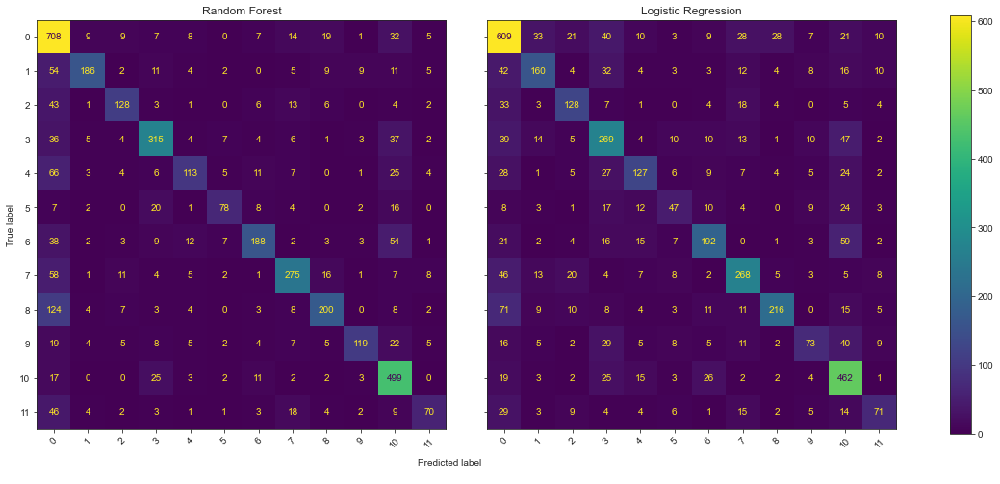

In [175]:
"""
-Confusion Matrix
"""

sns.set_style("ticks")
f, axes = plt.subplots(1, 2, figsize=(20, 8), sharey='row')

for i, model in enumerate (genre_pipe):
    y_pred_genre = model.predict(X_test_genre)
    confusion_matrix_genre = confusion_matrix(y_test_genre, y_pred_genre)
    disp = ConfusionMatrixDisplay(confusion_matrix = confusion_matrix_genre,)
    
    
    disp.plot(ax= axes[i], xticks_rotation=45, )
    #ax.grid(False)
    disp.ax_.set_title(format(classifiers_models[i]))
    disp.im_.colorbar.remove()
    disp.ax_.set_xlabel('')
    if i!=0:
        disp.ax_.set_ylabel('')

f.text(0.4, 0.05, 'Predicted label\n', ha='left')
plt.subplots_adjust(wspace=0.10, hspace=0.1)


f.colorbar(disp.im_, ax=axes)
plt.show()

In [176]:
from sklearn import metrics

In [177]:
for i, model in enumerate(genre_pipe):
    print('{} Training Accuracy: \n {}\n'.format(classifiers_models[i],
          metrics.accuracy_score(y_train_genre,
                                 model.predict(X_train_genre))*100))

    
    print('{} Test Accuracy: \n {}\n'.format(classifiers_models[i],
      metrics.accuracy_score(y_test_genre,
                             model.predict(X_test_genre))*100))

Random Forest Training Accuracy: 
 100.0

Random Forest Test Accuracy: 
 69.59149141890258

Logistic Regression Training Accuracy: 
 88.39458413926499

Logistic Regression Test Accuracy: 
 63.37926033357505



## Using Rating as the target variable

In [178]:
class_dist_rating = games_copy_3['Rating'].value_counts()

def ditribution_plot(x,y,name):
    fig = go.Figure([
        go.Bar(x=x, y=y)
    ])

    fig.update_layout(title_text=name)
    fig.show()

In [179]:
ditribution_plot(x= class_dist_rating.index, y= class_dist_rating.values, name= 'Class Distribution: Rating')

In [180]:
games_count = games_copy_3['Rating'].value_counts()
games_count

E       7291
T       4685
M       2424
E10+    2108
K-A       25
EC         9
RP         2
AO         1
Name: Rating, dtype: int64

In [181]:
games_copy_4 = games_copy_3.copy()

__The plot and value counts above show that some rating have just 1 count and this will be excluded from the model__

In [182]:
# Calculate the range
threshold = 0.01 * len(games_copy_4)

# Create a boolean condition of rows where the value counts are greater than the threshold
criteria = games_copy_4['Rating'].isin(games_count[games_count > threshold].index)

# Create a new dataframe with only the rows where the value counts are greater than the threshold
games_copy_4 = games_copy_4[criteria]

In [183]:
class_dist_rating_1 = games_copy_4['Rating'].value_counts()

def ditribution_plot(x,y,name):
    fig = go.Figure([
        go.Bar(x=x, y=y)
    ])

    fig.update_layout(title_text=name)
    fig.show()

In [184]:
ditribution_plot(x= class_dist_rating.index, y= class_dist_rating_1.values, name= 'Class Distribution: Rating')

__Preparing the dataset for analysis__

In [185]:
"""
-Defining the features and the target for the dataset
"""
features_rating = games_copy_4.drop('Rating', axis=1)
target_rating = games_copy_4['Rating']

In [186]:
#Create Training and Validation Set
X_train_rating, X_test_rating, y_train_rating, y_test_rating = train_test_split(features_rating,
                                                                                target_rating,
                                                                                test_size=0.2,
                                                                                random_state=42)

In [187]:
"""
-Categorising the columns into categorical and numerical columns
"""
categorial_columns_rating = games_copy_4.iloc[:, [0,1,3,4,14]].columns.values.tolist()
numerical_columns_rating = games_copy_4.iloc[:, [2,5,6,7,8,9,10,11,12,13]].columns.values.tolist()

In [188]:
"""
-Printing the categorical and numerical columns
"""
print('Categorical columns:',categorial_columns_rating)
print('\n')
print ('Numerical columns:',numerical_columns_rating)

Categorical columns: ['Name', 'Platform', 'Genre', 'Publisher', 'Developer']


Numerical columns: ['Year_of_Release', 'NA_Sales', 'EU_Sales', 'JP_Sales', 'Other_Sales', 'Global_Sales', 'Critic_Score', 'Critic_Count', 'User_Score', 'User_Count']


In [189]:
"""
-Defining the processor for the dataset
-https://www.kaggle.com/code/mathurutkarsh/pipelines-and-hyperparameter-tuning-in-sklearn
-https://towardsdatascience.com/an-introduction-to-building-pipelines-and-using-grid-searches-in-scikit-learn-92ea72f9b5b7
-https://towardsdatascience.com/easy-way-to-create-an-algorithm-chains-pipelines-with-grid-search-columntransformer-feature-24feb3d6aec5
"""
preprocessor_rating = ColumnTransformer([('min_max scaler', normalise_data, numerical_columns_rating),
                                           ('one_hot_encoder', encode_data, categorial_columns_rating),]
                                          , sparse_threshold=0)

__The Models__

In [191]:
"""
-https://scikit-learn.org/stable/auto_examples/compose/plot_column_transformer_mixed_types.html

"""
random_forest_rating = Pipeline([
    ('preprocessor_rat',preprocessor_rating),
    ('rf_classifier', RandomForestClassifier(random_state = 42))])

logistic_regression_rating = Pipeline([
    ('preprocessor_rat', preprocessor_rating),
    ('lt_classifier', LogisticRegression(random_state=42))])

In [192]:
rating_pipe = [random_forest_rating,
               logistic_regression_rating]

#print steps in the pipeline
for pipe in rating_pipe:
    print (pipe)

Pipeline(steps=[('preprocessor_rat',
                 ColumnTransformer(sparse_threshold=0,
                                   transformers=[('min_max scaler',
                                                  MinMaxScaler(),
                                                  ['Year_of_Release',
                                                   'NA_Sales', 'EU_Sales',
                                                   'JP_Sales', 'Other_Sales',
                                                   'Global_Sales',
                                                   'Critic_Score',
                                                   'Critic_Count', 'User_Score',
                                                   'User_Count']),
                                                 ('one_hot_encoder',
                                                  OneHotEncoder(handle_unknown='ignore'),
                                                  ['Name', 'Platform', 'Genre',
                              

In [193]:
%%time
"""
-Fitting the models
"""
for pipe in rating_pipe:
    pipe.fit(X_train_rating,y_train_rating)

Wall time: 2min 28s


In [194]:
"""
-Classification report for Rating Labels
"""

for i, model in enumerate(rating_pipe):
    y_pred_rating = model.predict(X_test_rating)
    print('{} Classification Report for Platform Labels: \n {}\n'.format(classifiers_models[i],
    classification_report(y_test_rating,y_pred_rating)))

Random Forest Classification Report for Platform Labels: 
               precision    recall  f1-score   support

           E       0.80      0.93      0.86      1444
        E10+       0.82      0.44      0.57       430
           M       0.82      0.76      0.79       480
           T       0.76      0.76      0.76       948

    accuracy                           0.79      3302
   macro avg       0.80      0.72      0.75      3302
weighted avg       0.79      0.79      0.78      3302


Logistic Regression Classification Report for Platform Labels: 
               precision    recall  f1-score   support

           E       0.81      0.89      0.85      1444
        E10+       0.69      0.49      0.57       430
           M       0.73      0.75      0.74       480
           T       0.76      0.73      0.74       948

    accuracy                           0.77      3302
   macro avg       0.75      0.72      0.73      3302
weighted avg       0.77      0.77      0.77      3302




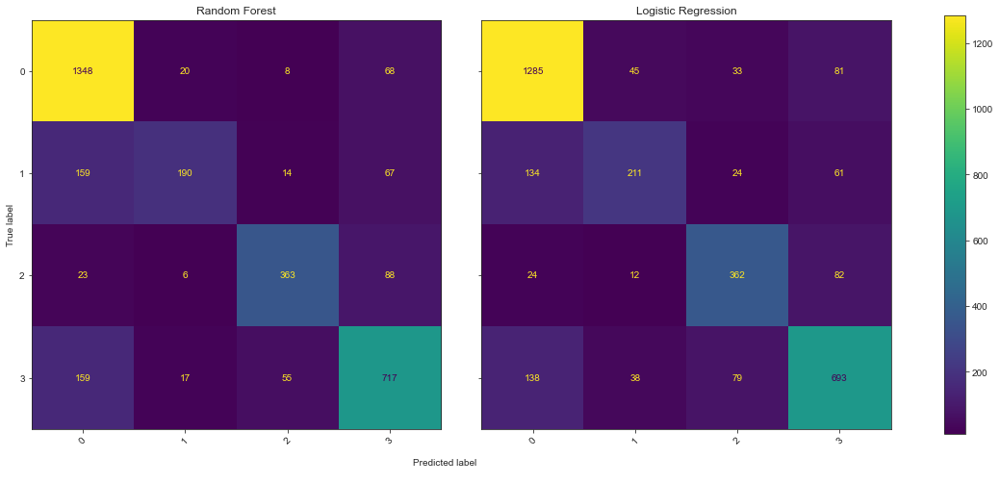

In [195]:
"""
-Confusion Matrix
"""

sns.set_style("ticks")
f, axes = plt.subplots(1, 2, figsize=(20, 8), sharey='row')

for i, model in enumerate (rating_pipe):
    y_pred_rating = model.predict(X_test_rating)
    confusion_matrix_rating = confusion_matrix(y_test_rating, y_pred_rating)
    disp = ConfusionMatrixDisplay(confusion_matrix = confusion_matrix_rating,)
    
    
    disp.plot(ax= axes[i], xticks_rotation=45, )
    #ax.grid(False)
    disp.ax_.set_title(format(classifiers_models[i]))
    disp.im_.colorbar.remove()
    disp.ax_.set_xlabel('')
    if i!=0:
        disp.ax_.set_ylabel('')

f.text(0.4, 0.05, 'Predicted label\n', ha='left')
plt.subplots_adjust(wspace=0.10, hspace=0.1)


f.colorbar(disp.im_, ax=axes)
plt.show()

In [196]:
for i, model in enumerate(rating_pipe):
    print('{} Training Accuracy: \n {}\n'.format(classifiers_models[i],
          metrics.accuracy_score(y_train_rating,
                                 model.predict(X_train_rating))*100))

    
    print('{} Test Accuracy: \n {}\n'.format(classifiers_models[i],
      metrics.accuracy_score(y_test_rating,
                             model.predict(X_test_rating))*100))

Random Forest Training Accuracy: 
 100.0

Random Forest Test Accuracy: 
 79.28528164748637

Logistic Regression Training Accuracy: 
 92.43525670149931

Logistic Regression Test Accuracy: 
 77.25620835857056



## 5. In the video game dataset, use a relevant categorical variable and other relevant noncategorical variables to form groups at each instance. By employing internal and external evaluation metrics, determine which categorical variable best describes the groups formed. 

In [197]:
games.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 16545 entries, 14985 to 9135
Data columns (total 16 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Name             16545 non-null  object 
 1   Platform         16545 non-null  object 
 2   Year_of_Release  16545 non-null  int32  
 3   Genre            16545 non-null  object 
 4   Publisher        16545 non-null  object 
 5   NA_Sales         16545 non-null  float64
 6   EU_Sales         16545 non-null  float64
 7   JP_Sales         16545 non-null  float64
 8   Other_Sales      16545 non-null  float64
 9   Global_Sales     16545 non-null  float64
 10  Critic_Score     16545 non-null  float64
 11  Critic_Count     16545 non-null  float64
 12  User_Score       16545 non-null  float64
 13  User_Count       16545 non-null  float64
 14  Developer        16545 non-null  object 
 15  Rating           16545 non-null  object 
dtypes: float64(9), int32(1), object(6)
memory usage: 2.1+ M

__The relevant categorical columns identified earlier include:__
1. Genre
2. Rating

__The relevant non-categorical variable selectecd are:__
 - NA_Sales
 - EU_Sales
 - JP_Sales
 - Other_Sales
 - Critic_Score
 - User_Score
 - Global_Sales
 
__Groups will be formed with User_Score and Critic_Score__

In [198]:
from sklearn.cluster import KMeans
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score, calinski_harabasz_score,  davies_bouldin_score
from sklearn.metrics.cluster import adjusted_mutual_info_score
from sklearn.metrics import adjusted_rand_score, v_measure_score
from sklearn.preprocessing import LabelEncoder, StandardScaler


# Workshop codes have been used in this section


### USER SCORE AND NA SALES

In [199]:
#using the class codes
user_na_sales = games[['User_Score', 'NA_Sales']]
user_na_sales.head(2)

,User_Score,NA_Sales
14985,7.676190,0.00
1079,8.083333,0.81


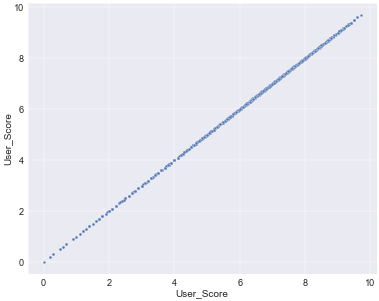

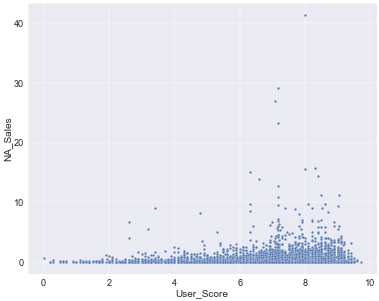

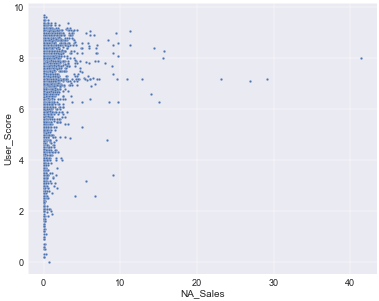

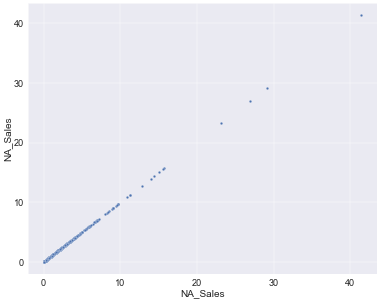

In [200]:
for col1 in user_na_sales.columns:
    for col2 in user_na_sales.columns:
         plt.figure(figsize = (15,12),dpi = 30)
         sns.set(font_scale=2)
         sns.scatterplot(data = user_na_sales, x = user_na_sales[col1],y = user_na_sales[col2])
         plt.show()

In [201]:
## instantiate an object of the StandardScaler() class 
scaler = StandardScaler()

In [202]:
scaled_user_na_sales =scaler.fit_transform(user_na_sales)
scaled_user_na_sales

array([[ 0.4474547 , -0.32317995],
       [ 0.78163363,  0.66830865],
       [-0.14688547, -0.06612735],
       ...,
       [-0.11439585, -0.24973635],
       [-1.17458342, -0.31093935],
       [-0.44079683, -0.32317995]])

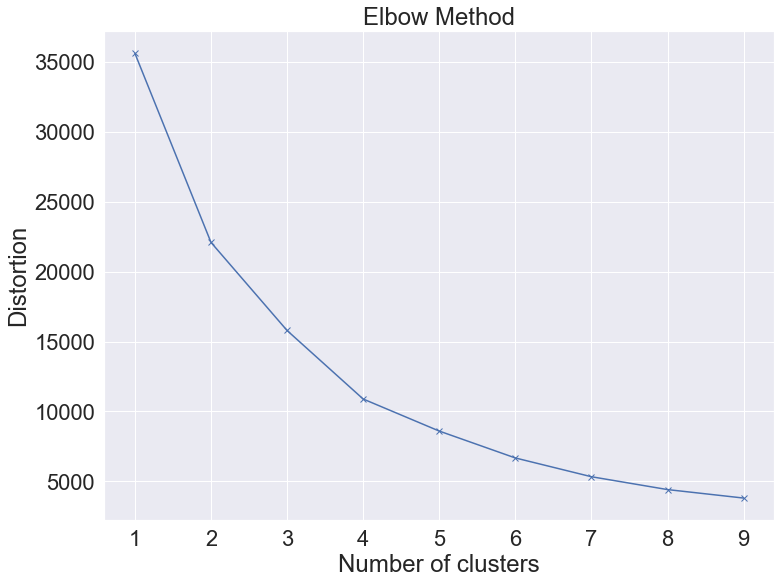

In [203]:
#Determining the suitable number of clusters using Elbow method
distortions = []
K = range(1, 10)
for k in K:
     kmeans = KMeans(n_clusters=k, random_state=42)
     kmeans.fit(user_na_sales)
     distortions.append(kmeans.inertia_)


plt.figure(figsize = (12,9))
plt.plot(K, distortions, 'bx-')
plt.xlabel('Number of clusters')
plt.ylabel('Distortion')
plt.title('Elbow Method')
plt.show()

In [204]:
# Fit the k-means algorithm
kmeans = KMeans(n_clusters=4, random_state=42)
C_labels = kmeans.fit_predict(scaled_user_na_sales)
C_labels

array([1, 1, 2, ..., 2, 2, 2])

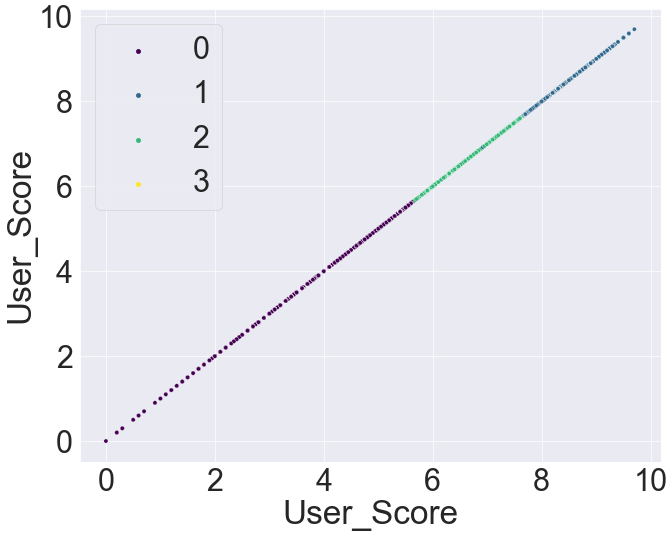

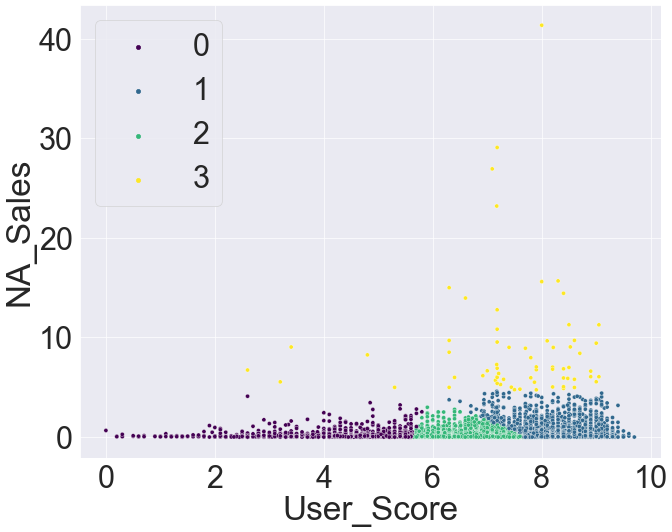

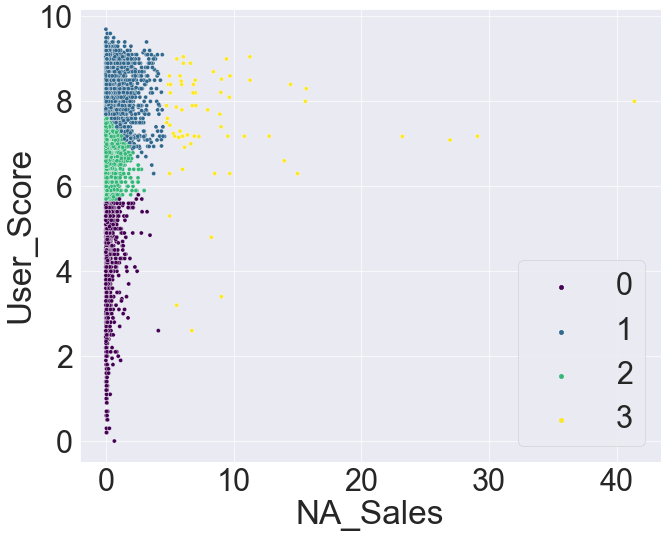

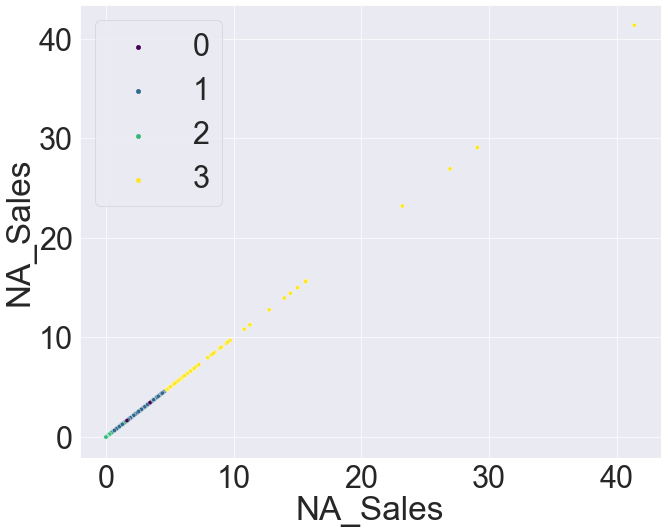

In [205]:
# plotting the attributes to see how they affect the clusters formed 
for col1 in user_na_sales.columns:
    for col2 in user_na_sales.columns:
         plt.figure(figsize = (15,12),dpi = 50)
         sns.set(font_scale=4)
         sns.scatterplot(data = user_na_sales, x = user_na_sales[col1], y = user_na_sales[col2], hue=C_labels, palette = 'viridis')
         plt.show()

In [206]:
# Get the true class labels
y_true_kmeans_genre = games['Genre']
y_true_kmeans_rating = games['Rating']

### USER SCORE AND NA SALES Internal and External with GENRE and Rating

In [207]:
print(f'External Evaluation Measures')
print(f'********************************')

v_measure = v_measure_score(y_true_kmeans_genre, C_labels)
print(f'V-measure Score with Genre: {v_measure:.3f}')

v_measure = v_measure_score(y_true_kmeans_rating, C_labels)
print(f'V-measure Score with Rating: {v_measure:.3f}')


rand_index = adjusted_rand_score(y_true_kmeans_genre, C_labels)
print(f'Rand Index Score with Genre: {rand_index:.3f}')

rand_index = adjusted_rand_score(y_true_kmeans_rating, C_labels)
print(f'Rand Index Score with Rating: {rand_index:.3f}')


mi_score = adjusted_mutual_info_score(y_true_kmeans_genre, C_labels)
print(f'Mutual Information Score with Genre: {mi_score:.3f}')

mi_score = adjusted_mutual_info_score(y_true_kmeans_rating, C_labels)
print(f'Mutual Information Score with Rating: {mi_score:.3f}\n')

print(f'Internal Evaluation Measures')
print(f'********************************')

# Calculate the Davies-Bouldin index
db_score = davies_bouldin_score(scaled_user_na_sales, C_labels)
print(f'Davies-Bouldin Index: {db_score:.3f}')


s_score = silhouette_score(scaled_user_na_sales, C_labels)
print(f'Silhouette Coefficient: {s_score:.3f}')

c_score = calinski_harabasz_score(scaled_user_na_sales, C_labels)
print(f'Calinski Harabasz Score: {c_score:.3f}')

External Evaluation Measures
********************************
V-measure Score with Genre: 0.016
V-measure Score with Rating: 0.011
Rand Index Score with Genre: 0.007
Rand Index Score with Rating: 0.011
Mutual Information Score with Genre: 0.015
Mutual Information Score with Rating: 0.010

Internal Evaluation Measures
********************************
Davies-Bouldin Index: 0.728
Silhouette Coefficient: 0.462
Calinski Harabasz Score: 9590.620


### USER SCORE AND EU SALES

In [208]:
#using the class codes
user_eu_sales = games[['User_Score', 'EU_Sales']]
user_eu_sales.head(2)

,User_Score,EU_Sales
14985,7.676190,0.00
1079,8.083333,0.23


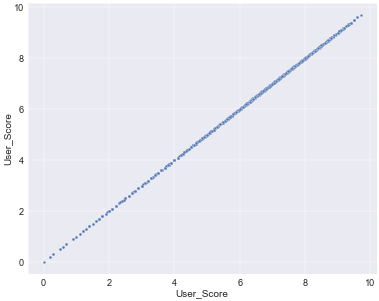

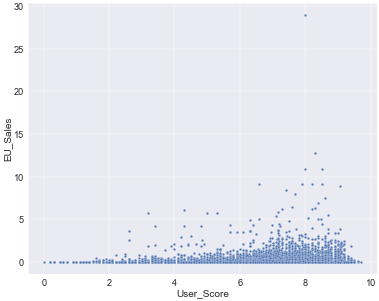

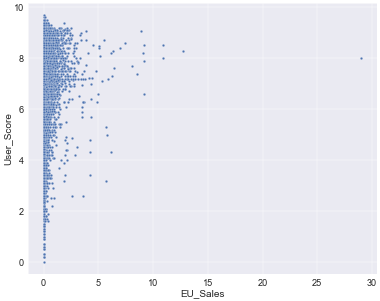

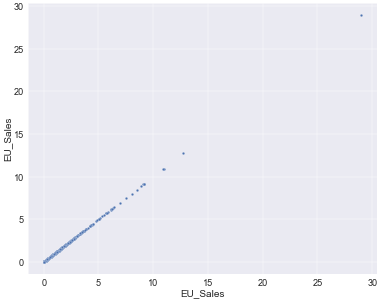

In [209]:
for col1 in user_eu_sales.columns:
    for col2 in user_eu_sales.columns:
         plt.figure(figsize = (15,12),dpi = 30)
         sns.set(font_scale=2)
         sns.scatterplot(data = user_eu_sales, x = user_eu_sales[col1],y = user_eu_sales[col2])
         plt.show()

In [210]:
scaled_user_eu_sales = scaler.fit_transform(user_eu_sales)
scaled_user_eu_sales

array([[ 0.4474547 , -0.28849523],
       [ 0.78163363,  0.1663432 ],
       [-0.14688547,  0.22566995],
       ...,
       [-0.11439585, -0.11051497],
       [-1.17458342, -0.26871964],
       [-0.44079683, -0.28849523]])

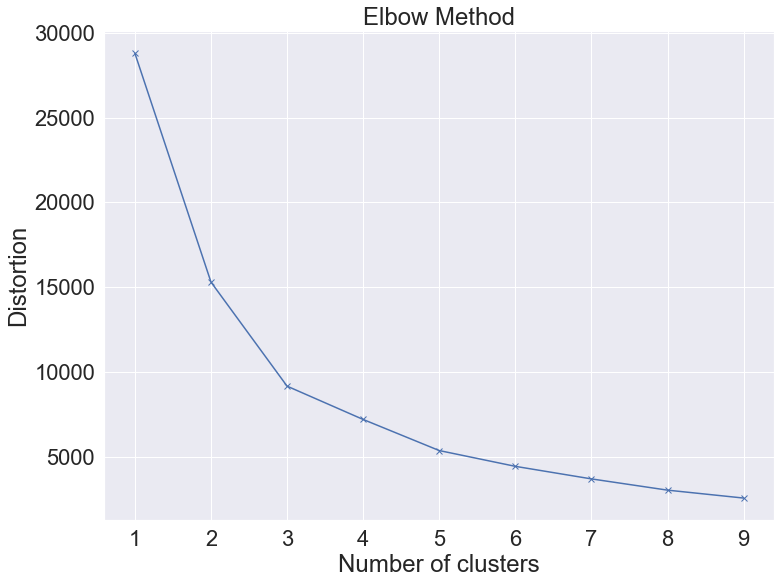

In [211]:
#Determining the suitable number of clusters using Elbow method
distortions_2 = []
K_2 = range(1, 10)
for k in K_2:
     kmeans_eu = KMeans(n_clusters=k, random_state=42)
     kmeans_eu.fit(user_eu_sales)
     distortions_2.append(kmeans_eu.inertia_)


plt.figure(figsize = (12,9))
plt.plot(K_2, distortions_2, 'bx-')
plt.xlabel('Number of clusters')
plt.ylabel('Distortion')
plt.title('Elbow Method')
plt.show()

In [212]:
# Fit the k-means algorithm
kmeans_eu = KMeans(n_clusters=3, random_state=42)
C_labels_eu = kmeans_eu.fit_predict(scaled_user_eu_sales)
C_labels_eu

array([0, 0, 0, ..., 0, 1, 0])

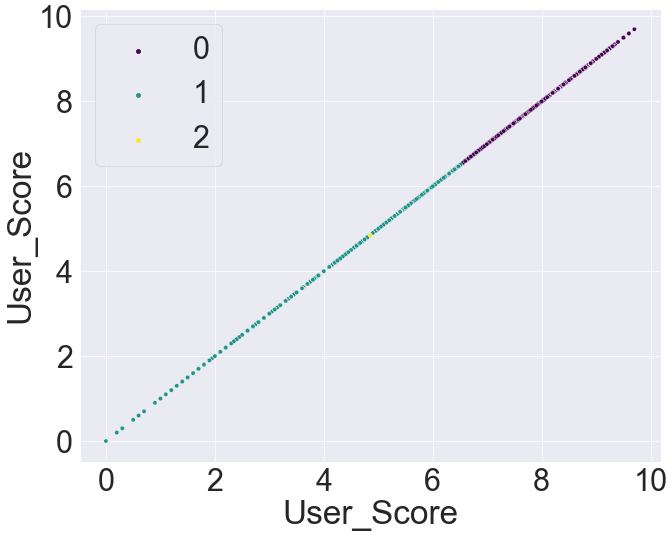

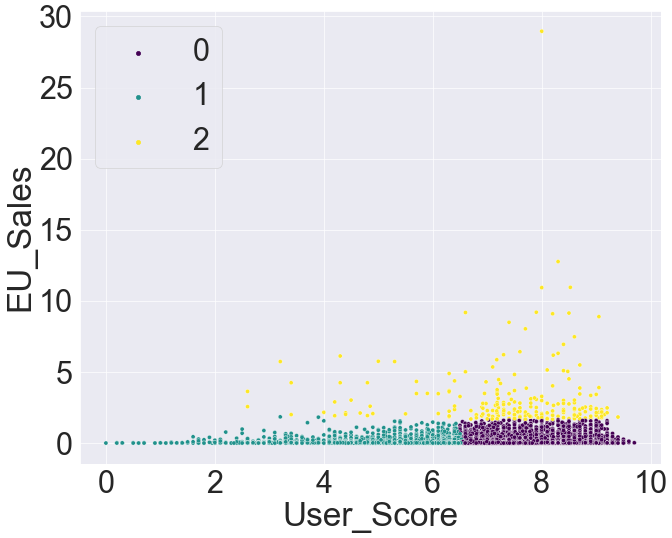

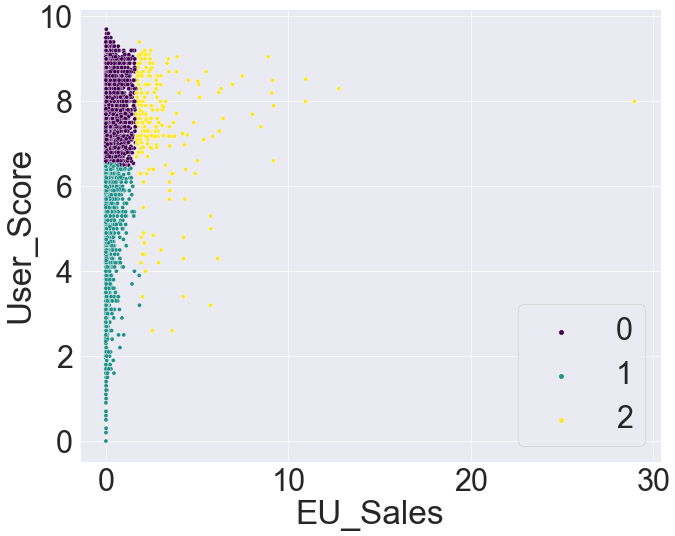

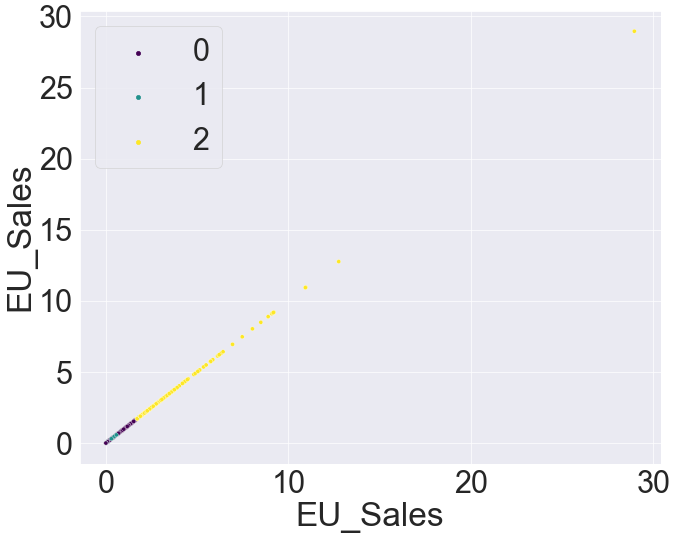

In [213]:
# plotting the attributes to see how they affect the clusters formed 
for col1 in user_eu_sales.columns:
    for col2 in user_eu_sales.columns:
         plt.figure(figsize = (15,12),dpi = 50)
         sns.set(font_scale=4)
         sns.scatterplot(data = user_eu_sales, x = user_eu_sales[col1], y = user_eu_sales[col2], hue=C_labels_eu, palette = 'viridis')
         plt.show()

### USER SCORE AND EU SALES Internal and External with GENRE and Rating

In [214]:
print(f'External Evaluation Measures')
print(f'********************************')

v_measure_eu = v_measure_score(y_true_kmeans_genre, C_labels_eu)
print(f'V-measure Score with Genre: {v_measure_eu:.3f}')

v_measure_eu = v_measure_score(y_true_kmeans_rating, C_labels_eu)
print(f'V-measure Score with Rating: {v_measure_eu:.3f}')


rand_index_eu = adjusted_rand_score(y_true_kmeans_genre, C_labels_eu)
print(f'Rand Index Score with Genre: {rand_index_eu:.3f}')

rand_index_eu = adjusted_rand_score(y_true_kmeans_rating, C_labels_eu)
print(f'Rand Index Score with Rating: {rand_index_eu:.3f}')


mi_score_eu = adjusted_mutual_info_score(y_true_kmeans_genre, C_labels_eu)
print(f'Mutual Information Score with Genre: {mi_score_eu:.3f}')

mi_score_eu = adjusted_mutual_info_score(y_true_kmeans_rating, C_labels_eu)
print(f'Mutual Information Score with Rating: {mi_score_eu:.3f}\n')

print(f'Internal Evaluation Measures')
print(f'********************************')

# Calculate the Davies-Bouldin index
db_score_eu = davies_bouldin_score(scaled_user_eu_sales, C_labels_eu)
print(f'Davies-Bouldin Index: {db_score_eu:.3f}')


s_score_eu = silhouette_score(scaled_user_eu_sales, C_labels_eu)
print(f'Silhouette Coefficient: {s_score_eu:.3f}')

c_score_eu = calinski_harabasz_score(scaled_user_eu_sales, C_labels_eu)
print(f'Calinski Harabasz Score: {c_score_eu:.3f}')

External Evaluation Measures
********************************
V-measure Score with Genre: 0.011
V-measure Score with Rating: 0.005
Rand Index Score with Genre: -0.001
Rand Index Score with Rating: 0.005
Mutual Information Score with Genre: 0.011
Mutual Information Score with Rating: 0.005

Internal Evaluation Measures
********************************
Davies-Bouldin Index: 0.733
Silhouette Coefficient: 0.496
Calinski Harabasz Score: 8719.648


### USER SCORE AND JP SALES

In [215]:
#using the class codes
user_jp_sales = games[['User_Score', 'JP_Sales']]
user_jp_sales.head(2)

,User_Score,JP_Sales
14985,7.676190,0.03
1079,8.083333,0.52


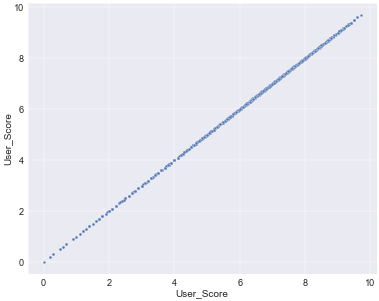

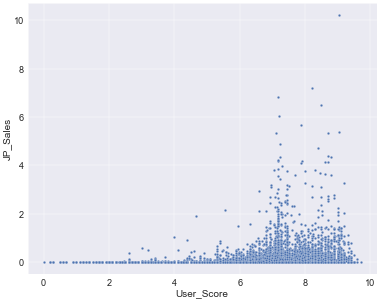

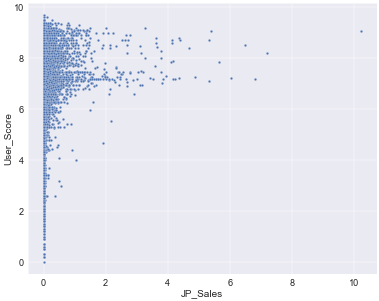

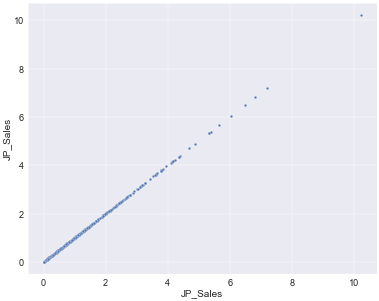

In [216]:
for col1 in user_jp_sales.columns:
    for col2 in user_jp_sales.columns:
         plt.figure(figsize = (15,12),dpi = 30)
         sns.set(font_scale=2)
         sns.scatterplot(data = user_jp_sales, x = user_jp_sales[col1],y = user_jp_sales[col2])
         plt.show()

In [217]:
scaled_user_jp_sales = scaler.fit_transform(user_jp_sales)
scaled_user_jp_sales

array([[ 0.4474547 , -0.15512643],
       [ 0.78163363,  1.42423982],
       [-0.14688547, -0.25182233],
       ...,
       [-0.11439585, -0.25182233],
       [-1.17458342, -0.25182233],
       [-0.44079683,  0.19942517]])

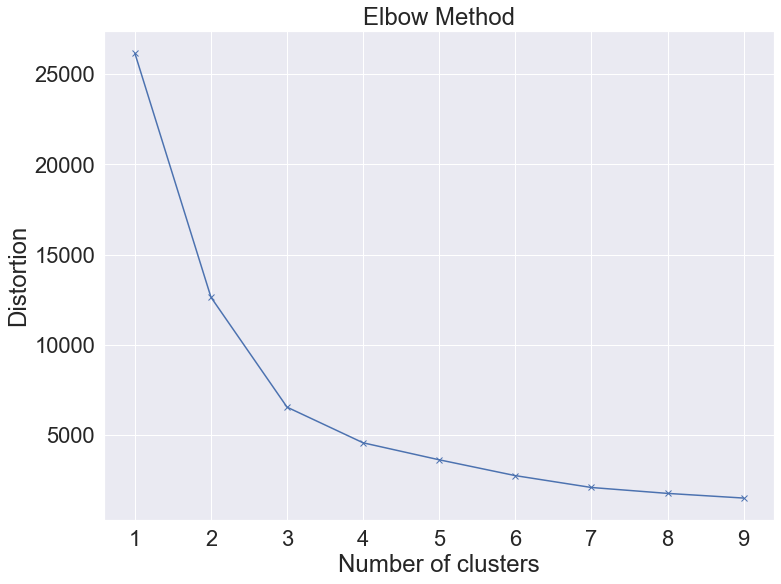

In [218]:
#Determining the suitable number of clusters using Elbow method
distortions_3 = []
K_3 = range(1, 10)
for k in K_3:
     kmeans_jp = KMeans(n_clusters=k, random_state=42)
     kmeans_jp.fit(user_jp_sales)
     distortions_3.append(kmeans_jp.inertia_)


plt.figure(figsize = (12,9))
plt.plot(K_3, distortions_3, 'bx-')
plt.xlabel('Number of clusters')
plt.ylabel('Distortion')
plt.title('Elbow Method')
plt.show()

In [219]:
# Fit the k-means algorithm
kmeans_jp = KMeans(n_clusters=3, random_state=42)
C_labels_jp = kmeans_jp.fit_predict(scaled_user_jp_sales)
C_labels_jp

array([2, 2, 2, ..., 2, 0, 2])

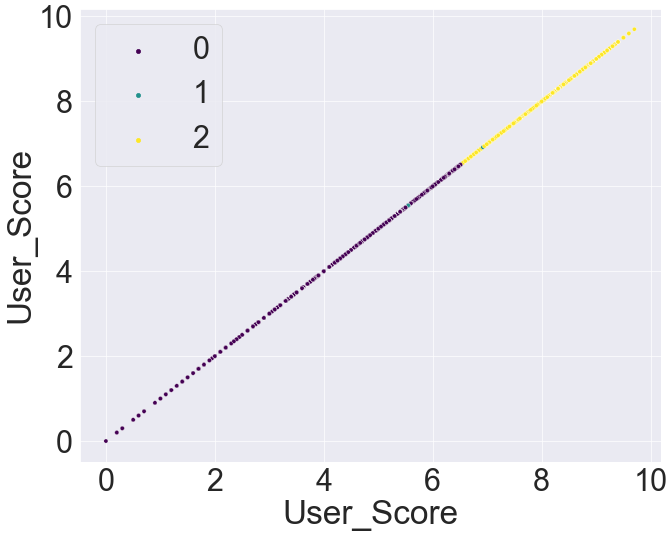

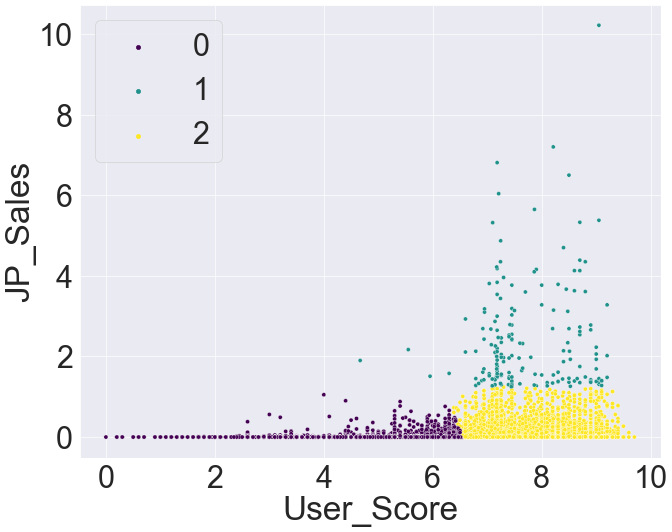

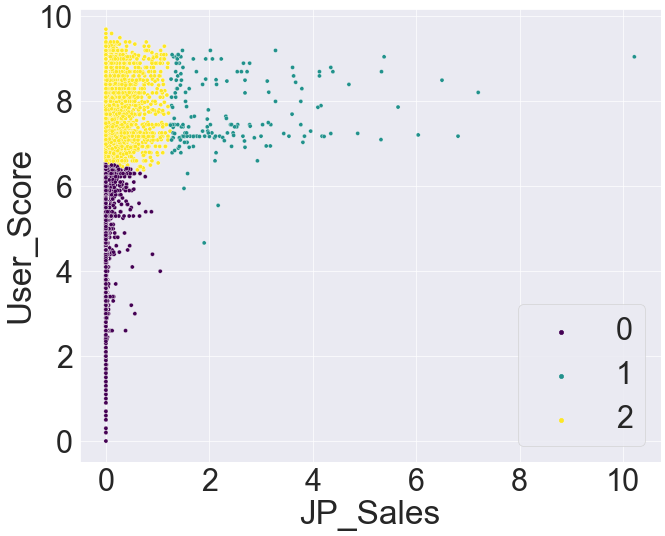

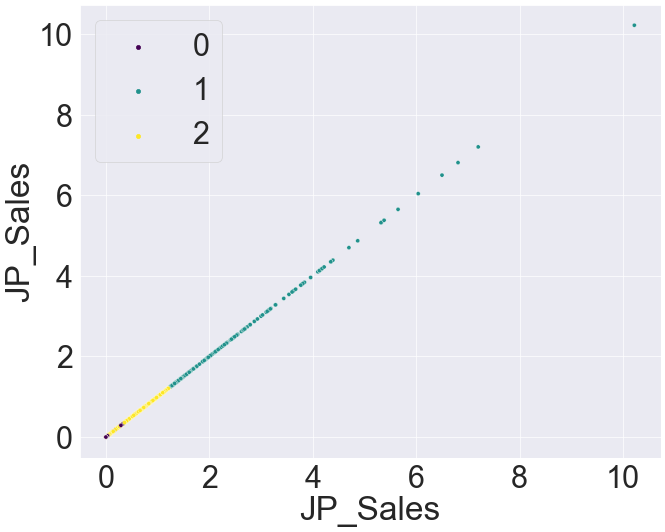

In [220]:
# plotting the attributes to see how they affect the clusters formed 
for col1 in user_jp_sales.columns:
    for col2 in user_jp_sales.columns:
         plt.figure(figsize = (15,12),dpi = 50)
         sns.set(font_scale=4)
         sns.scatterplot(data = user_jp_sales, x = user_jp_sales[col1], y = user_jp_sales[col2], hue=C_labels_jp, palette = 'viridis')
         plt.show()

### USER SCORE AND JP SALES Internal and External with GENRE and Rating

In [221]:
print(f'External Evaluation Measures')
print(f'********************************')

v_measure_jp = v_measure_score(y_true_kmeans_genre, C_labels_jp)
print(f'V-measure Score with Genre: {v_measure_jp:.3f}')

v_measure_jp = v_measure_score(y_true_kmeans_rating, C_labels_jp)
print(f'V-measure Score with Rating: {v_measure_jp:.3f}')


rand_index_jp = adjusted_rand_score(y_true_kmeans_genre, C_labels_jp)
print(f'Rand Index Score with Genre: {rand_index_jp:.3f}')

rand_index_jp = adjusted_rand_score(y_true_kmeans_rating, C_labels_jp)
print(f'Rand Index Score with Rating: {rand_index_jp:.3f}')


mi_score_jp = adjusted_mutual_info_score(y_true_kmeans_genre, C_labels_jp)
print(f'Mutual Information Score with Genre: {mi_score_jp:.3f}')

mi_score_jp = adjusted_mutual_info_score(y_true_kmeans_rating, C_labels_jp)
print(f'Mutual Information Score with Rating: {mi_score_jp:.3f}\n')

print(f'Internal Evaluation Measures')
print(f'********************************')

# Calculate the Davies-Bouldin index
db_score_jp = davies_bouldin_score(scaled_user_jp_sales, C_labels_jp)
print(f'Davies-Bouldin Index: {db_score_jp:.3f}')


s_score_jp = silhouette_score(scaled_user_jp_sales, C_labels_jp)
print(f'Silhouette Coefficient: {s_score_jp:.3f}')

c_score_jp = calinski_harabasz_score(scaled_user_jp_sales, C_labels_jp)
print(f'Calinski Harabasz Score: {c_score_jp:.3f}')

External Evaluation Measures
********************************
V-measure Score with Genre: 0.013
V-measure Score with Rating: 0.004
Rand Index Score with Genre: 0.000
Rand Index Score with Rating: 0.003
Mutual Information Score with Genre: 0.013
Mutual Information Score with Rating: 0.004

Internal Evaluation Measures
********************************
Davies-Bouldin Index: 0.685
Silhouette Coefficient: 0.495
Calinski Harabasz Score: 11203.191


### USER SCORE AND GLOBAL SALES

In [222]:
#using the class codes
user_global_sales = games[['User_Score', 'Global_Sales']]
user_global_sales.head(2)

,User_Score,Global_Sales
14985,7.676190,0.03
1079,8.083333,1.68


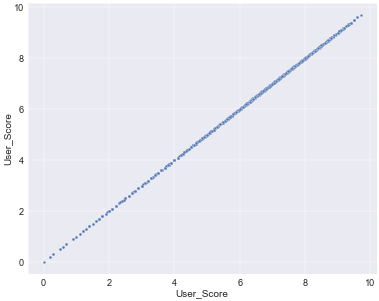

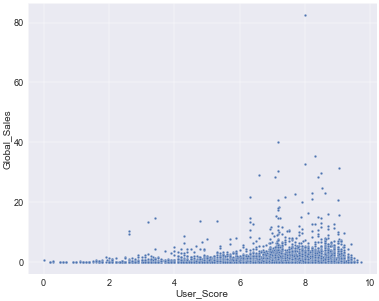

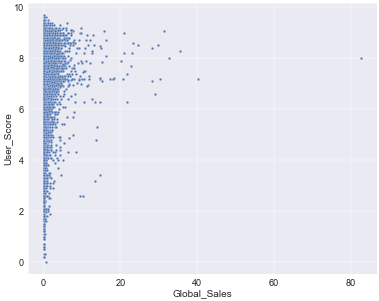

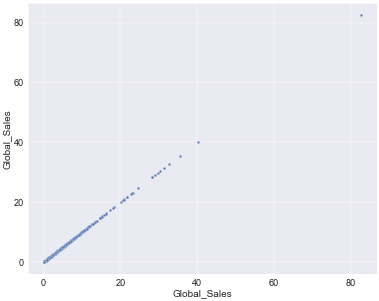

In [223]:
for col1 in user_global_sales.columns:
    for col2 in user_global_sales.columns:
         plt.figure(figsize = (15,12),dpi = 30)
         sns.set(font_scale=2)
         sns.scatterplot(data = user_global_sales, x = user_global_sales[col1],y = user_global_sales[col2])
         plt.show()

In [224]:
scaled_user_global_sales = scaler.fit_transform(user_global_sales)
scaled_user_global_sales

array([[ 0.4474547 , -0.32533977],
       [ 0.78163363,  0.73571681],
       [-0.14688547, -0.01023812],
       ...,
       [-0.11439585, -0.23531073],
       [-1.17458342, -0.33177042],
       [-0.44079683, -0.25460266]])

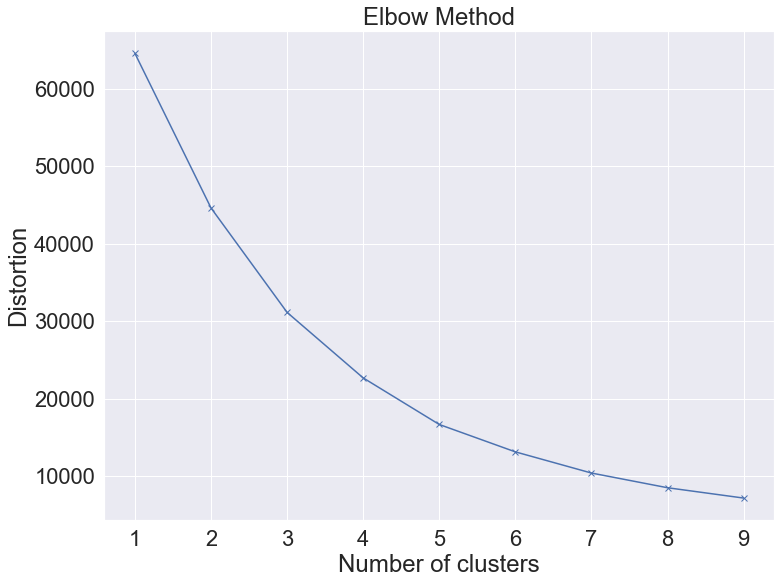

In [225]:
#Determining the suitable number of clusters using Elbow method
distortions_4 = []
K_4 = range(1, 10)
for k in K_4:
     kmeans_global = KMeans(n_clusters=k, random_state=42)
     kmeans_global.fit(user_global_sales)
     distortions_4.append(kmeans_global.inertia_)


plt.figure(figsize = (12,9))
plt.plot(K_4, distortions_4, 'bx-')
plt.xlabel('Number of clusters')
plt.ylabel('Distortion')
plt.title('Elbow Method')
plt.show()

In [226]:
# Fit the k-means algorithm
kmeans_global = KMeans(n_clusters=5, random_state=42)
C_labels_global = kmeans_global.fit_predict(scaled_user_global_sales)
C_labels_global

array([1, 1, 3, ..., 3, 3, 3])

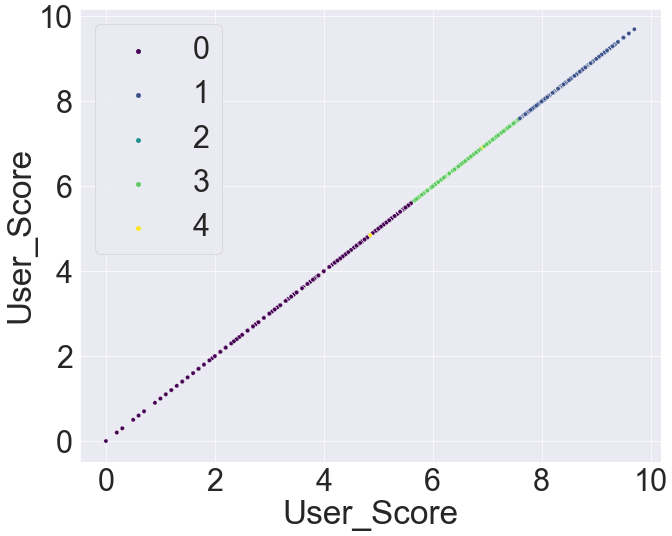

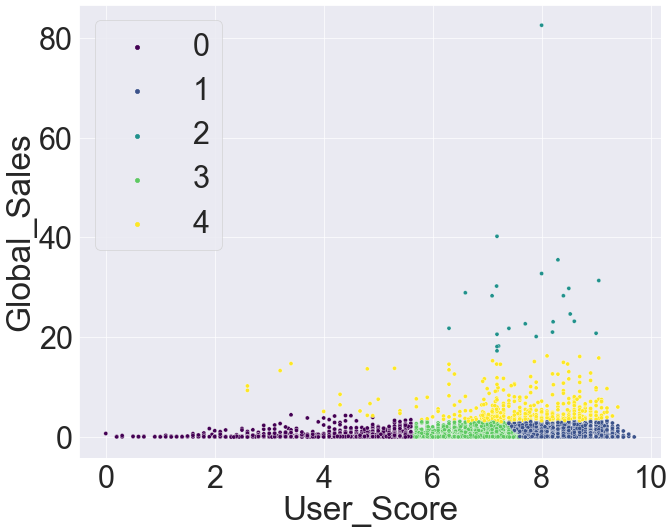

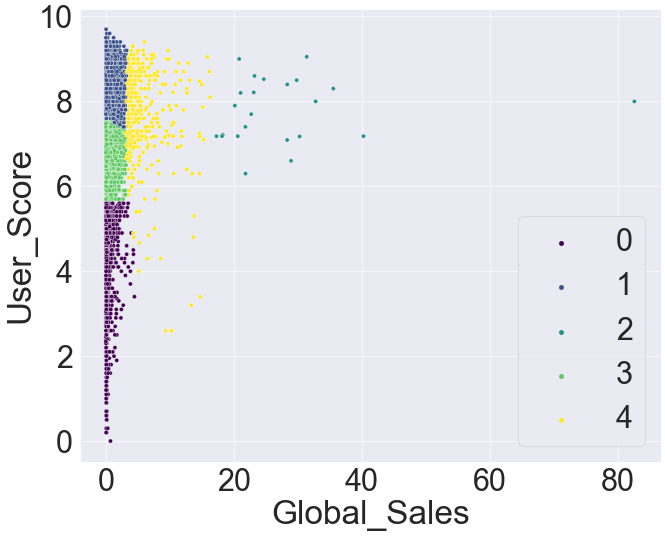

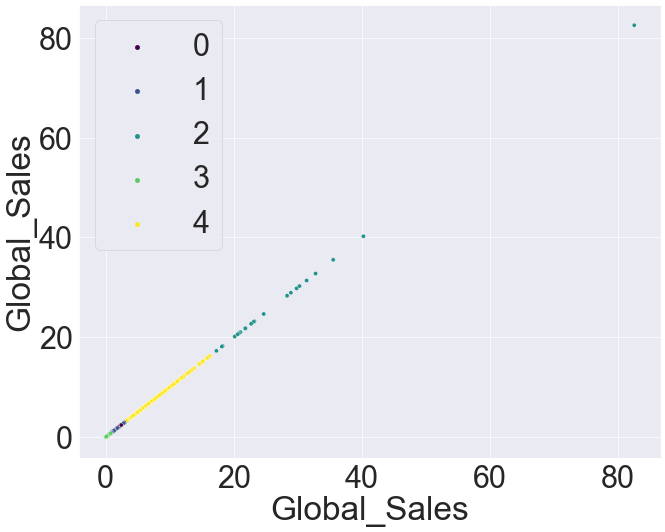

In [227]:
# plotting the attributes to see how they affect the clusters formed 
for col1 in user_global_sales.columns:
    for col2 in user_global_sales.columns:
         plt.figure(figsize = (15,12),dpi = 50)
         sns.set(font_scale=4)
         sns.scatterplot(data = user_global_sales, x = user_global_sales[col1], y = user_global_sales[col2], hue=C_labels_global, palette = 'viridis')
         plt.show()

### USER SCORE AND GLOBAL SALES Internal and External with GENRE and Rating

In [228]:
print(f'External Evaluation Measures')
print(f'********************************')

v_measure_global = v_measure_score(y_true_kmeans_genre, C_labels_global)
print(f'V-measure Score with Genre: {v_measure_global:.3f}')

v_measure_global = v_measure_score(y_true_kmeans_rating, C_labels_global)
print(f'V-measure Score with Rating: {v_measure_global:.3f}')


rand_index_global = adjusted_rand_score(y_true_kmeans_genre, C_labels_global)
print(f'Rand Index Score with Genre: {rand_index_global:.3f}')

rand_index_global = adjusted_rand_score(y_true_kmeans_rating, C_labels_global)
print(f'Rand Index Score with Rating: {rand_index_global:.3f}')


mi_score_global = adjusted_mutual_info_score(y_true_kmeans_genre, C_labels_global)
print(f'Mutual Information Score with Genre: {mi_score_global:.3f}')

mi_score_global = adjusted_mutual_info_score(y_true_kmeans_rating, C_labels_global)
print(f'Mutual Information Score with Rating: {mi_score_global:.3f}\n')

print(f'Internal Evaluation Measures')
print(f'********************************')

# Calculate the Davies-Bouldin index
db_score_global = davies_bouldin_score(scaled_user_global_sales, C_labels_global)
print(f'Davies-Bouldin Index: {db_score_global:.3f}')


s_score_global = silhouette_score(scaled_user_global_sales, C_labels_global)
print(f'Silhouette Coefficient: {s_score_global:.3f}')

c_score_global = calinski_harabasz_score(scaled_user_global_sales, C_labels_global)
print(f'Calinski Harabasz Score: {c_score_global:.3f}')

External Evaluation Measures
********************************
V-measure Score with Genre: 0.017
V-measure Score with Rating: 0.011
Rand Index Score with Genre: 0.007
Rand Index Score with Rating: 0.013
Mutual Information Score with Genre: 0.016
Mutual Information Score with Rating: 0.010

Internal Evaluation Measures
********************************
Davies-Bouldin Index: 0.634
Silhouette Coefficient: 0.483
Calinski Harabasz Score: 12349.234


### USER SCORE AND OTHER SALES

In [229]:
#using the class codes
user_other_sales = games[['User_Score', 'Other_Sales']]
user_other_sales.head(2)

,User_Score,Other_Sales
14985,7.676190,0.00
1079,8.083333,0.11


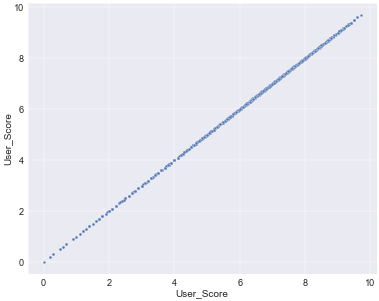

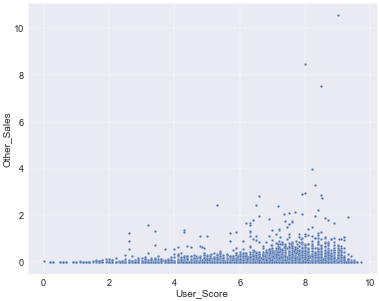

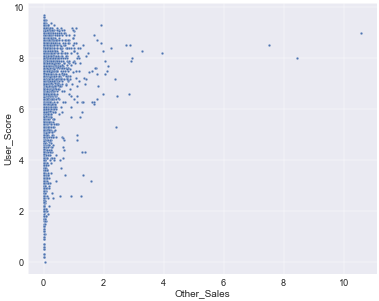

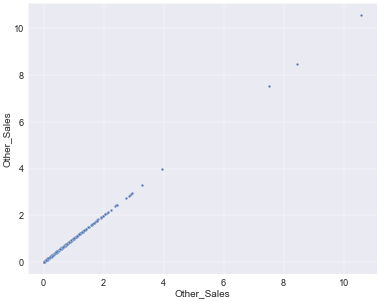

In [230]:
for col1 in user_other_sales.columns:
    for col2 in user_other_sales.columns:
         plt.figure(figsize = (15,12),dpi = 30)
         sns.set(font_scale=2)
         sns.scatterplot(data = user_other_sales, x = user_other_sales[col1],y = user_other_sales[col2])
         plt.show()

In [231]:
scaled_user_other_sales = scaler.fit_transform(user_other_sales)
scaled_user_other_sales

array([[ 0.4474547 , -0.25392168],
       [ 0.78163363,  0.33247153],
       [-0.14688547, -0.04068779],
       ...,
       [-0.11439585, -0.14730473],
       [-1.17458342, -0.25392168],
       [-0.44079683, -0.25392168]])

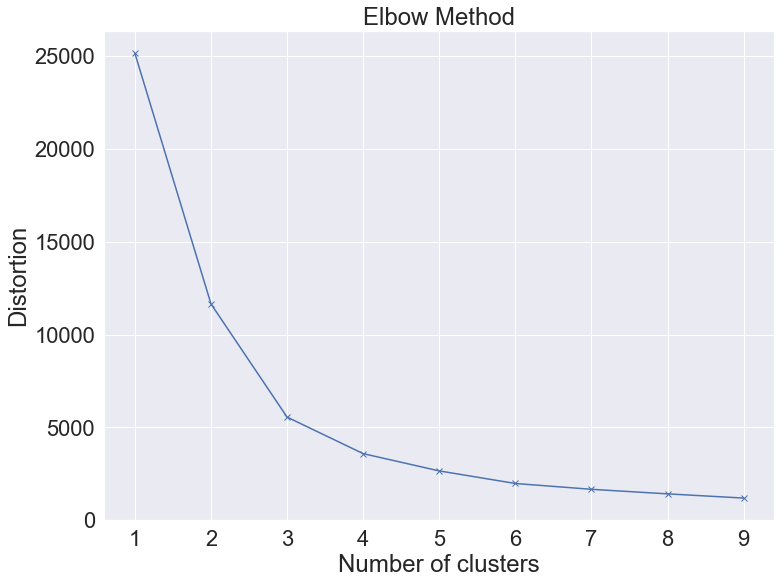

In [232]:
#Determining the suitable number of clusters using Elbow method
distortions_5 = []
K_5 = range(1, 10)
for k in K_5:
     kmeans_other = KMeans(n_clusters=k, random_state=42)
     kmeans_other.fit(user_other_sales)
     distortions_5.append(kmeans_other.inertia_)


plt.figure(figsize = (12,9))
plt.plot(K_5, distortions_5, 'bx-')
plt.xlabel('Number of clusters')
plt.ylabel('Distortion')
plt.title('Elbow Method')
plt.show()

In [233]:
# Fit the k-means algorithm
kmeans_other = KMeans(n_clusters=3, random_state=42)
C_labels_other = kmeans_other.fit_predict(scaled_user_other_sales)
C_labels_other

array([0, 0, 0, ..., 0, 2, 0])

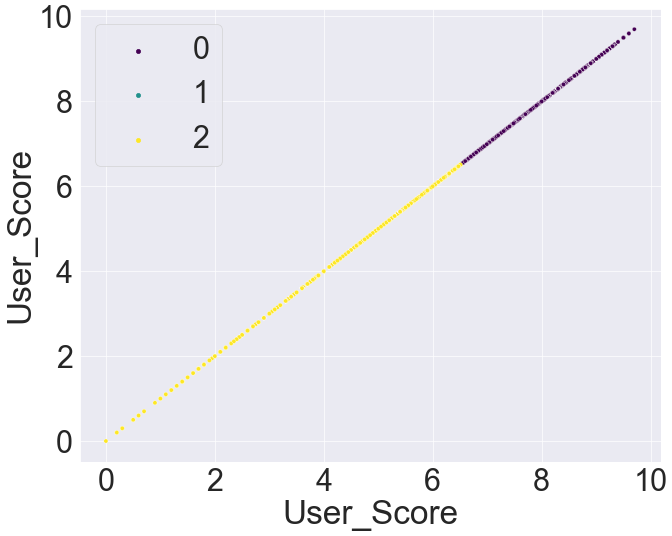

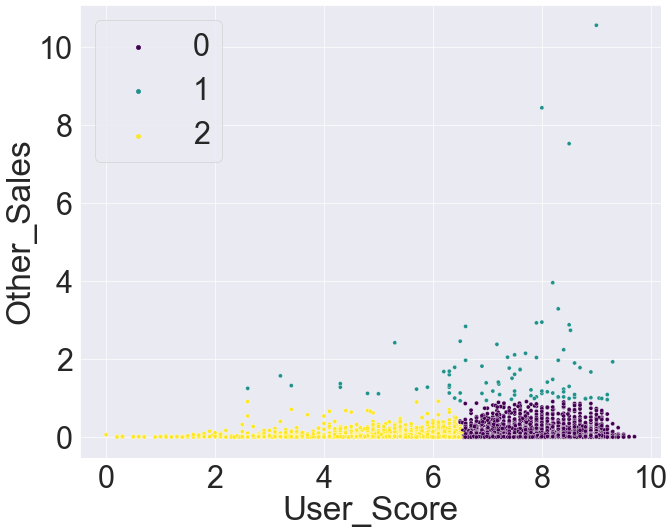

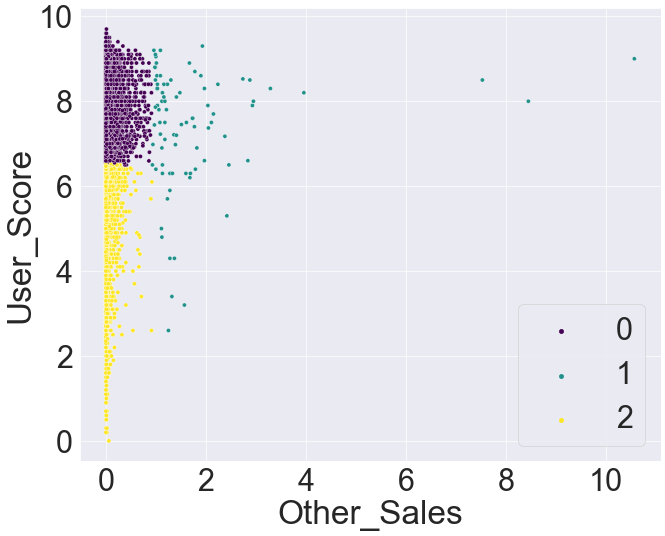

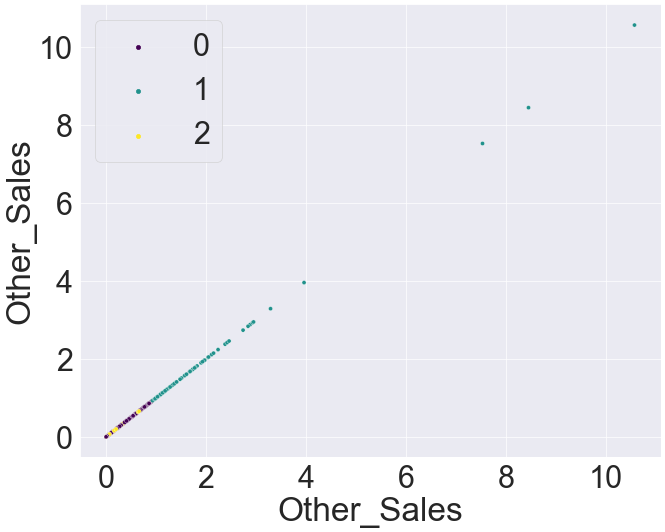

In [234]:
# plotting the attributes to see how they affect the clusters formed 
for col1 in user_other_sales.columns:
    for col2 in user_other_sales.columns:
         plt.figure(figsize = (15,12),dpi = 50)
         sns.set(font_scale=4)
         sns.scatterplot(data = user_other_sales, x = user_other_sales[col1], y = user_other_sales[col2], hue=C_labels_other, palette = 'viridis')
         plt.show()

### USER SCORE AND OTHER SALES Internal and External with GENRE and Rating

In [235]:
print(f'External Evaluation Measures')
print(f'********************************')

v_measure_other = v_measure_score(y_true_kmeans_genre, C_labels_other)
print(f'V-measure Score with Genre: {v_measure_other:.3f}')

v_measure_other = v_measure_score(y_true_kmeans_rating, C_labels_other)
print(f'V-measure Score with Rating: {v_measure_other:.3f}')


rand_index_other = adjusted_rand_score(y_true_kmeans_genre, C_labels_other)
print(f'Rand Index Score with Genre: {rand_index_other:.3f}')

rand_index_other = adjusted_rand_score(y_true_kmeans_rating, C_labels_other)
print(f'Rand Index Score with Rating: {rand_index_other:.3f}')


mi_score_other = adjusted_mutual_info_score(y_true_kmeans_genre, C_labels_other)
print(f'Mutual Information Score with Genre: {mi_score_other:.3f}')

mi_score_other = adjusted_mutual_info_score(y_true_kmeans_rating, C_labels_other)
print(f'Mutual Information Score with Rating: {mi_score_other:.3f}\n')

print(f'Internal Evaluation Measures')
print(f'********************************')

# Calculate the Davies-Bouldin index
db_score_other = davies_bouldin_score(scaled_user_other_sales, C_labels_other)
print(f'Davies-Bouldin Index: {db_score_other:.3f}')


s_score_other = silhouette_score(scaled_user_other_sales, C_labels_other)
print(f'Silhouette Coefficient: {s_score_other:.3f}')

c_score_other = calinski_harabasz_score(scaled_user_other_sales, C_labels_other)
print(f'Calinski Harabasz Score: {c_score_other:.3f}')

External Evaluation Measures
********************************
V-measure Score with Genre: 0.011
V-measure Score with Rating: 0.004
Rand Index Score with Genre: -0.001
Rand Index Score with Rating: 0.005
Mutual Information Score with Genre: 0.010
Mutual Information Score with Rating: 0.004

Internal Evaluation Measures
********************************
Davies-Bouldin Index: 0.714
Silhouette Coefficient: 0.499
Calinski Harabasz Score: 8198.074



# Workshop codes have been used in this section


### CRITIC SCORE AND NA SALES

In [236]:
#using the class codes
critic_na_sales = games[['Critic_Score', 'NA_Sales']]
critic_na_sales.head(2)

,Critic_Score,NA_Sales
14985,76.761905,0.00
1079,80.833333,0.81


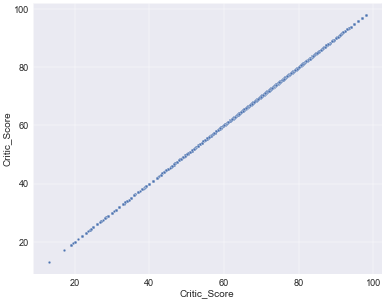

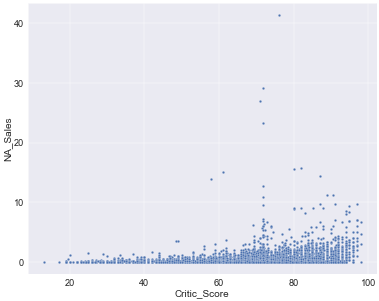

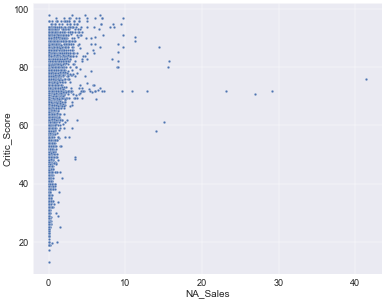

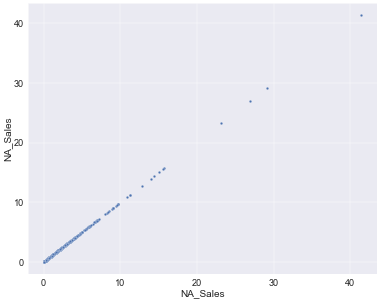

In [237]:
for col1 in critic_na_sales.columns:
    for col2 in critic_na_sales.columns:
         plt.figure(figsize = (15,12),dpi = 30)
         sns.set(font_scale=2)
         sns.scatterplot(data = critic_na_sales, x = critic_na_sales[col1],y = critic_na_sales[col2])
         plt.show()

In [238]:
scaled_critic_na_sales =scaler.fit_transform(critic_na_sales)
scaled_critic_na_sales

array([[ 0.55130038, -0.32317995],
       [ 0.89510947,  0.66830865],
       [-0.06016709, -0.06612735],
       ...,
       [-0.02674121, -0.24973635],
       [-1.37081357, -0.31093935],
       [-0.36254819, -0.32317995]])

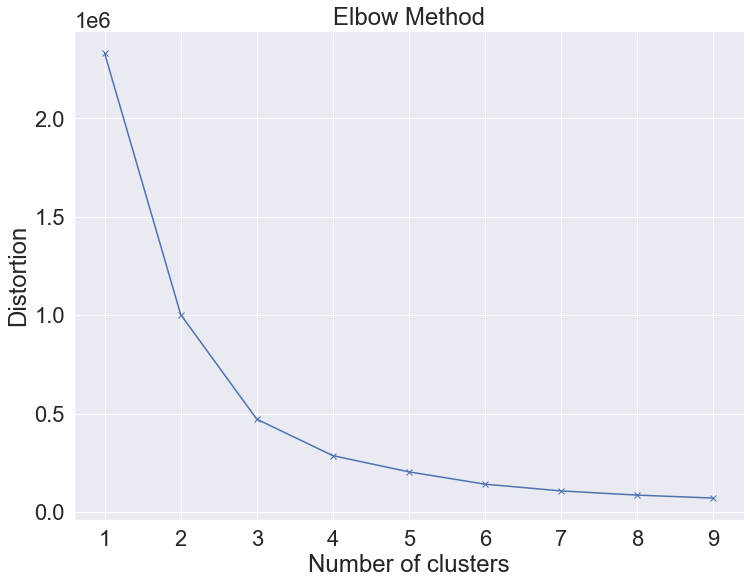

In [239]:
#Determining the suitable number of clusters using Elbow method
distortions_6 = []
K_6 = range(1, 10)
for k in K_6:
     kmeans_critic_na = KMeans(n_clusters=k, random_state=42)
     kmeans_critic_na.fit(critic_na_sales)
     distortions_6.append(kmeans_critic_na.inertia_)


plt.figure(figsize = (12,9))
plt.plot(K_6, distortions_6, 'bx-')
plt.xlabel('Number of clusters')
plt.ylabel('Distortion')
plt.title('Elbow Method')
plt.show()

In [240]:
# Fit the k-means algorithm
kmeans_critic_na = KMeans(n_clusters=3, random_state=42)
C_labels_critic_na = kmeans_critic_na.fit_predict(scaled_critic_na_sales)
C_labels_critic_na

array([1, 1, 1, ..., 1, 0, 0])

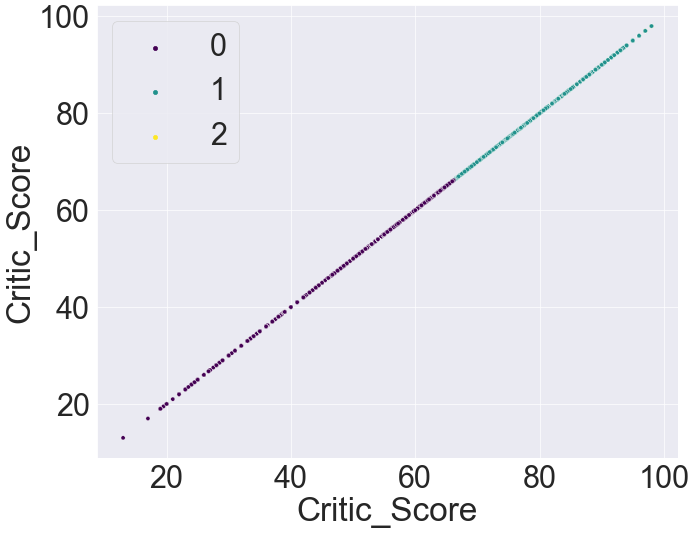

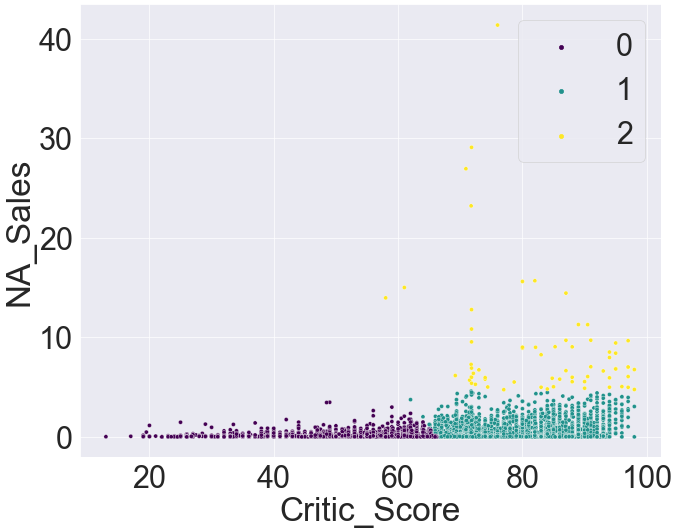

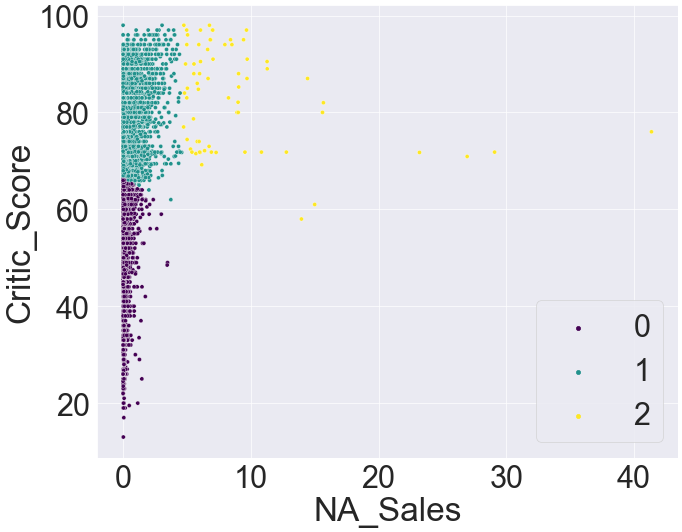

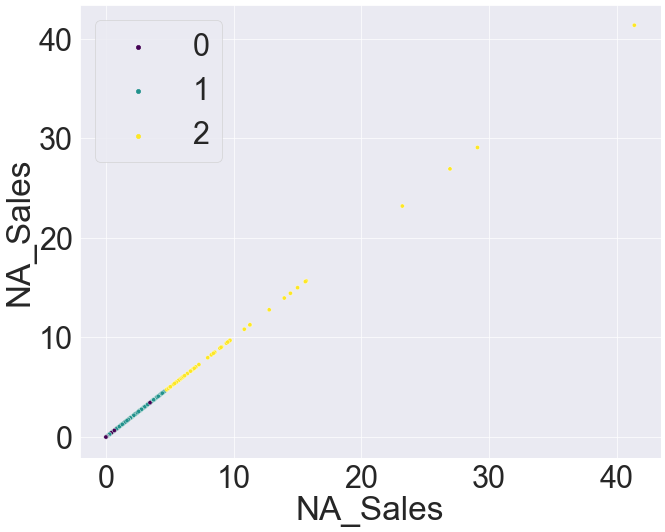

In [241]:
# plotting the attributes to see how they affect the clusters formed 
for col1 in critic_na_sales.columns:
    for col2 in critic_na_sales.columns:
         plt.figure(figsize = (15,12),dpi = 50)
         sns.set(font_scale=4)
         sns.scatterplot(data = critic_na_sales, x = critic_na_sales[col1], y = critic_na_sales[col2], hue=C_labels_critic_na, palette = 'viridis')
         plt.show()

### CRITIC SCORE AND NA SALES Internal and External with GENRE and Rating

In [242]:
print(f'External Evaluation Measures')
print(f'********************************')

v_measure_critic_na = v_measure_score(y_true_kmeans_genre, C_labels_critic_na)
print(f'V-measure Score with Genre: {v_measure_critic_na:.3f}')

v_measure_critic_na = v_measure_score(y_true_kmeans_rating, C_labels_critic_na)
print(f'V-measure Score with Rating: {v_measure_critic_na:.3f}')


rand_index_critic_na = adjusted_rand_score(y_true_kmeans_genre, C_labels_critic_na)
print(f'Rand Index Score with Genre: {rand_index_critic_na:.3f}')

rand_index_critic_na = adjusted_rand_score(y_true_kmeans_rating, C_labels_critic_na)
print(f'Rand Index Score with Rating: {rand_index:.3f}')


mi_score_critic_na = adjusted_mutual_info_score(y_true_kmeans_genre, C_labels_critic_na)
print(f'Mutual Information Score with Genre: {mi_score_critic_na:.3f}')

mi_score_critic_na = adjusted_mutual_info_score(y_true_kmeans_rating, C_labels_critic_na)
print(f'Mutual Information Score with Rating: {mi_score_critic_na:.3f}\n')

print(f'Internal Evaluation Measures')
print(f'********************************')

# Calculate the Davies-Bouldin index
db_score_critic_na = davies_bouldin_score(scaled_critic_na_sales, C_labels_critic_na)
print(f'Davies-Bouldin Index: {db_score_critic_na:.3f}')


s_score_critic_na = silhouette_score(scaled_critic_na_sales, C_labels_critic_na)
print(f'Silhouette Coefficient: {s_score_critic_na:.3f}')

c_score_critic_na = calinski_harabasz_score(scaled_critic_na_sales, C_labels_critic_na)
print(f'Calinski Harabasz Score: {c_score_critic_na:.3f}')

External Evaluation Measures
********************************
V-measure Score with Genre: 0.011
V-measure Score with Rating: 0.004
Rand Index Score with Genre: 0.001
Rand Index Score with Rating: 0.011
Mutual Information Score with Genre: 0.010
Mutual Information Score with Rating: 0.004

Internal Evaluation Measures
********************************
Davies-Bouldin Index: 0.709
Silhouette Coefficient: 0.456
Calinski Harabasz Score: 8992.332


### CRITIC SCORE AND EU SALES

In [243]:
#using the class codes
critic_eu_sales = games[['Critic_Score', 'EU_Sales']]
critic_eu_sales.head(2)

,Critic_Score,EU_Sales
14985,76.761905,0.00
1079,80.833333,0.23


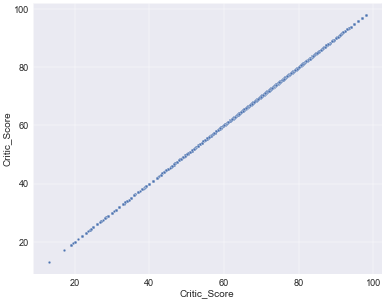

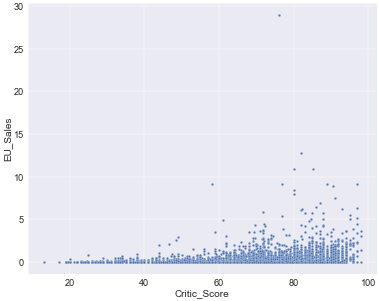

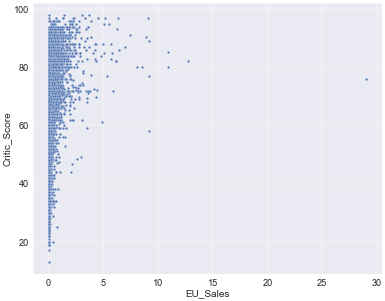

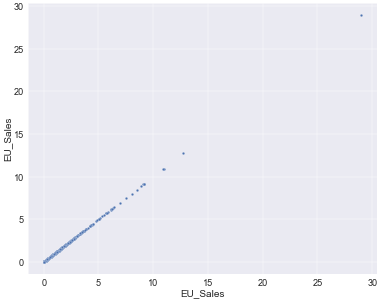

In [244]:
for col1 in critic_eu_sales.columns:
    for col2 in critic_eu_sales.columns:
         plt.figure(figsize = (15,12),dpi = 30)
         sns.set(font_scale=2)
         sns.scatterplot(data = critic_eu_sales, x = critic_eu_sales[col1],y = critic_eu_sales[col2])
         plt.show()

In [245]:
scaled_critic_eu_sales = scaler.fit_transform(critic_eu_sales)
scaled_critic_eu_sales

array([[ 0.55130038, -0.28849523],
       [ 0.89510947,  0.1663432 ],
       [-0.06016709,  0.22566995],
       ...,
       [-0.02674121, -0.11051497],
       [-1.37081357, -0.26871964],
       [-0.36254819, -0.28849523]])

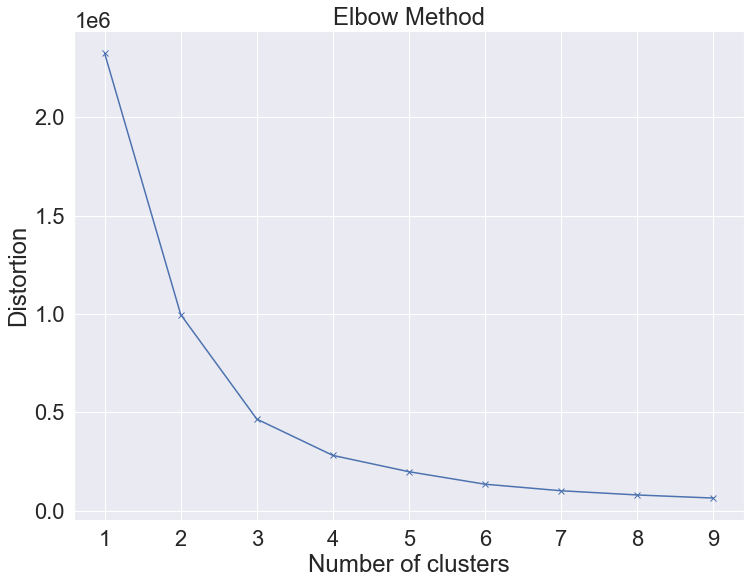

In [246]:
#Determining the suitable number of clusters using Elbow method
distortions_7 = []
K_7 = range(1, 10)
for k in K_7:
     kmeans_critic_eu = KMeans(n_clusters=k, random_state=42)
     kmeans_critic_eu.fit(critic_eu_sales)
     distortions_7.append(kmeans_critic_eu.inertia_)


plt.figure(figsize = (12,9))
plt.plot(K_7, distortions_7, 'bx-')
plt.xlabel('Number of clusters')
plt.ylabel('Distortion')
plt.title('Elbow Method')
plt.show()

In [247]:
# Fit the k-means algorithm
kmeans_critic_eu = KMeans(n_clusters=3, random_state=42)
C_labels_critic_eu = kmeans_critic_eu.fit_predict(scaled_critic_eu_sales)
C_labels_critic_eu

array([1, 1, 1, ..., 1, 0, 1])

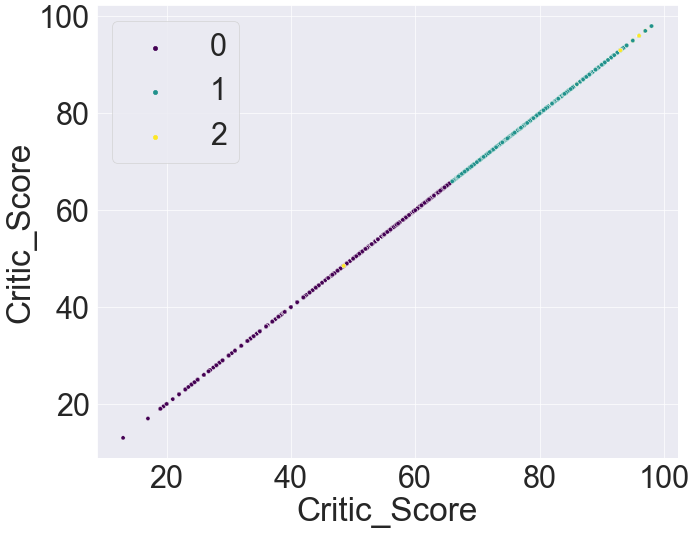

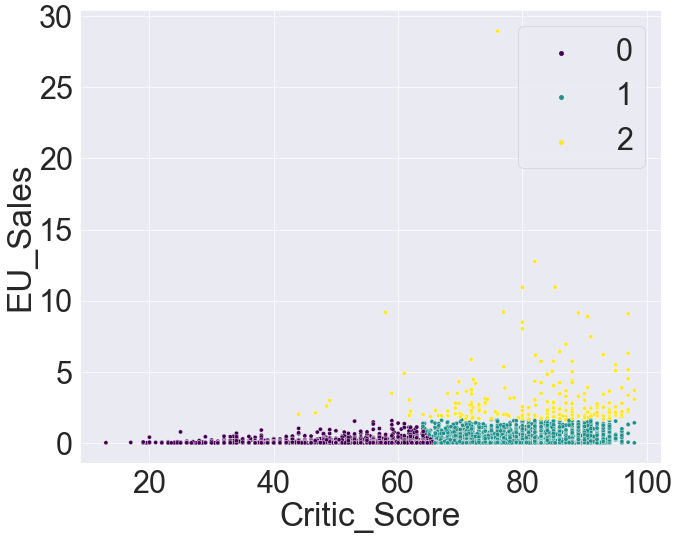

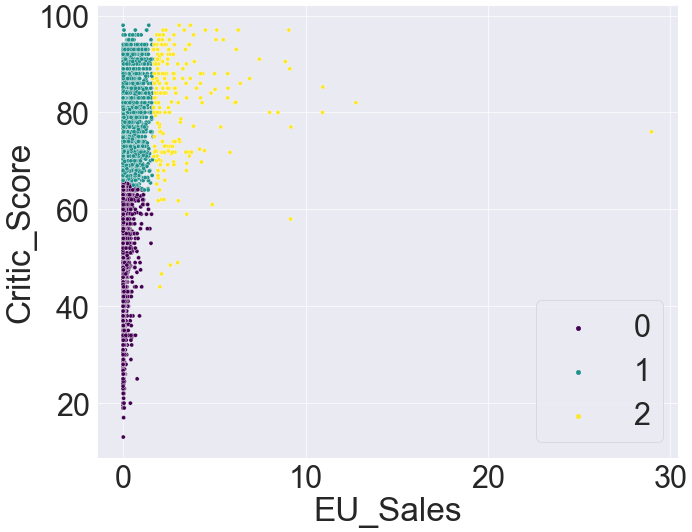

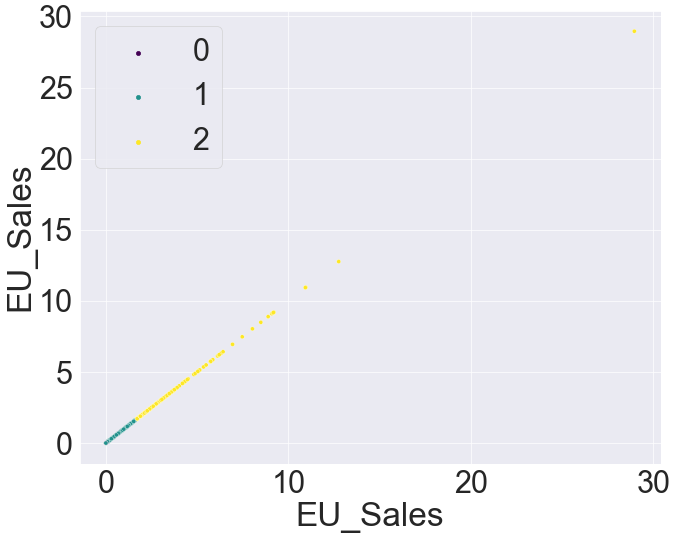

In [248]:
# plotting the attributes to see how they affect the clusters formed 
for col1 in critic_eu_sales.columns:
    for col2 in critic_eu_sales.columns:
         plt.figure(figsize = (15,12),dpi = 50)
         sns.set(font_scale=4)
         sns.scatterplot(data = critic_eu_sales, x = critic_eu_sales[col1], y = critic_eu_sales[col2], hue=C_labels_critic_eu, palette = 'viridis')
         plt.show()

### CRITIC SCORE AND EU SALES Internal and External with GENRE and Rating

In [249]:
print(f'External Evaluation Measures')
print(f'********************************')

v_measure_critic_eu = v_measure_score(y_true_kmeans_genre, C_labels_critic_eu)
print(f'V-measure Score with Genre: {v_measure_critic_eu:.3f}')

v_measure_critic_eu = v_measure_score(y_true_kmeans_rating, C_labels_critic_eu)
print(f'V-measure Score with Rating: {v_measure_critic_eu:.3f}')


rand_index_critic_eu = adjusted_rand_score(y_true_kmeans_genre, C_labels_critic_eu)
print(f'Rand Index Score with Genre: {rand_index_critic_eu:.3f}')

rand_index_critic_eu = adjusted_rand_score(y_true_kmeans_rating, C_labels_critic_eu)
print(f'Rand Index Score with Rating: {rand_index:.3f}')


mi_score_critic_eu = adjusted_mutual_info_score(y_true_kmeans_genre, C_labels_critic_eu)
print(f'Mutual Information Score with Genre: {mi_score_critic_eu:.3f}')

mi_score_critic_eu = adjusted_mutual_info_score(y_true_kmeans_rating, C_labels_critic_eu)
print(f'Mutual Information Score with Rating: {mi_score_critic_eu:.3f}\n')

print(f'Internal Evaluation Measures')
print(f'********************************')

# Calculate the Davies-Bouldin index
db_score_critic_eu = davies_bouldin_score(scaled_critic_eu_sales, C_labels_critic_eu)
print(f'Davies-Bouldin Index: {db_score_critic_eu:.3f}')


s_score_critic_eu = silhouette_score(scaled_critic_eu_sales, C_labels_critic_eu)
print(f'Silhouette Coefficient: {s_score_critic_eu:.3f}')

c_score_critic_eu = calinski_harabasz_score(scaled_critic_eu_sales, C_labels_critic_eu)
print(f'Calinski Harabasz Score: {c_score_critic_eu:.3f}')

External Evaluation Measures
********************************
V-measure Score with Genre: 0.010
V-measure Score with Rating: 0.004
Rand Index Score with Genre: -0.000
Rand Index Score with Rating: 0.011
Mutual Information Score with Genre: 0.010
Mutual Information Score with Rating: 0.004

Internal Evaluation Measures
********************************
Davies-Bouldin Index: 0.710
Silhouette Coefficient: 0.485
Calinski Harabasz Score: 9387.286


### CRITIC SCORE AND JP SALES

In [250]:
#using the class codes
critic_jp_sales = games[['Critic_Score', 'JP_Sales']]
critic_jp_sales.head(2)

,Critic_Score,JP_Sales
14985,76.761905,0.03
1079,80.833333,0.52


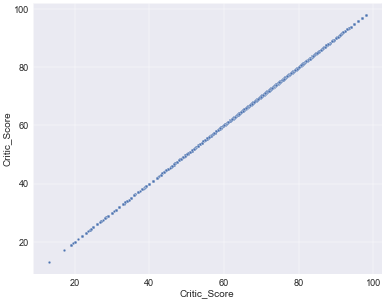

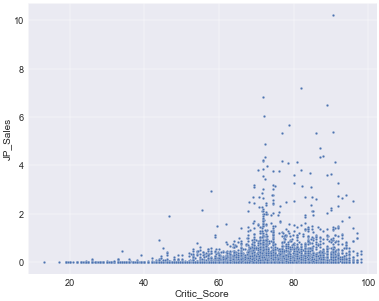

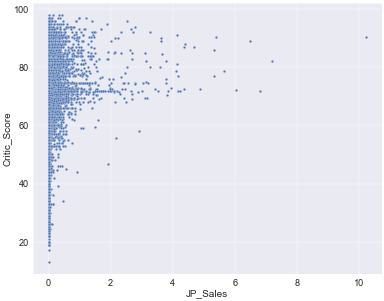

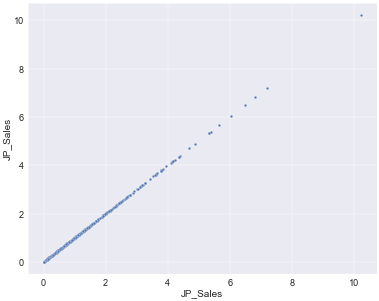

In [251]:
for col1 in critic_jp_sales.columns:
    for col2 in critic_jp_sales.columns:
         plt.figure(figsize = (15,12),dpi = 30)
         sns.set(font_scale=2)
         sns.scatterplot(data = critic_jp_sales, x = critic_jp_sales[col1],y = critic_jp_sales[col2])
         plt.show()

In [252]:
scaled_critic_jp_sales = scaler.fit_transform(critic_jp_sales)
scaled_critic_jp_sales

array([[ 0.55130038, -0.15512643],
       [ 0.89510947,  1.42423982],
       [-0.06016709, -0.25182233],
       ...,
       [-0.02674121, -0.25182233],
       [-1.37081357, -0.25182233],
       [-0.36254819,  0.19942517]])

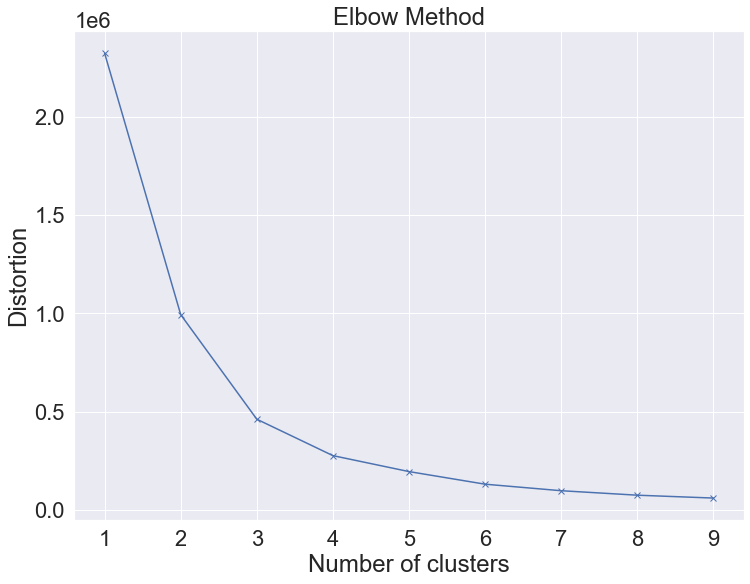

In [253]:
#Determining the suitable number of clusters using Elbow method
distortions_8 = []
K_8 = range(1, 10)
for k in K_8:
     kmeans_critic_jp = KMeans(n_clusters=k, random_state=42)
     kmeans_critic_jp.fit(critic_jp_sales)
     distortions_8.append(kmeans_critic_jp.inertia_)


plt.figure(figsize = (12,9))
plt.plot(K_8, distortions_8, 'bx-')
plt.xlabel('Number of clusters')
plt.ylabel('Distortion')
plt.title('Elbow Method')
plt.show()

In [254]:
# Fit the k-means algorithm
kmeans_critic_jp = KMeans(n_clusters=3, random_state=42)
C_labels_critic_jp = kmeans_critic_jp.fit_predict(scaled_critic_jp_sales)
C_labels_critic_jp

array([0, 0, 0, ..., 0, 2, 0])

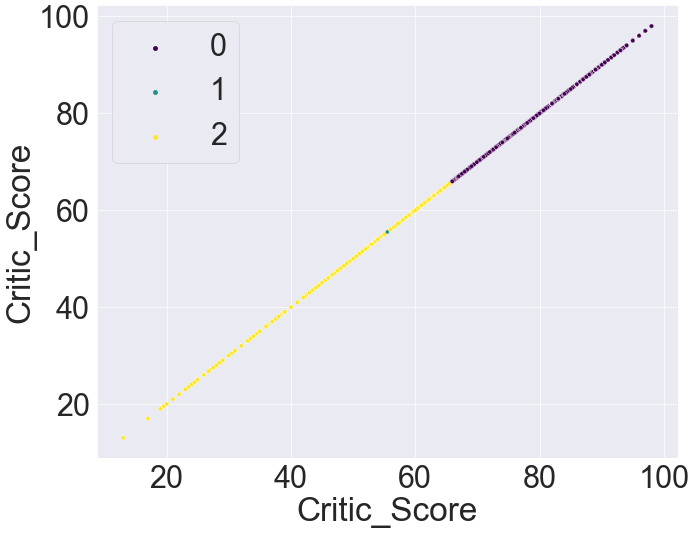

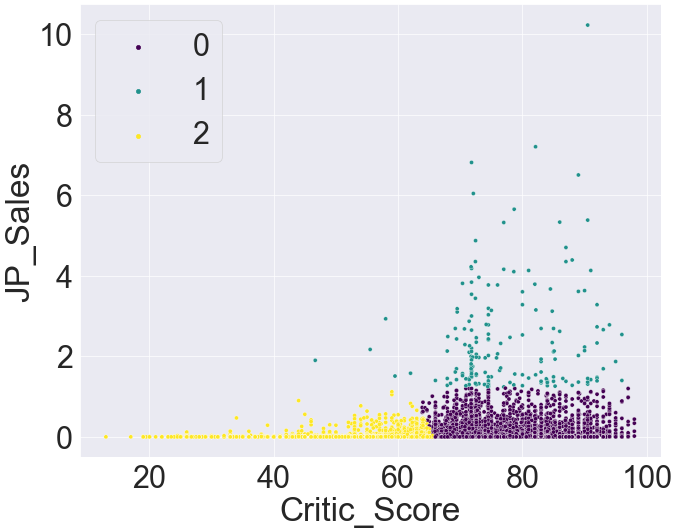

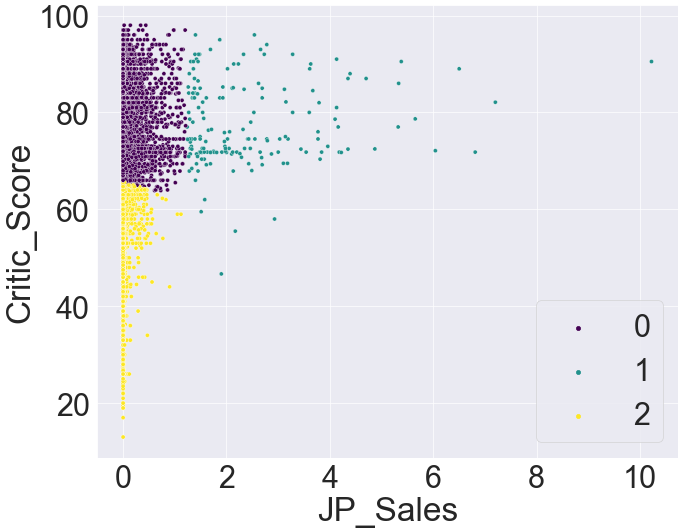

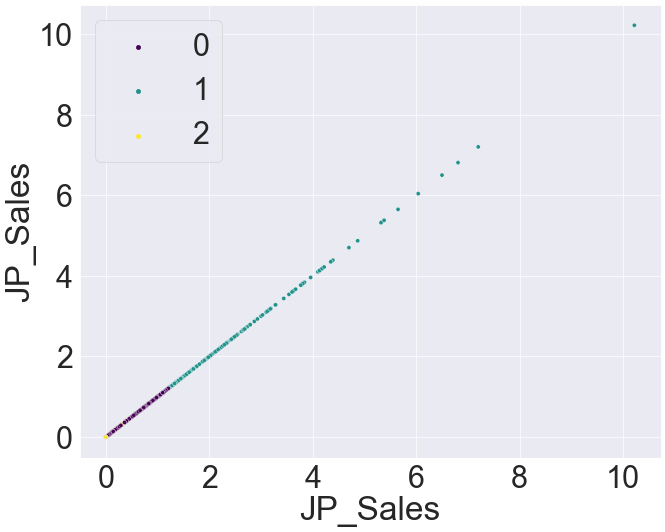

In [255]:
# plotting the attributes to see how they affect the clusters formed 
for col1 in critic_jp_sales.columns:
    for col2 in critic_jp_sales.columns:
         plt.figure(figsize = (15,12),dpi = 50)
         sns.set(font_scale=4)
         sns.scatterplot(data = critic_jp_sales, x = critic_jp_sales[col1], y = critic_jp_sales[col2], hue=C_labels_critic_jp, palette = 'viridis')
         plt.show()

### CRITIC SCORE AND JP SALES Internal and External with GENRE and Rating

In [256]:
print(f'External Evaluation Measures')
print(f'********************************')

v_measure_critic_jp = v_measure_score(y_true_kmeans_genre, C_labels_critic_jp)
print(f'V-measure Score with Genre: {v_measure_critic_jp:.3f}')

v_measure_critic_jp = v_measure_score(y_true_kmeans_rating, C_labels_critic_jp)
print(f'V-measure Score with Rating: {v_measure_critic_jp:.3f}')


rand_index_critic_jp = adjusted_rand_score(y_true_kmeans_genre, C_labels_critic_jp)
print(f'Rand Index Score with Genre: {rand_index_critic_jp:.3f}')

rand_index_critic_jp = adjusted_rand_score(y_true_kmeans_rating, C_labels_critic_jp)
print(f'Rand Index Score with Rating: {rand_index:.3f}')


mi_score_critic_jp = adjusted_mutual_info_score(y_true_kmeans_genre, C_labels_critic_jp)
print(f'Mutual Information Score with Genre: {mi_score_critic_jp:.3f}')

mi_score_critic_jp = adjusted_mutual_info_score(y_true_kmeans_rating, C_labels_critic_jp)
print(f'Mutual Information Score with Rating: {mi_score_critic_jp:.3f}\n')

print(f'Internal Evaluation Measures')
print(f'********************************')

# Calculate the Davies-Bouldin index
db_score_critic_jp = davies_bouldin_score(scaled_critic_jp_sales, C_labels_critic_jp)
print(f'Davies-Bouldin Index: {db_score_critic_jp:.3f}')


s_score_critic_jp = silhouette_score(scaled_critic_jp_sales, C_labels_critic_jp)
print(f'Silhouette Coefficient: {s_score_critic_jp:.3f}')

c_score_critic_jp = calinski_harabasz_score(scaled_critic_jp_sales, C_labels_critic_jp)
print(f'Calinski Harabasz Score: {c_score_critic_jp:.3f}')

External Evaluation Measures
********************************
V-measure Score with Genre: 0.012
V-measure Score with Rating: 0.003
Rand Index Score with Genre: 0.001
Rand Index Score with Rating: 0.011
Mutual Information Score with Genre: 0.012
Mutual Information Score with Rating: 0.003

Internal Evaluation Measures
********************************
Davies-Bouldin Index: 0.679
Silhouette Coefficient: 0.483
Calinski Harabasz Score: 11762.876


### CRITIC SCORE AND GLOBAL SALES

In [257]:
#using the class codes
critic_global_sales = games[['Critic_Score', 'Global_Sales']]
critic_global_sales.head(2)

,Critic_Score,Global_Sales
14985,76.761905,0.03
1079,80.833333,1.68


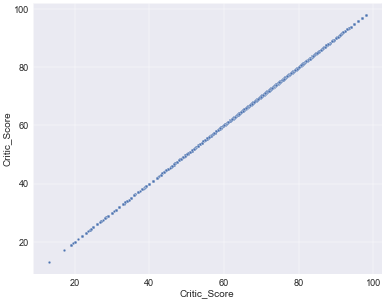

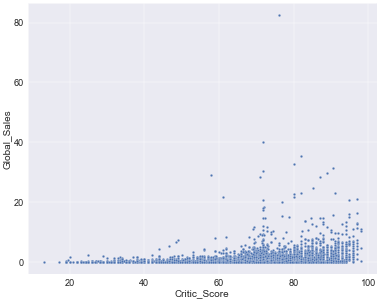

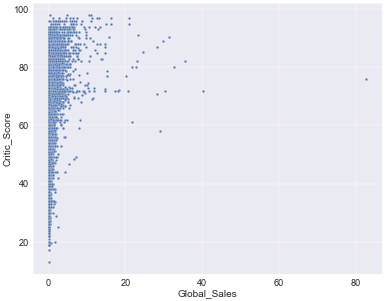

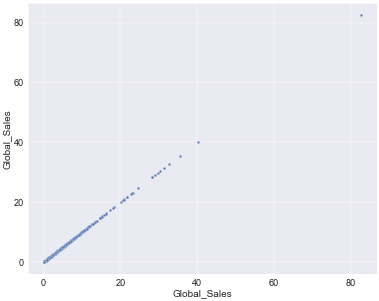

In [258]:
for col1 in critic_global_sales.columns:
    for col2 in critic_global_sales.columns:
         plt.figure(figsize = (15,12),dpi = 30)
         sns.set(font_scale=2)
         sns.scatterplot(data = critic_global_sales, x = critic_global_sales[col1],y = critic_global_sales[col2])
         plt.show()

In [259]:
scaled_critic_global_sales = scaler.fit_transform(critic_global_sales)
scaled_critic_global_sales

array([[ 0.55130038, -0.32533977],
       [ 0.89510947,  0.73571681],
       [-0.06016709, -0.01023812],
       ...,
       [-0.02674121, -0.23531073],
       [-1.37081357, -0.33177042],
       [-0.36254819, -0.25460266]])

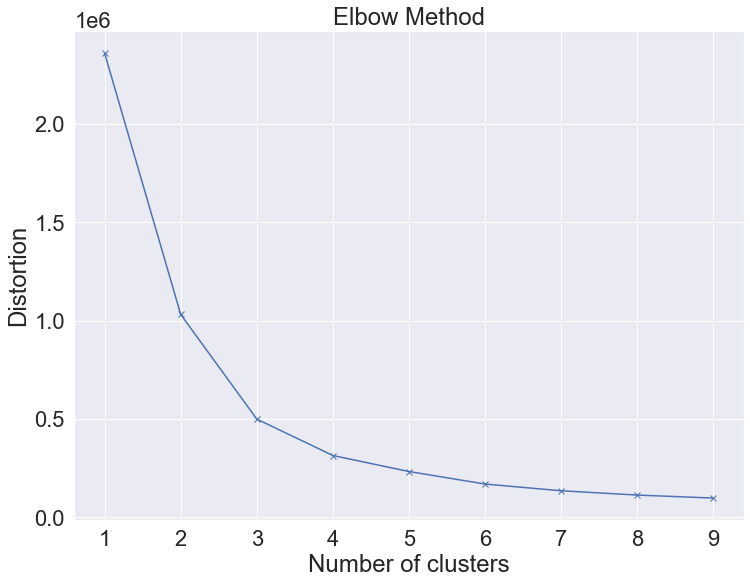

In [260]:
#Determining the suitable number of clusters using Elbow method
distortions_9 = []
K_9 = range(1, 10)
for k in K_9:
     kmeans_critic_global = KMeans(n_clusters=k, random_state=42)
     kmeans_critic_global.fit(critic_global_sales)
     distortions_9.append(kmeans_critic_global.inertia_)


plt.figure(figsize = (12,9))
plt.plot(K_9, distortions_9, 'bx-')
plt.xlabel('Number of clusters')
plt.ylabel('Distortion')
plt.title('Elbow Method')
plt.show()

In [261]:
# Fit the k-means algorithm
kmeans_critic_global = KMeans(n_clusters=3, random_state=42)
C_labels_critic_global = kmeans_critic_global.fit_predict(scaled_critic_global_sales)
C_labels_critic_global

array([2, 2, 2, ..., 2, 0, 0])

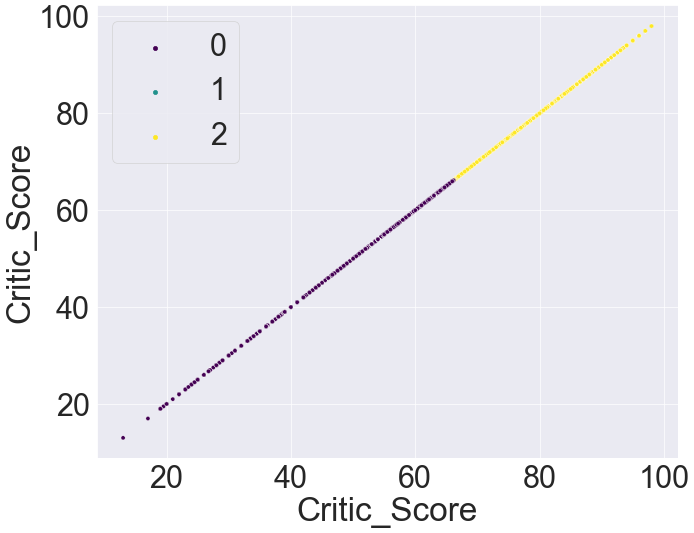

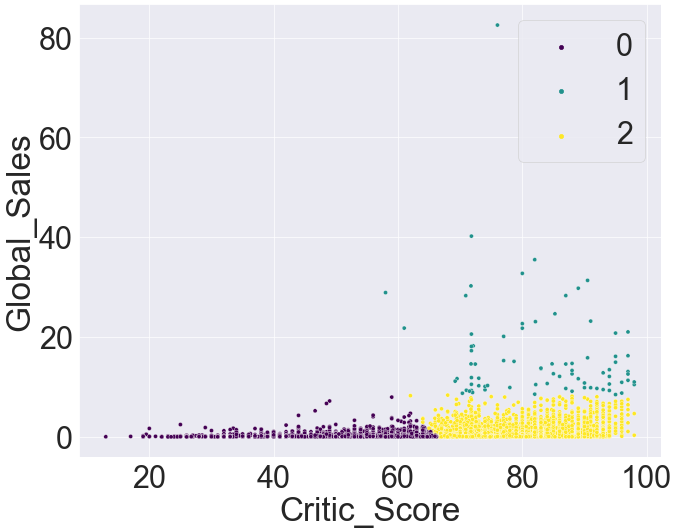

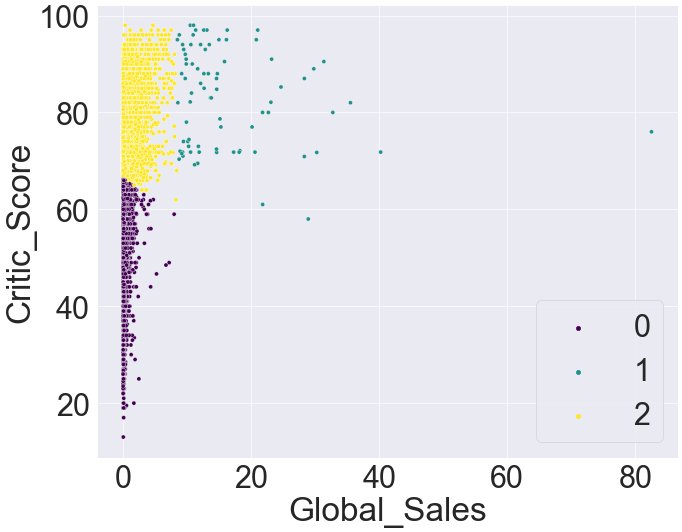

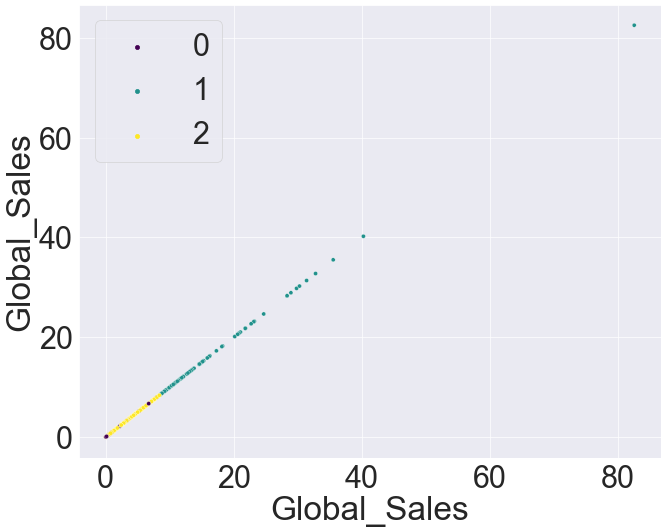

In [262]:
# plotting the attributes to see how they affect the clusters formed 
for col1 in critic_global_sales.columns:
    for col2 in critic_global_sales.columns:
         plt.figure(figsize = (15,12),dpi = 50)
         sns.set(font_scale=4)
         sns.scatterplot(data = critic_global_sales, x = critic_global_sales[col1], y = critic_global_sales[col2], hue=C_labels_critic_global, palette = 'viridis')
         plt.show()

### CRITIC SCORE AND GLOBAL SALES Internal and External with GENRE and Rating

In [263]:
print(f'External Evaluation Measures')
print(f'********************************')

v_measure_critic_global = v_measure_score(y_true_kmeans_genre, C_labels_critic_global)
print(f'V-measure Score with Genre: {v_measure_critic_global:.3f}')

v_measure_critic_global = v_measure_score(y_true_kmeans_rating, C_labels_critic_global)
print(f'V-measure Score with Rating: {v_measure_critic_global:.3f}')


rand_index_critic_global = adjusted_rand_score(y_true_kmeans_genre, C_labels_critic_global)
print(f'Rand Index Score with Genre: {rand_index_critic_global:.3f}')

rand_index_critic_global = adjusted_rand_score(y_true_kmeans_rating, C_labels_critic_global)
print(f'Rand Index Score with Rating: {rand_index:.3f}')


mi_score_critic_global = adjusted_mutual_info_score(y_true_kmeans_genre, C_labels_critic_global)
print(f'Mutual Information Score with Genre: {mi_score_critic_global:.3f}')

mi_score_critic_global = adjusted_mutual_info_score(y_true_kmeans_rating, C_labels_critic_global)
print(f'Mutual Information Score with Rating: {mi_score_critic_global:.3f}\n')

print(f'Internal Evaluation Measures')
print(f'********************************')

# Calculate the Davies-Bouldin index
db_score_critic_global = davies_bouldin_score(scaled_critic_global_sales, C_labels_critic_global)
print(f'Davies-Bouldin Index: {db_score_critic_global:.3f}')


s_score_critic_global = silhouette_score(scaled_critic_global_sales, C_labels_critic_global)
print(f'Silhouette Coefficient: {s_score_critic_global:.3f}')

c_score_critic_global = calinski_harabasz_score(scaled_critic_global_sales, C_labels_critic_global)
print(f'Calinski Harabasz Score: {c_score_critic_global:.3f}')

External Evaluation Measures
********************************
V-measure Score with Genre: 0.011
V-measure Score with Rating: 0.004
Rand Index Score with Genre: 0.001
Rand Index Score with Rating: 0.011
Mutual Information Score with Genre: 0.010
Mutual Information Score with Rating: 0.004

Internal Evaluation Measures
********************************
Davies-Bouldin Index: 0.701
Silhouette Coefficient: 0.459
Calinski Harabasz Score: 9678.728


### CRITIC SCORE AND OTHER SALES

In [264]:
#using the class codes
critic_other_sales = games[['Critic_Score', 'Other_Sales']]
critic_other_sales.head(2)

,Critic_Score,Other_Sales
14985,76.761905,0.00
1079,80.833333,0.11


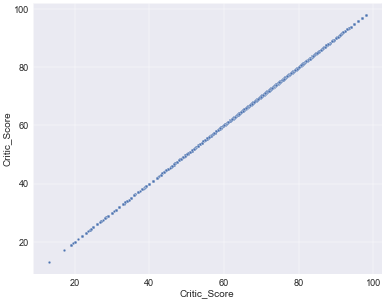

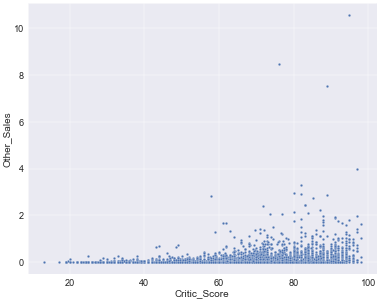

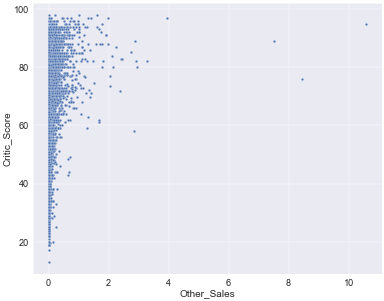

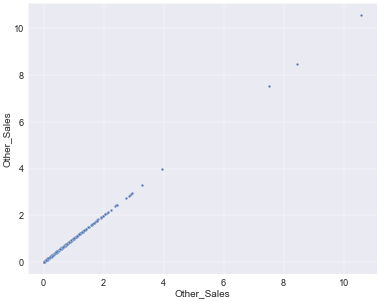

In [265]:
for col1 in critic_other_sales.columns:
    for col2 in critic_other_sales.columns:
         plt.figure(figsize = (15,12),dpi = 30)
         sns.set(font_scale=2)
         sns.scatterplot(data = critic_other_sales, x = critic_other_sales[col1],y = critic_other_sales[col2])
         plt.show()

In [266]:
scaled_critic_other_sales = scaler.fit_transform(critic_other_sales)
scaled_critic_other_sales

array([[ 0.55130038, -0.25392168],
       [ 0.89510947,  0.33247153],
       [-0.06016709, -0.04068779],
       ...,
       [-0.02674121, -0.14730473],
       [-1.37081357, -0.25392168],
       [-0.36254819, -0.25392168]])

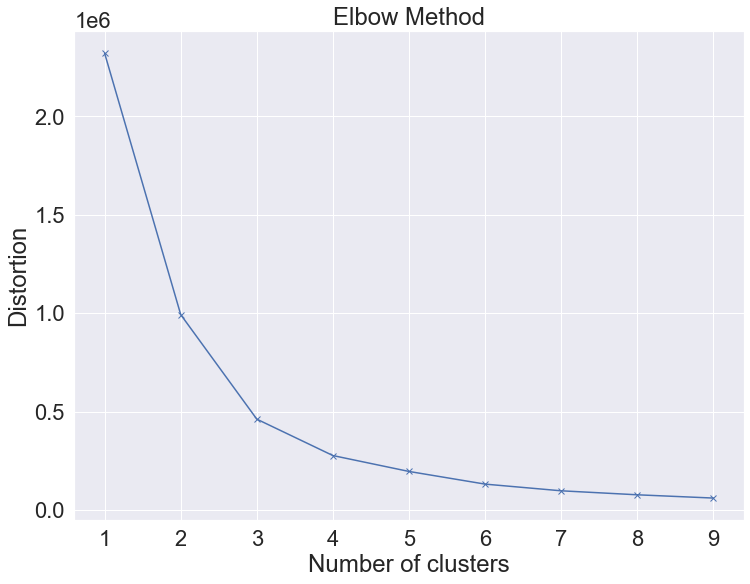

In [267]:
#Determining the suitable number of clusters using Elbow method
distortions_10 = []
K_10 = range(1, 10)
for k in K_10:
     kmeans_critic_other = KMeans(n_clusters=k, random_state=42)
     kmeans_critic_other.fit(critic_other_sales)
     distortions_10.append(kmeans_critic_other.inertia_)


plt.figure(figsize = (12,9))
plt.plot(K_10, distortions_10, 'bx-')
plt.xlabel('Number of clusters')
plt.ylabel('Distortion')
plt.title('Elbow Method')
plt.show()

In [268]:
# Fit the k-means algorithm
kmeans_critic_other = KMeans(n_clusters=3, random_state=42)
C_labels_critic_other = kmeans_critic_other.fit_predict(scaled_critic_other_sales)
C_labels_critic_other

array([0, 0, 0, ..., 0, 1, 0])

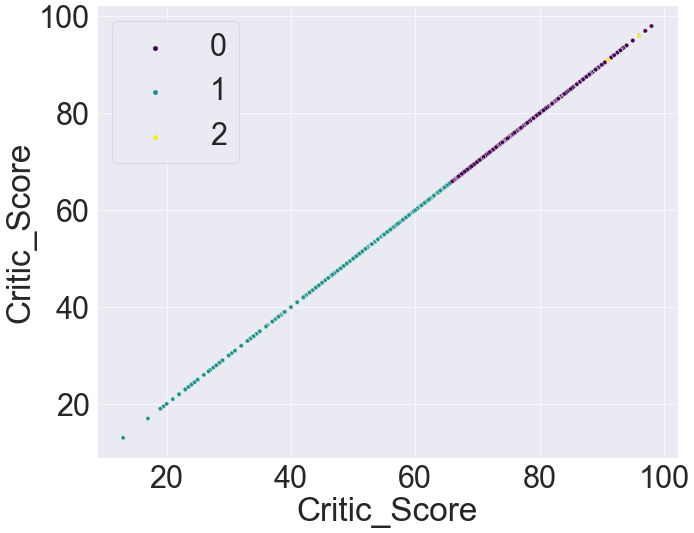

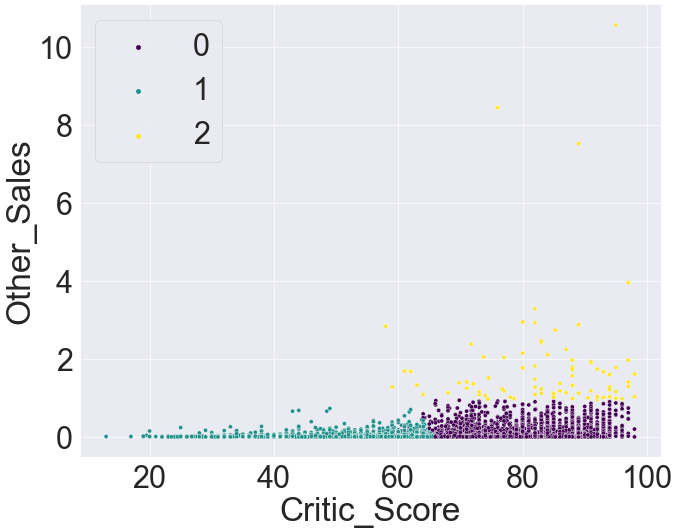

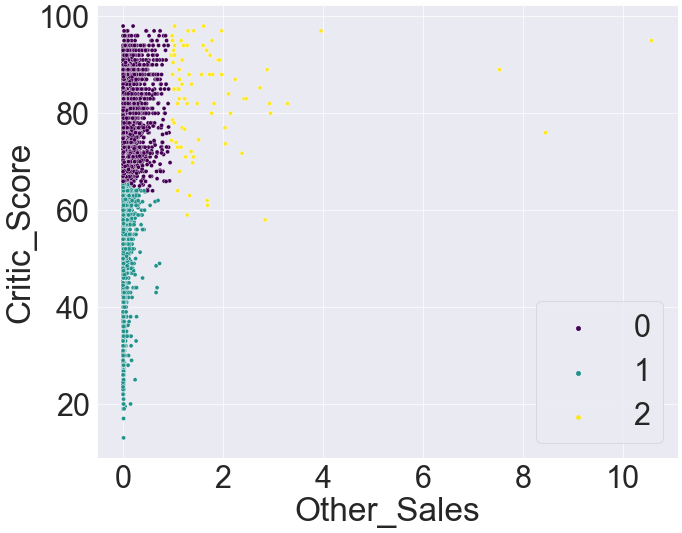

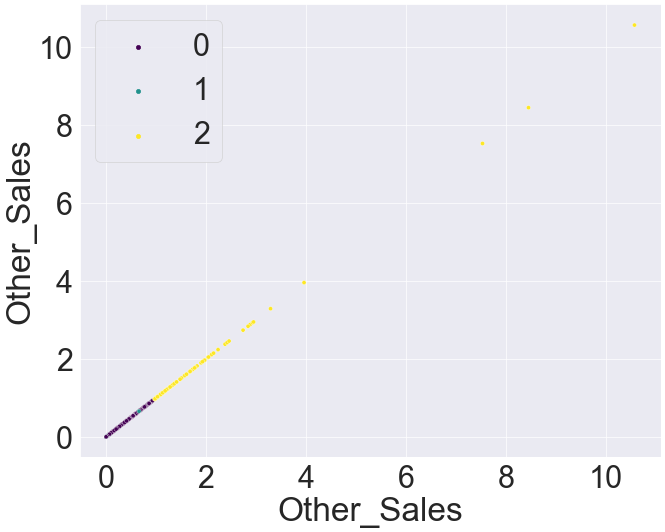

In [269]:
# plotting the attributes to see how they affect the clusters formed 
for col1 in critic_other_sales.columns:
    for col2 in critic_other_sales.columns:
         plt.figure(figsize = (15,12),dpi = 50)
         sns.set(font_scale=4)
         sns.scatterplot(data = critic_other_sales, x = critic_other_sales[col1], y = critic_other_sales[col2], hue=C_labels_critic_other, palette = 'viridis')
         plt.show()

### CRITIC SCORE AND OTHER SALES Internal and External with GENRE and Rating

In [270]:
print(f'External Evaluation Measures')
print(f'********************************')

v_measure_critic_other = v_measure_score(y_true_kmeans_genre, C_labels_critic_other)
print(f'V-measure Score with Genre: {v_measure_critic_other:.3f}')

v_measure_critic_other = v_measure_score(y_true_kmeans_rating, C_labels_critic_other)
print(f'V-measure Score with Rating: {v_measure_critic_other:.3f}')


rand_index_critic_other = adjusted_rand_score(y_true_kmeans_genre, C_labels_critic_other)
print(f'Rand Index Score with Genre: {rand_index_critic_other:.3f}')

rand_index_critic_other = adjusted_rand_score(y_true_kmeans_rating, C_labels_critic_other)
print(f'Rand Index Score with Rating: {rand_index:.3f}')


mi_score_critic_other = adjusted_mutual_info_score(y_true_kmeans_genre, C_labels_critic_other)
print(f'Mutual Information Score with Genre: {mi_score_critic_other:.3f}')

mi_score_critic_other = adjusted_mutual_info_score(y_true_kmeans_rating, C_labels_critic_other)
print(f'Mutual Information Score with Rating: {mi_score_critic_other:.3f}\n')

print(f'Internal Evaluation Measures')
print(f'********************************')

# Calculate the Davies-Bouldin index
db_score_critic_other = davies_bouldin_score(scaled_critic_other_sales, C_labels_critic_other)
print(f'Davies-Bouldin Index: {db_score_critic_other:.3f}')


s_score_critic_other = silhouette_score(scaled_critic_other_sales, C_labels_critic_other)
print(f'Silhouette Coefficient: {s_score_critic_other:.3f}')

c_score_critic_other = calinski_harabasz_score(scaled_critic_other_sales, C_labels_critic_other)
print(f'Calinski Harabasz Score: {c_score_critic_other:.3f}')

External Evaluation Measures
********************************
V-measure Score with Genre: 0.010
V-measure Score with Rating: 0.004
Rand Index Score with Genre: -0.000
Rand Index Score with Rating: 0.011
Mutual Information Score with Genre: 0.010
Mutual Information Score with Rating: 0.003

Internal Evaluation Measures
********************************
Davies-Bouldin Index: 0.689
Silhouette Coefficient: 0.486
Calinski Harabasz Score: 8713.061
